<a href="https://colab.research.google.com/github/diegochi24/Codifo_paper_COVID-2024/blob/main/Codigo_paper_COVID_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [253]:
#Cargando las librerias
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import networkx as nx
from google.colab import files
import openpyxl #Para leer archivos que le subimos
from scipy.spatial.distance import hamming
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.metrics import pairwise_distances
from sklearn.metrics import silhouette_score

In [254]:
#Cargar base de datos
uploaded = files.upload()

#Leer el documento
covid = pd.read_excel('Covid_Jose.xlsx', sheet_name='SINTOMAS')

#Mostrar las primeras filas
print(covid.head())

Saving Covid_Jose.xlsx to Covid_Jose (7).xlsx
   edad Gen educa estcivil  estrato EstVac-19 Sintcovid-19 DOLOR C PT OLFATO  \
0    82   F    Pr       Vi      3.0         S           Md       S         S   
1    44   F     S       Ca      3.0         S           Md       S         N   
2    67   M     P       Ca      3.0         S           Lv       S         N   
3    23   F    Tc       So      3.0         S           Md       S         S   
4    23   F     S       So      5.0         N           Md       S         S   

  PP OLFATO  ... CONFUS_2 DESORIENTA_2 F ENERGIA_2 TEMBLOR_2 DIF NOMP_2  \
0         S  ...        N            N           S         N          N   
1         N  ...        N            N           N         N          N   
2         S  ...        N            N           N         N          N   
3         S  ...        N            N           N         N          N   
4         S  ...        N            N           S         N          N   

  DEPRES_2 ANSIED_2 C 

In [255]:
# ===============PREPROCESAMIENTO DE DATOS===============
print("Contar los valores perdidos")
for col in covid.columns:
    cantidad_perdidos = covid[col].isna().sum()
    print(f"La cantidad de valores perdidos en {col} es {cantidad_perdidos}")

# Filas con NA
filas_con_na = covid[covid.isna().any(axis=1)]
print(filas_con_na)

# Eliminar las filas con valores perdidos
covid = covid.dropna()


Contar los valores perdidos
La cantidad de valores perdidos en edad es 0
La cantidad de valores perdidos en Gen es 0
La cantidad de valores perdidos en educa es 0
La cantidad de valores perdidos en estcivil es 2
La cantidad de valores perdidos en estrato es 4
La cantidad de valores perdidos en EstVac-19 es 0
La cantidad de valores perdidos en Sintcovid-19 es 1
La cantidad de valores perdidos en DOLOR C es 0
La cantidad de valores perdidos en PT OLFATO es 0
La cantidad de valores perdidos en PP OLFATO es 0
La cantidad de valores perdidos en P GUSTO es 0
La cantidad de valores perdidos en CONFUS es 0
La cantidad de valores perdidos en DESORIENTA es 0
La cantidad de valores perdidos en F ENERGIA es 0
La cantidad de valores perdidos en TEMBLOR es 0
La cantidad de valores perdidos en DIF NOMP es 0
La cantidad de valores perdidos en DEPRES es 0
La cantidad de valores perdidos en ANSIED es 0
La cantidad de valores perdidos en C FATIGA es 0
La cantidad de valores perdidos en OLOR FAN es 0
La c

In [256]:
#Verificar los valores uncios por cada variable
def limpiar_texto(x):
    if isinstance(x, str):  # Verifica si es una cadena de texto
        return x.strip().upper()  # Elimina espacios y convierte a mayúsculas
    return x

# Aplicar la función a cada columna de texto en el DataFrame
for col in covid.columns:
    if covid[col].dtype == 'object':  # Verifica si la columna es de tipo texto
        covid[col] = covid[col].apply(limpiar_texto)  # Limpiar y convertir a mayúsculas

#Variables erroneamente codificadas
covid = covid[covid['estcivil'] != 'S'] #En el paper final del profesor Jose, no sale categoria "S", se asume como error de tipeo entre So o Se
covid = covid[covid['estcivil']!= 'UI']  #En el paper final del profesor Jose, no sale categoria "Ui", se asume como error de tipeo
covid['estrato'] = covid['estrato'].astype(int)

# RECODIFICACIÓN DE VARIABLES PARA QUE TENGAN EL MISMO LARGO
covid['educa'] = covid['educa'].replace({'P': 'P', 'S': 'S','POS':'G', 'PR': 'R', 'TG':'T', 'TC':'T'}) #Aqui consideré tecnico y tegnologico como el mismo.
covid['estcivil']=covid['estcivil'].replace({'VI':'V','CA':'C','SO':'S','UL':'U','SE':'E','DI':'D'})
covid['Sintcovid-19']=covid['Sintcovid-19'].replace({'LV':'L','MD':'M','SV':'E','SS':'S'})

for col in covid.columns:
  unique_values = covid[col].unique()  #Verifico si se ingresaron bien las respyestas.
  print(f"Valores únicos en {col.upper()}: {unique_values}")


Valores únicos en EDAD: [82 44 67 23 43 70 38 83 68 40 65 57 49 74 50 45 58 63 46 66 56 47 73 60
 35 34 39 55 53 32 36 42 41 76 52 18 54 26 75 20 59 37 51 72 62 48 24 86
 29 81 64 77 21 85 61 19 28 84 25 30 22 14 27 31 33 17]
Valores únicos en GEN: ['F' 'M']
Valores únicos en EDUCA: ['R' 'S' 'P' 'T' 'G']
Valores únicos en ESTCIVIL: ['V' 'C' 'S' 'U' 'E' 'D']
Valores únicos en ESTRATO: [3 5 2 1 4 6]
Valores únicos en ESTVAC-19: ['S' 'N']
Valores únicos en SINTCOVID-19: ['M' 'L' 'E' 'S']
Valores únicos en DOLOR C: ['S' 'N']
Valores únicos en PT OLFATO: ['S' 'N']
Valores únicos en PP OLFATO: ['S' 'N']
Valores únicos en P GUSTO: ['S' 'N']
Valores únicos en CONFUS: ['S' 'N']
Valores únicos en DESORIENTA: ['N' 'S']
Valores únicos en F ENERGIA: ['N' 'S']
Valores únicos en TEMBLOR: ['S' 'N']
Valores únicos en DIF NOMP: ['S' 'N']
Valores únicos en DEPRES: ['N' 'S']
Valores únicos en ANSIED: ['N' 'S']
Valores únicos en C FATIGA: ['N' 'S']
Valores únicos en OLOR FAN: ['S' 'N']
Valores únicos en VE

Moda de Edad: 28
Media de Edad: 36.477959697733
Mediana de Edad: 34.0


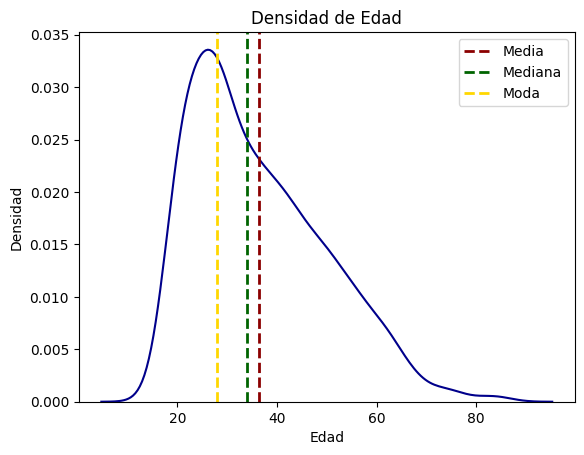

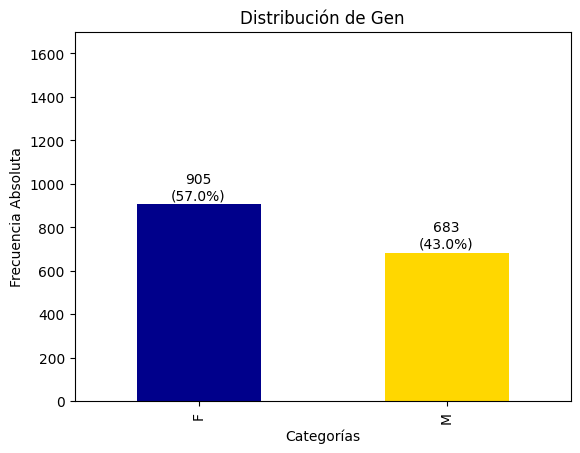

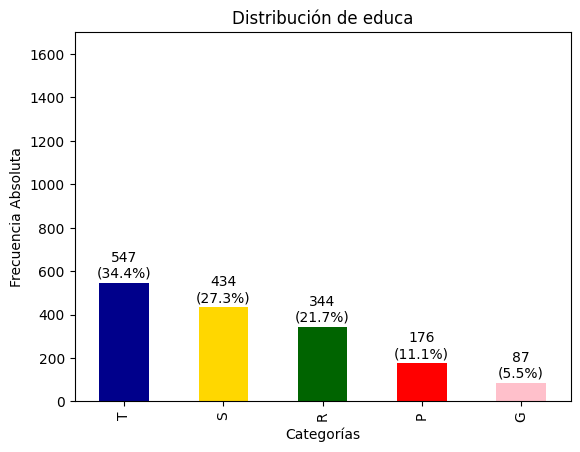

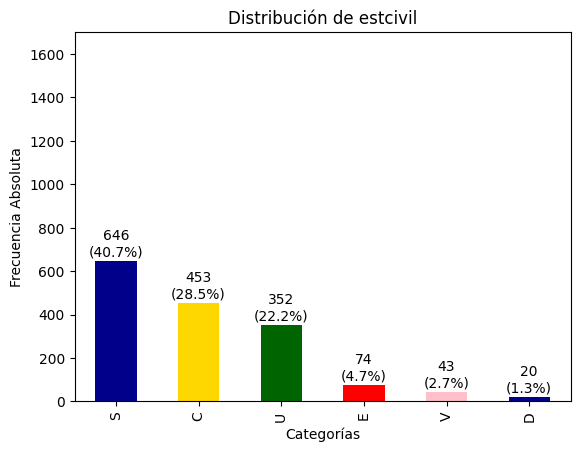

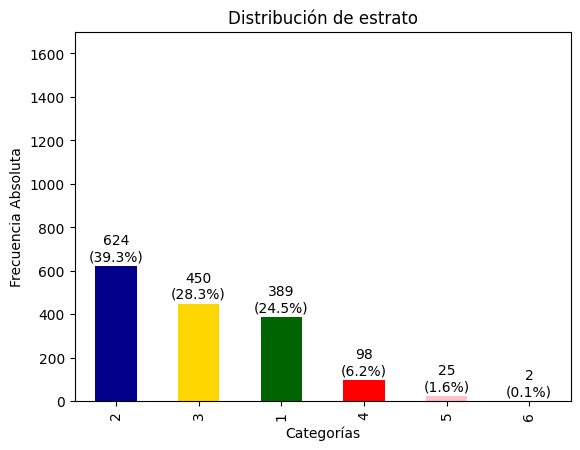

...

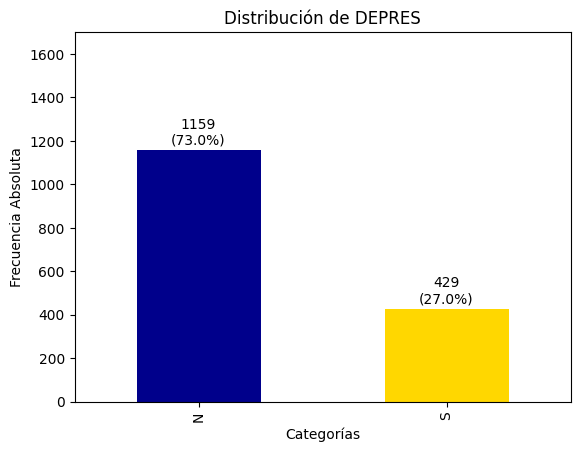

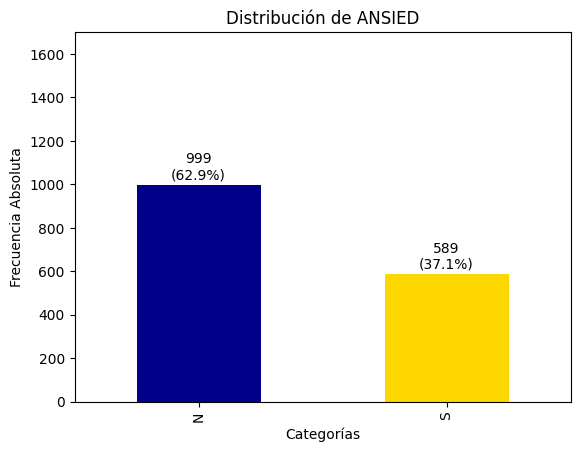

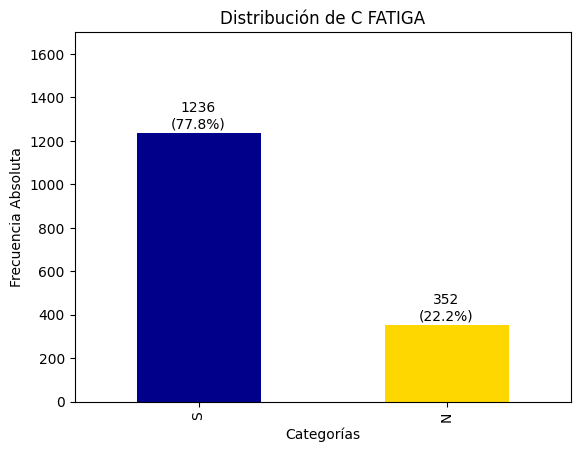

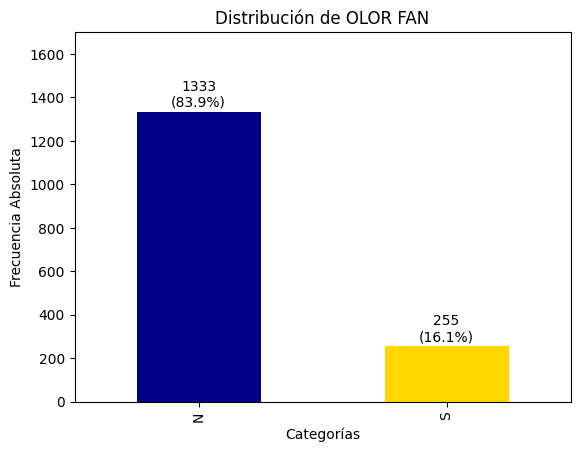

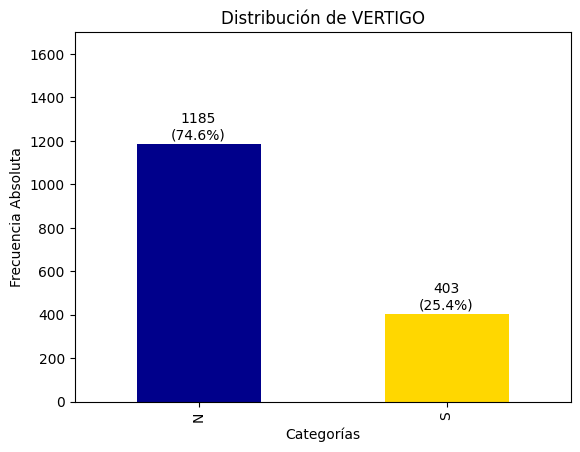

In [257]:
# ==================ANÁLISIS DESCRIPTIVO==================

# Calcular la moda
def moda(x):
    vals, counts = np.unique(x, return_counts=True)
    moda_valor = vals[np.argmax(counts)]
    return moda_valor

# Extraer la variable edad, omitiendo NA
edad = covid['edad'].dropna()

# Calcular moda, media y mediana
moda_edad = moda(edad)
media_edad = edad.mean()
mediana_edad = edad.median()

# Mostrar los resultados
print(f"Moda de Edad: {moda_edad}")
print(f"Media de Edad: {media_edad}")
print(f"Mediana de Edad: {mediana_edad}")

# Graficar la densidad de la variable edad que es la unica que es numerica
sns.kdeplot(edad, color="darkblue")
plt.axvline(media_edad, color='darkred', linestyle='--', linewidth=2, label='Media')
plt.axvline(mediana_edad, color='darkgreen', linestyle='--', linewidth=2, label='Mediana')
plt.axvline(moda_edad, color='gold', linestyle='--', linewidth=2, label='Moda')
plt.title("Densidad de Edad")
plt.xlabel("Edad")
plt.ylabel("Densidad")
plt.legend()
plt.show()

# ============PRIMER PERIODO=================
#Realizamos el analisis descriptivo del primero periodo (BEFORE)
covid_before = covid.iloc[:, :21]#Contempla las primera 21 columnas

for col_name in covid_before.columns:
    if col_name != 'edad':
        covid_before[col_name] = covid_before[col_name].astype('category')
        value_counts = covid_before[col_name].value_counts()
        ax = value_counts.plot(kind='bar', color=["darkblue", "gold", "darkgreen", "red", "pink"])

        # Añadir títulos y etiquetas
        plt.title(f"Distribución de {col_name}")
        plt.xlabel("Categorías")
        plt.ylabel("Frecuencia Absoluta")
        plt.ylim(0, 1700)

        # Agregar etiquetas de frecuencia absoluta y porcentaje en las barras
        for i, count in enumerate(value_counts):
            percentage = count / sum(value_counts) * 100
            ax.text(i, count + 10, f'{count}\n({percentage:.1f}%)', ha='center', va='bottom')

        plt.show()


<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


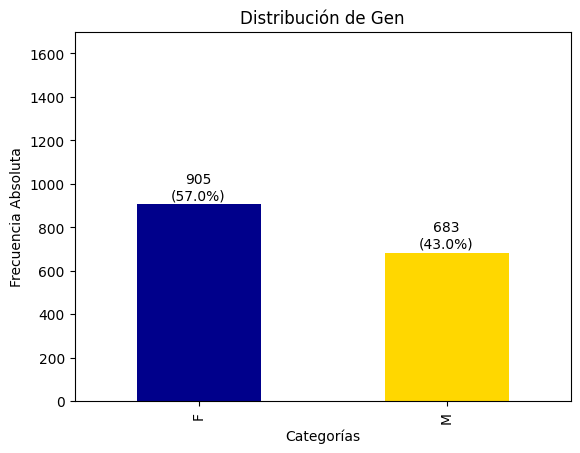

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


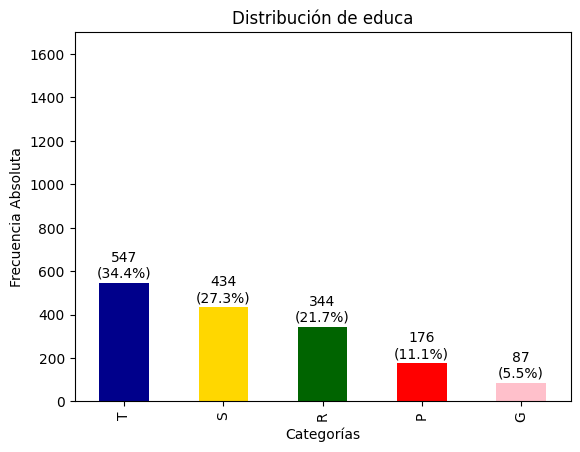

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


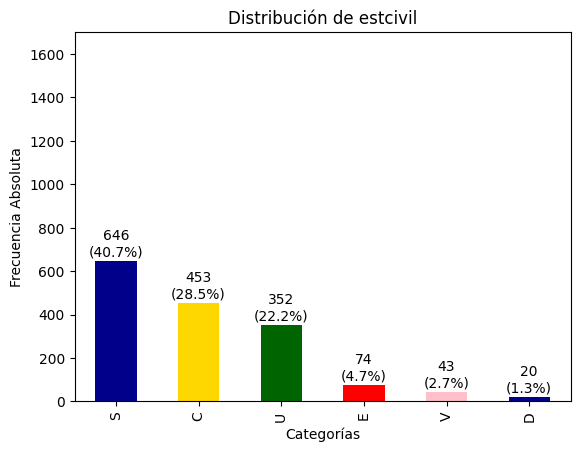

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


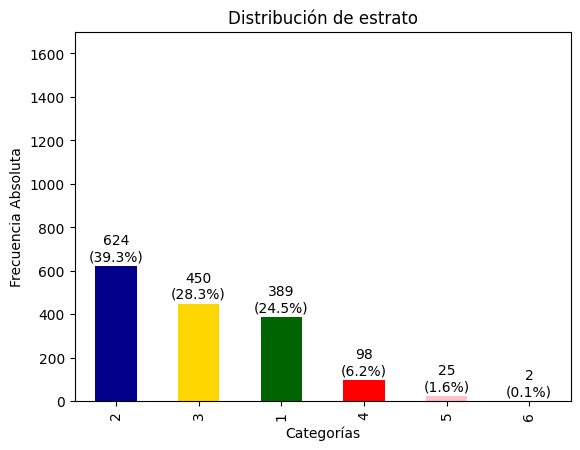

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


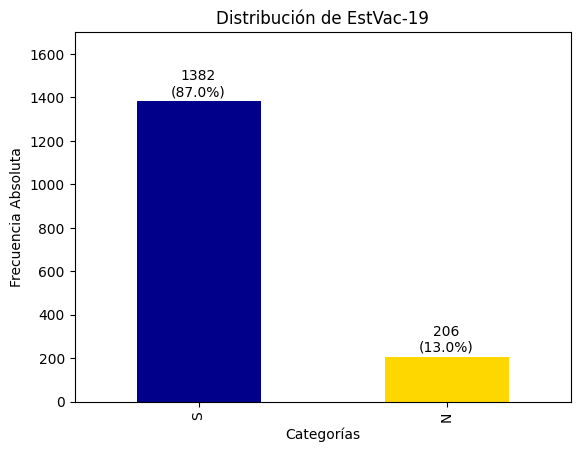

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


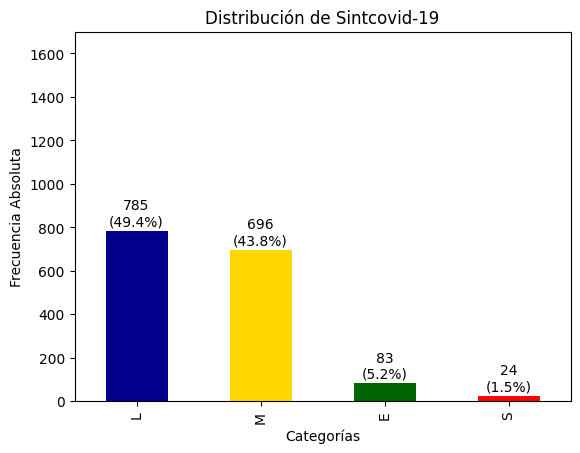

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


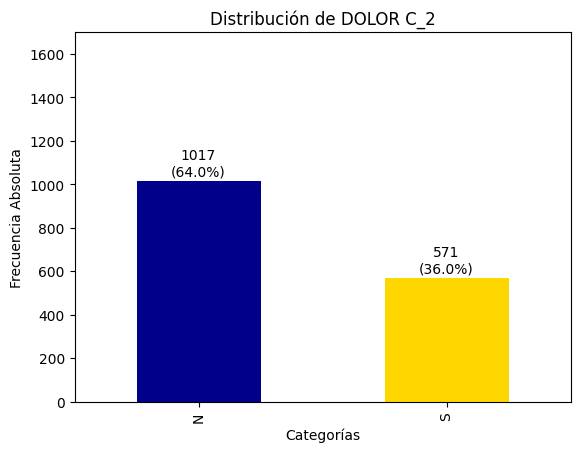

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


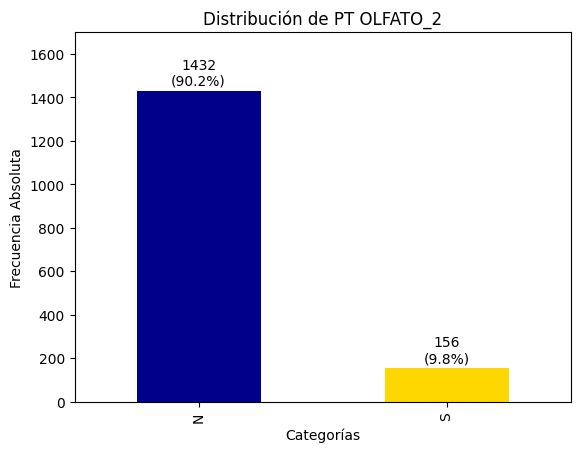

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


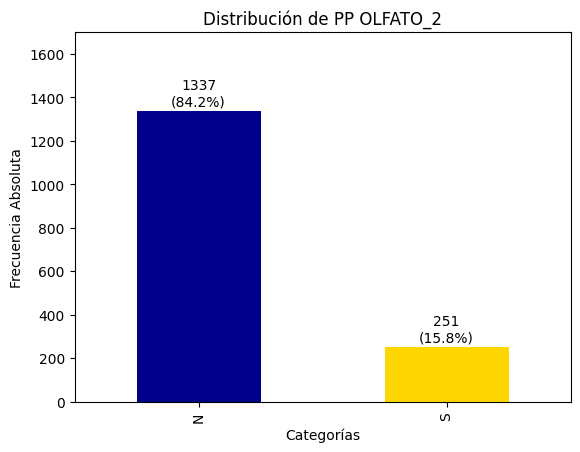

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


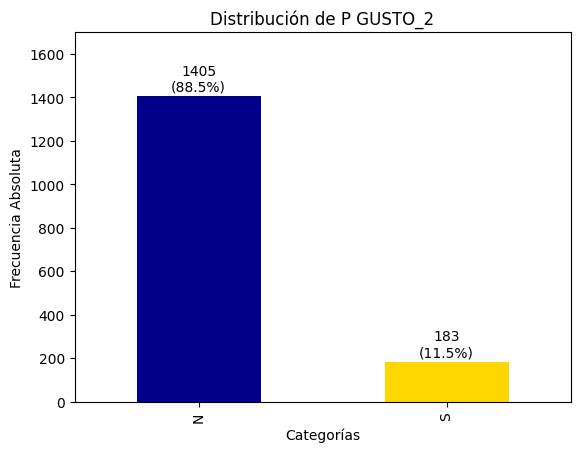

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


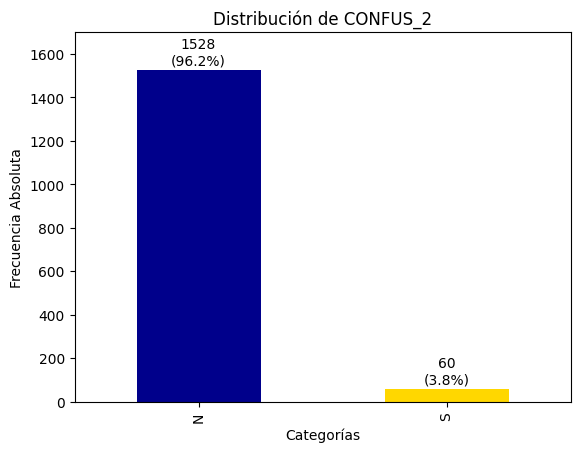

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


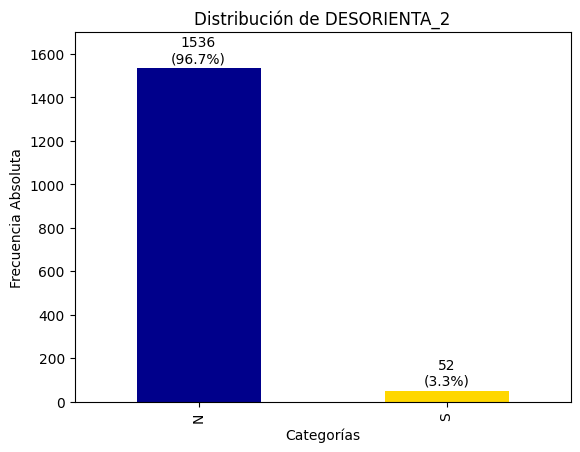

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


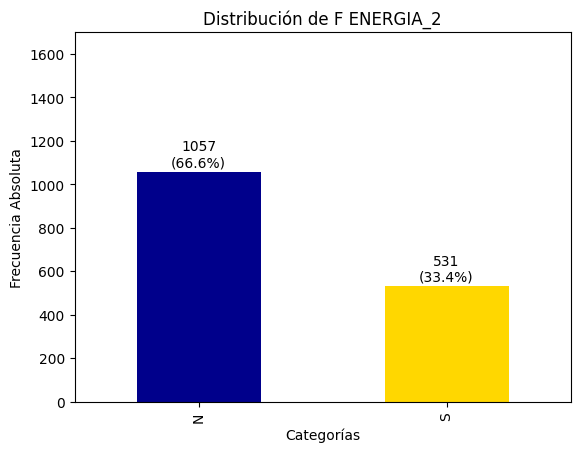

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


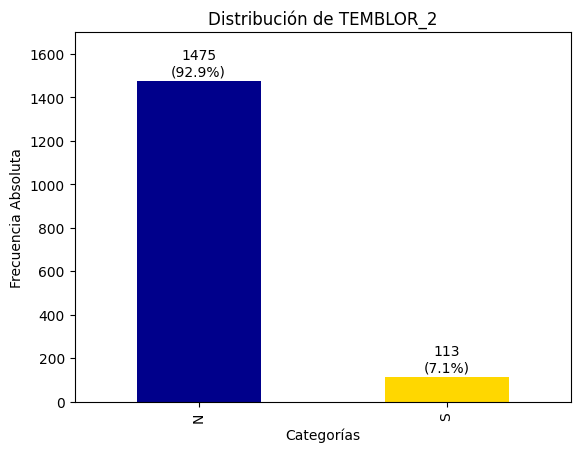

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


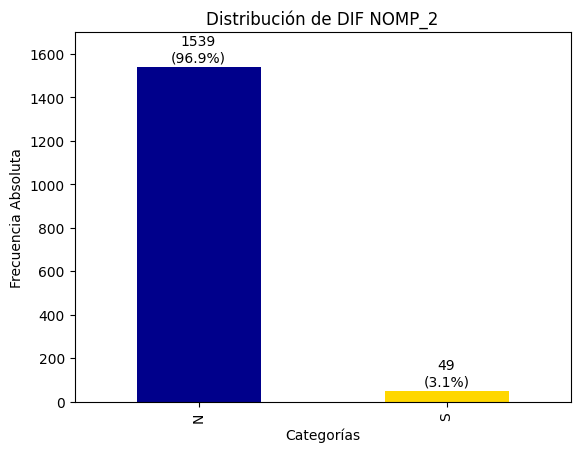

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


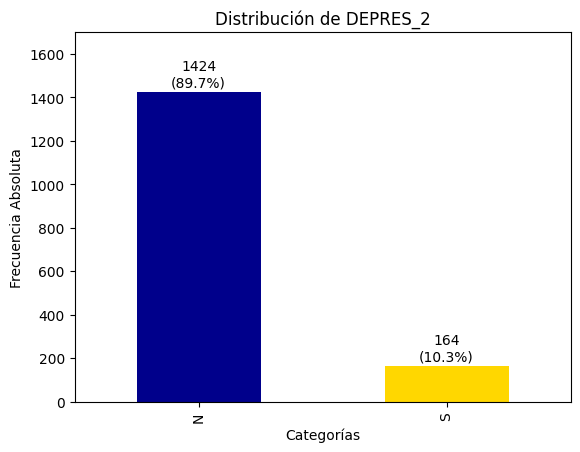

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


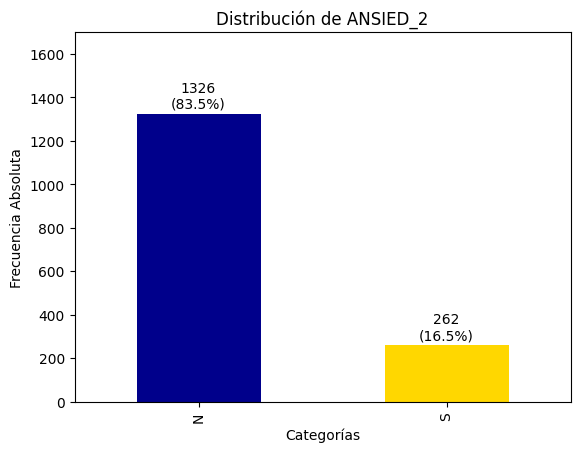

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


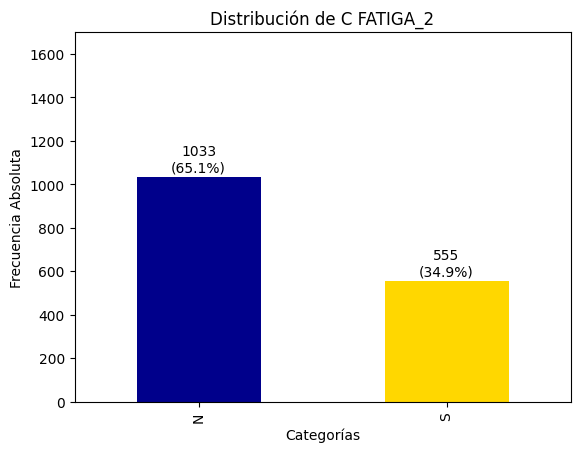

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


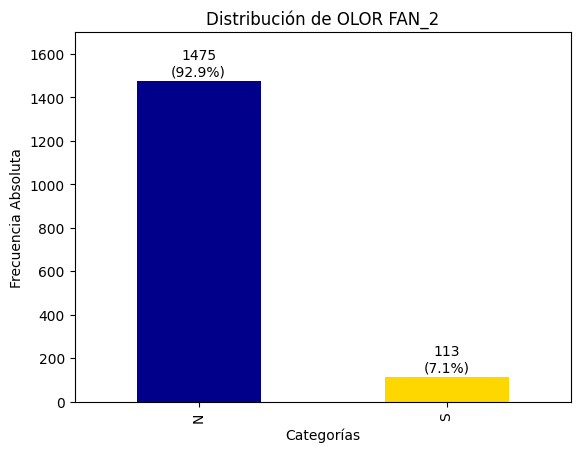

<ipython-input-258-500b8f251fe4>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  covid_after[col_name] = covid_after[col_name].astype('category')


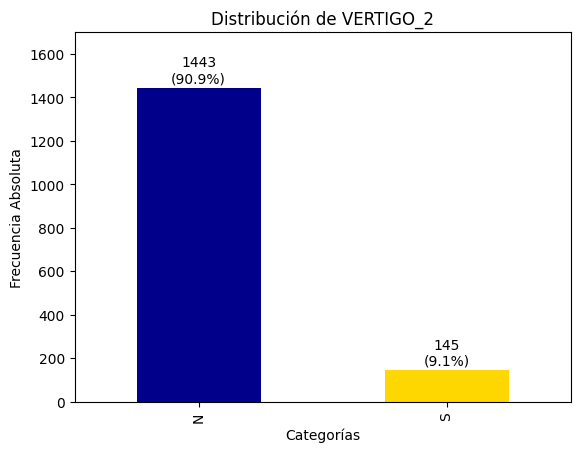

In [258]:
# ============SEGUNDO PERIODO================
#Procedemos de forma similar con el segundo periodo

import matplotlib.pyplot as plt

covid_after = covid.iloc[:, np.r_[0:7, 21:35]] #Las respuestas del segundo periodo consideran de las columnas 0 al 7 Y del 21 a 35
for col_name in covid_after.columns:
    if col_name != 'edad':
        covid_after[col_name] = covid_after[col_name].astype('category')
        value_counts = covid_after[col_name].value_counts()
        ax = value_counts.plot(kind='bar', color=["darkblue", "gold", "darkgreen", "red", "pink"])

        # Añadir títulos y etiquetas
        plt.title(f"Distribución de {col_name}")
        plt.xlabel("Categorías")
        plt.ylabel("Frecuencia Absoluta")
        plt.ylim(0, 1700)

        # Agregar etiquetas de frecuencia absoluta y porcentaje en las barras
        for i, count in enumerate(value_counts):
            percentage = count / sum(value_counts) * 100
            ax.text(i, count + 10, f'{count}\n({percentage:.1f}%)', ha='center', va='bottom')

        plt.show()


In [259]:
# ======RECATEGORIZACIÓN VARIABLE EDAD
bins = [14, 26, 59, 86] #Se definen los limite4s de cada intervalo
labels = ['1', '2', '3'] #Se le colocan las etiquetas corresponeidntes cada categoria
covid['edad'] = pd.cut(covid['edad'], bins=bins, labels=labels, include_lowest=True) #Se aplica dicha recategorizacion

'''
1: 14-25 (JOVEN)
2: 26-59 (ADULTO)
3: 60-85 (ADULTO MAYOR)
'''

#Cambiar tipo de datos para la variable estrato
covid['estrato']=covid['estrato'].astype(str) #Se convierte en texto


In [260]:
#Base da datos final
print(covid.head())

#Categorias de las variables
print(covid.dtypes)

  edad Gen educa estcivil estrato EstVac-19 Sintcovid-19 DOLOR C PT OLFATO  \
0    3   F     R        V       3         S            M       S         S   
1    2   F     S        C       3         S            M       S         N   
2    3   M     P        C       3         S            L       S         N   
3    1   F     T        S       3         S            M       S         S   
4    1   F     S        S       5         N            M       S         S   

  PP OLFATO  ... CONFUS_2 DESORIENTA_2 F ENERGIA_2 TEMBLOR_2 DIF NOMP_2  \
0         S  ...        N            N           S         N          N   
1         N  ...        N            N           N         N          N   
2         S  ...        N            N           N         N          N   
3         S  ...        N            N           N         N          N   
4         S  ...        N            N           S         N          N   

  DEPRES_2 ANSIED_2 C FATIGA_2 OLOR FAN_2 VERTIGO_2  
0        S        S       

## ANALISIS DE GRAFO Para el PRIMER periodo (before)

In [261]:
# =============ANÁLISIS DE GRAFOS DEL PRIMERO PERIODO============
#estabelecer nivel de "tolerancia"
#Con la matriz de distancia ya es suficiente para crear el clsuter espcetral

import numpy as np
import networkx as nx
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import hamming
import matplotlib.pyplot as plt

# CONSIDERAR EL PRIMER PERIODO
covid_before = covid.iloc[:, np.r_[0:20]] #Selecciono solo las columnas correspondientes al primer periodo

# Convertir cada fila en una cadena de caracteres concatenados
vector_caracteres_before = covid_before.apply(lambda x:''.join(x.astype(str)), axis=1)
#vector_caracteres_before = vector_caracteres_before.tolist()  #Crea el vector donde cada elemento, es un vector de caracterres formados por las respuestas de cada individuo (fila)
#vector_caracteres_before = vector_caracteres_before[:700]        # Por ahora para practicar
print(vector_caracteres_before) #Imprimir vector
print(len(vector_caracteres_before))


0       3FRV3SMSSSSSNNSSNNNS
1       2FSC3SMSNNNNNNNNNNSN
2       3MPC3SLSNSSNSSSNNNSN
3       1FTS3SMSSSSNNSSNNSSS
4       1FSS5NMSSSSNSSNNNNSN
                ...         
1596    2FRC3SMSNNNNNSNNSNSN
1597    2FTC2SMSSSSNNSNNNNSN
1598    2MGU4SLSSNSNSSSNNNSN
1599    2FSU1SLSSNSNNSSNNSSN
1600    1MRC2SMSNSNNNSSNNNSN
Length: 1588, dtype: object
1588


In [262]:
import numpy as np
from scipy.spatial.distance import hamming


#================CREAR LA MATRIZ DE DISTANCIA HAMMING=====================
# Crear la matriz vacía
n = len(vector_caracteres_before)
similitud_matrix_before = np.zeros((n, n)) #Crea una matriz de dimension nxn, correspondiente a cada uno de los indivuos del vector de respuestas
disimilitud_matrix_before = np.zeros((n, n)) #Crea una matriz de SIMILITUF

similitud_entero_matrix_before= np.zeros((n,n)) #Crea una matriz de dimension nxn, donde se guardara la distancia hamming en valores entero para la similitud
disimilitud_entero_matrix_before= np.zeros((n,n)) #Crea una matriz de dimension nxn, donde se guardara la distancia hamming en valores entero para la disimilitud

# Llenar la matriz de distancias
for i in range(n):  #Por cada elemento del vector de respuestas
    for j in range(i + 1, n): #Toma un segundo elemento del vector de respuestas
        disimilitud_porcentual = hamming(list(vector_caracteres_before.iloc[i]), list(vector_caracteres_before.iloc[j]))  # Calcula la proporción directamente.
        similitud_porcentual= 1-disimilitud_porcentual #Se saca el complemento para que sea una matriz de similitud directamente

        #Convertirlo a valores enteros, debido a que scipy.distance, calcula una proporcion originalmente
        similitud_matrix_before[i, j] = similitud_porcentual #Lo guarda en la matriz de posicion i,j
        similitud_matrix_before[j, i] = similitud_porcentual #Lo guarda en la matriz de posicion j, i ya que es simetrica

        #Para la matriz de disimilutd el cual es necesario para el indice CCI (Cluster Cardinality Index)
        disimilitud_matrix_before[i, j] = disimilitud_porcentual #Lo guarda en la matriz de posicion i,j
        disimilitud_matrix_before[j, i] = disimilitud_porcentual

        #=============PARA VALORES ENTEROS=====================
        disimilitud_entero= disimilitud_porcentual*len(vector_caracteres_before.iloc[i])
        similitud_entero= 20-disimilitud_entero #Se saca el complemento para que sea una matriz de similitud directamente

        #Para la mtriz de disimilitud con valores enteros
        disimilitud_entero_matrix_before[i, j] = disimilitud_entero #Lo guarda en la matriz de posicion i,j
        disimilitud_entero_matrix_before[j, i] = disimilitud_entero


        #para la mtriz de similitud conv alores enteros
        similitud_entero_matrix_before[i, j] = similitud_entero #Lo guarda en la matriz de posicion i,j
        similitud_entero_matrix_before[j, i] = similitud_entero #Lo guarda en la matriz de posicion j, i ya que es simetrica

#

# Imprimir la matriz de distancias
print("Matriz de distancias:")
# Ajusta las opciones para mostrar todas las filas y columnas
np.set_printoptions(threshold=np.inf)

# Ahora imprime la matriz
print(similitud_matrix_before)




Se han truncado las últimas 5000 líneas del flujo de salida.
  0.65 0.45 0.5  0.7  0.6  0.55 0.6  0.65 0.65 0.6  0.6  0.65 0.7  0.6
  0.6  0.7  0.45 0.75 0.7  0.6  0.35 0.6  0.55 0.65 0.5  0.75 0.6  0.5
  0.8  0.65 0.45 0.65 0.45 0.75 0.7  0.65 0.55 0.75 0.7  0.45 0.65 0.65
  0.7  0.45 0.5  0.55 0.6  0.6  0.45 0.6  0.5  0.5  0.5  0.6  0.55 0.5
  0.35 0.7  0.55 0.6  0.75 0.5  0.7  0.65 0.65 0.45 0.55 0.7  0.5  0.55
  0.75 0.6  0.5  0.8  0.65 0.4  0.35 0.6  0.5  0.75 0.6  0.5  0.5  0.6
  0.6  0.7  0.5  0.65 0.35 0.85 0.5  0.55 0.65 0.6  0.7  0.45 0.55 0.6
  0.6  0.7  0.75 0.6  0.5  0.7  0.5  0.6  0.5  0.45 0.55 0.6  0.4  0.6
  0.5  0.45 0.5  0.5  0.5  0.45 0.5  0.65 0.55 0.55 0.7  0.55 0.5  0.55
  0.6  0.6  0.5  0.75 0.55 0.7  0.6  0.65 0.45 0.6  0.45 0.7  0.55 0.55
  0.5  0.7  0.6  0.55 0.6  0.55 0.6  0.55 0.5  0.75 0.6  0.6  0.45 0.65
  0.65 0.65 0.5  0.65 0.6  0.55 0.5  0.55 0.4  0.7  0.65 0.55 0.6  0.7
  0.55 0.8  0.55 0.5  0.5  0.65 0.45 0.4  0.5  0.6  0.65 0.55 0.45 0.65
  0.7  0.4

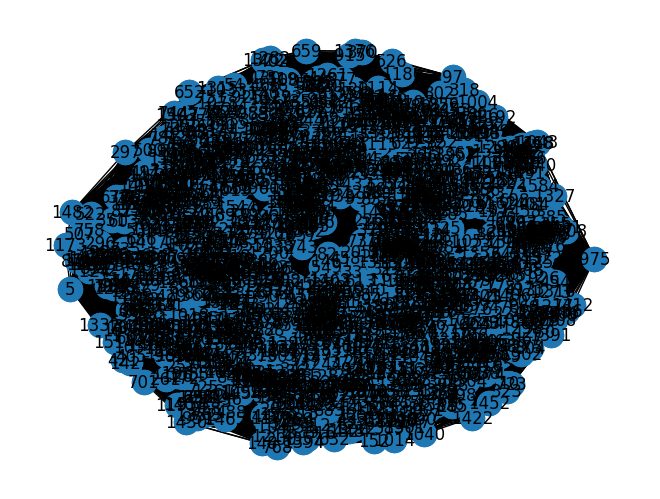

In [263]:
import networkx as nx
import matplotlib.pyplot as plt

# Crear un grafo a partir de la matriz de similitud
G = nx.from_numpy_array(disimilitud_matrix_before) #El grafo se llama G

# Calcular las posiciones de los nodos
pos = nx.spring_layout(G, seed=42) #Se le colcoa una semilla para que las posiciones no sean aleatorias

# Dibujar el grafo
nx.draw(G, pos=pos) #Dibuja el grafo
nx.draw_networkx_nodes(G, pos=pos) #Dibuja los nodos (sin su etiqueta)
nx.draw_networkx_labels(G, pos=pos) #Dibuja los numeros correspondiente a los individuos (etiqueta)

# Dibujar las aristas con pesos (inncecesario)
#labels = nx.get_edge_attributes(G, 'weight')  # Obtener los pesos de las aristas
#nx.draw_networkx_edge_labels(G, pos)  # Dibujar las etiquetas de peso

plt.show()

####Hasta aqui, todos los nodos estan conectados con todos, no se tiene algun tipo de criterio para determinar si dos nodos se conectan

## suavizamiento del criteior de disimilitud
# AQUI LE APLCIAMOS UNA TOLERNAICA DE DISIMILITUD, ES DECIR, SE CONECTARAN LOS VERTICE, CUYA DISIMILITUD SEA MENOR A 0.25, ES DECIR, QUE DIFIERAN EN A LO MAS EN 5 VARIABLES (CONSIDERANDOR QUE EL TOTAL DEL VARIABLES SON 20)

In [264]:
'''
#  Umbral de similitud
tolerancia = 0.25 #Se conectara solo si tienen una disimilitud superior a 5 SACAR LA MATRIZ DE ADJACENCIA

# Crear un nuevo grafo con solo las aristas que superan el umbral
G_filtered_before = nx.Graph()
for i in range(n):
    for j in range(i + 1, n):
        if disimilitud_matrix_before[i, j] < tolerancia:
            G_filtered_before.add_edge(i, j, weight=disimilitud_matrix_before[i, j])

# Calcular las posiciones de los nodos para el grafo filtrado
pos_filtered = nx.spring_layout(G, seed=42)

# Dibujar el grafo filtrado
nx.draw(G_filtered_before, pos=pos_filtered) #Dibuja el grafo
nx.draw_networkx_nodes(G_filtered_before, pos=pos_filtered) #Dibuja los nodos
nx.draw_networkx_labels(G_filtered_before, pos=pos_filtered) #Dibuja las etiquetas
'''

'\n#  Umbral de similitud\ntolerancia = 0.25 #Se conectara solo si tienen una disimilitud superior a 5 SACAR LA MATRIZ DE ADJACENCIA\n\n# Crear un nuevo grafo con solo las aristas que superan el umbral\nG_filtered_before = nx.Graph()\nfor i in range(n):\n    for j in range(i + 1, n):\n        if disimilitud_matrix_before[i, j] < tolerancia:\n            G_filtered_before.add_edge(i, j, weight=disimilitud_matrix_before[i, j])\n\n# Calcular las posiciones de los nodos para el grafo filtrado\npos_filtered = nx.spring_layout(G, seed=42)\n\n# Dibujar el grafo filtrado\nnx.draw(G_filtered_before, pos=pos_filtered) #Dibuja el grafo\nnx.draw_networkx_nodes(G_filtered_before, pos=pos_filtered) #Dibuja los nodos\nnx.draw_networkx_labels(G_filtered_before, pos=pos_filtered) #Dibuja las etiquetas\n'

## Creación de CLUSTER PRIMER **periodo**

In [265]:
#====================CREACION DE CLUSTER=================
from sklearn.cluster import SpectralClustering
import matplotlib.pyplot as plt
import numpy as np

# Kernel gaussiano
sigma = 1.0 #Grid Search
# Aplica el kernel gaussiano
disimilitud_gausiano_matrix_before = np.exp(-disimilitud_matrix_before ** 2 / (2 * sigma ** 2))
disimilitud_gausiano_entero_matrix_before= np.exp(-disimilitud_entero_matrix_before ** 2 / (2 * sigma ** 2))

#======PROBANDO PARA DOS CLUSTERS====================
# Convertimos la matriz de distancias en una matriz de afinidad (similaridad)
sc_before = SpectralClustering(n_clusters=2, affinity="precomputed", random_state=0)
spectral_clustering_before = sc_before.fit(disimilitud_gausiano_matrix_before) #Ocupar la matriz de adjacencia

print(spectral_clustering_before.labels_)


[1 0 1 1 1 0 0 1 1 0 0 0 0 0 1 0 0 1 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 1 1 1 0
 1 1 0 0 0 0 1 0 1 1 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 1 0 0 0 0 0 0 1
 1 0 0 0 0 0 0 1 1 0 1 0 0 0 1 0 0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 0 1 0 1 0 0
 0 1 0 0 0 1 0 0 0 1 1 1 1 1 0 0 0 1 1 0 1 1 0 0 1 1 1 1 0 0 0 0 0 1 1 1 0
 1 1 0 0 0 0 1 0 0 1 0 0 1 1 1 1 0 1 0 0 0 0 0 0 0 1 1 1 0 1 1 1 0 1 1 1 0
 0 1 0 0 0 0 0 0 0 1 1 0 1 1 1 0 0 1 1 1 0 0 1 1 1 0 0 0 0 0 1 1 1 1 0 1 0
 0 0 0 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0 0 1 0 1 1 0
 0 1 0 1 0 0 0 1 1 1 0 1 1 1 0 1 1 1 0 1 0 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 1
 1 0 1 0 1 1 1 1 1 1 0 1 0 0 0 0 1 1 0 1 1 1 0 0 1 1 0 1 1 0 1 1 1 0 1 0 1
 0 0 1 0 1 0 0 1 0 0 1 1 1 0 0 1 1 1 0 0 1 0 0 1 0 1 1 1 1 0 1 1 1 1 0 0 1
 0 1 1 0 0 0 0 1 0 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 0 0 1 0 1 0 0 0
 1 1 0 1 1 1 0 0 1 0 0 0 0 1 1 1 1 1 1 0 0 1 0 0 1 1 1 0 1 0 0 1 1 1 0 1 1
 1 0 0 0 0 1 0 1 0 1 0 1 1 1 1 0 0 0 1 0 1 1 0 1 0 1 0 0 0 0 0 1 1 1 0 0 0
 1 1 1 0 1 1 1 1 0 0 1 0 

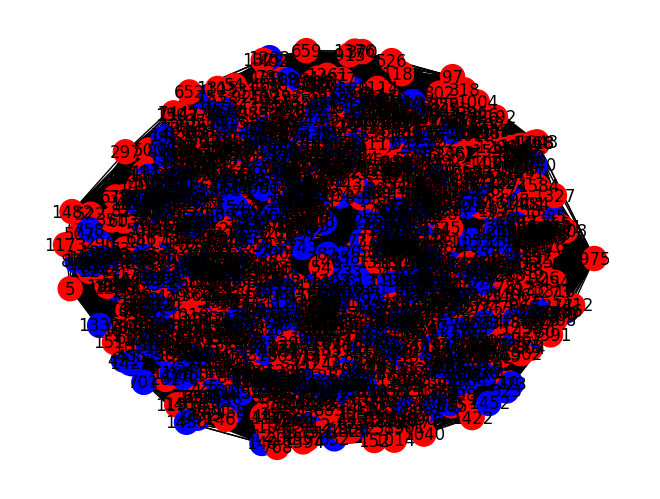

In [266]:
#=========================VISUALIZANDO LOS CLUSTER A TRAVES DEL GRAFO========

# Crear un grafo a partir de la matriz de similitud
G = nx.from_numpy_array(disimilitud_matrix_before) #El grafo se llama G
#Agregar tarsnfomraicon normal
# Calcular las posiciones de los nodos
pos = nx.spring_layout(G, seed=42)

cluster_labels = spectral_clustering_before.labels_
colores = ['red', 'blue','green']

nx.draw(G, with_labels=True, pos=pos, node_color=[colores[label] for label in cluster_labels])
plt.show()


#Indices de desempeño

In [267]:
import numpy as np

#=======================INDICE DUNN====================== REVISADO: 22-10-24, esta CORRECTO
def dunn_index(disimilitud_matrix, labels):
    """
    Calcula el índice de Dunn dado una matriz de distancias(disimilitud) precomputada y etiquetas de clúster.

    disimilitud_matrix: matriz de distancias (precomputada).
    labels: etiquetas de clúster asignadas a cada punto.
    """
    unique_clusters = np.unique(labels) #Identifica las etiquetadas utilizadas o asginadas
    num_clusters = len(unique_clusters) #Cuentas cuantas etiquetas se asignaron

    # 1. Calcular la máxima distancia dentro de cada clúster (intracluster)
    max_intracluster_distance = 0 #Inicia en 0 la distancia maxima encontrada
    for cluster in unique_clusters: #Recorre cada clsuter
        # Obtener los puntos del clúster actual
        points_in_cluster = np.where(labels == cluster)[0]
        if len(points_in_cluster) > 1:  # Solo calcular si hay más de un punto en el clúster
            intracluster_distances = disimilitud_matrix[np.ix_(points_in_cluster, points_in_cluster)] # Obtener las distancias entre todos los pares de puntos en el clúster
            max_intracluster_distance = max(max_intracluster_distance, np.max(intracluster_distances))

    # 2. Calcular la mínima distancia entre clústeres (intercluster)
    min_intercluster_distance = np.inf
    for i in range(num_clusters): #Toma el primer elemento de la lista de clsuter hechos, es decir un caluster
        for j in range(i + 1, num_clusters): #Toma el siguiente, por lo tnto, este ciclo compara todos con todos
            points_in_cluster_i = np.where(labels == unique_clusters[i])[0] #Seleccionar los puntos del primer cluster
            points_in_cluster_j = np.where(labels == unique_clusters[j])[0] #Selecciona los puntos dl segundo cluster
            intercluster_distances = disimilitud_matrix[np.ix_(points_in_cluster_i, points_in_cluster_j)]  # Obtiene las distancias entre todos los puntos de los clústeres i y j
            min_intercluster_distance = min(min_intercluster_distance, np.min(intercluster_distances)) #Encuentra el minimo de dichas distancias.

    # 3. Índice de Dunn: relación entre la mínima distancia intercluster y la máxima intracluster
    if max_intracluster_distance == 0:
        return 0  # Si max_intracluster_distance es 0, retornamos 0 para evitar división por cero
    return min_intercluster_distance / max_intracluster_distance
    #MIENTRAS MENOR EL VALOR, MEJORE DESEMPEÑO

In [268]:
import numpy as np

#====================INDICE DE CARDINALIDAD======================= REVISADO 27-10-2024
def cluster_cardinality_index(disimilitud_matrix,labels):
    """
    Calcula el Cluster Cardinality Index (CCI) utilizando una matriz de disimilitud calculada con distancias de Hamming precomputada.

    Parámetros:
    - labels: array con las etiquetas de cluster para cada punto.
    - disimilitud_entero_matrix_before: matriz de distancias de Hamming precomputada (n x n), donde n es el número de puntos.

    Retorno:
    - cci: el valor del Cluster Cardinality Index.
    """
    # 1. Encontrar los clusters únicos en las etiquetas
    unique_clusters = np.unique(labels) #Etiquetas utilizadas
    k = len(unique_clusters)  # Número de clusters
    cci_total = 0  # Variable que acumula el valor total de CCI

    # 2. Para cada cluster i
    for i in range(k):
        # Encontrar los puntos que pertenecen al cluster i
        cluster_i_observaciones = np.where(labels == unique_clusters[i])[0]  #Identifica las observaciones que pertenece al cluster i

        # Calcular la disimilitud interna (CI) del cluster i
        CI_i = 0 #Inicializamos con 0 la disimilitud
        count_i = 0  # Para contar las comparaciones

        if len(cluster_i_observaciones) > 1:  # Si hay más de 1 punto en el cluster
            for p1 in cluster_i_observaciones: #por cada obersvacion en el cluster i
                for p2 in cluster_i_observaciones:  #por cada otra obersvacion en el cluster i
                    if p1 != p2: #Nos aseguramos que sean distintos
                        CI_i += disimilitud_matrix[p1, p2] #Suma la disimilitudes de esas donde observaciones dentro de la matriz de distancia hamming
                        count_i += 1

            CI_i = CI_i / count_i  # Calcular el promedio, es decir CI(i)


        max_ratio = -np.inf  # Variable para almacenar la máxima razón entre CI_i + CI_j y CI(i,j)

        # 3. Para cada cluster j (diferente de i)
        for j in range(k): #Sigue una logica igual a la anterior
            if i != j: #busca otro cluster distinto al anterior para hayar CI(j)
                # Encontrar los puntos que pertenecen al cluster j
                cluster_j_observaciones = np.where(labels == unique_clusters[j])[0]

                # Calcular la disimilitud interna (CI) del cluster j
                CI_j = 0 #Inicia la suma de ls disimilitud en 0
                count_j = 0  # Para contar las comparaciones

                if len(cluster_j_observaciones) > 1:
                    for p1 in cluster_j_observaciones: #Una observacion pertenciente al cluster j
                        for p2 in cluster_j_observaciones: #otra obsrevacion distinta a la anterior pero que tambien pertenece al clsuter j
                            if p1 != p2: #se asegura que sean distintos
                                CI_j += disimilitud_matrix[p1, p2] #Calcula la disimilitud entre ellos
                                count_j += 1 #Va sumanod la cantidad de observaciones en el cluter j
                    CI_j = CI_j / count_j   # Calcular el promedio, es decir CI(j)

                #4. Calcular la disimilitud entre clusters i y j (CI(i, j))
                CI_between = 0
                count_between = 0  # Para contar las comparaciones
                for p1 in cluster_i_observaciones:
                    for p2 in cluster_j_observaciones:
                        CI_between += disimilitud_matrix[p1, p2]
                        count_between += 1
                CI_between = CI_between / count_between  # Calcular el promedio entre clusters

                #5. Calcular la razón y actualizar el máximo
                if CI_between > 0:  # Evitar división por cero
                    ratio = (CI_i + CI_j) / CI_between
                    max_ratio = max(max_ratio, ratio)

        # 6. Sumar el máximo ratio al CCI total
        cci_total += max_ratio

    # 7. Devolver el CCI final (promedio de todos los clusters)
    cci = cci_total / k
    return cci

   #A MENOR VALORES, MEJOR DESEMPEÑO

In [269]:
cluster_cardinality_index(disimilitud_entero_matrix_before,spectral_clustering_before.labels_)

1.677688795291817

In [270]:
import numpy as np

def new_condorcet_criterion(disimilitud_matrix,labels):
    """
    Calcula el New Condorcet Criterion (NCC) usando la matriz de distancias de Hamming
    Argumentos:
        labels: Vector de etiquetas de los clusters.
        disimilitud_entero_matrix_before: Matriz de disimilitud calculada con valores enteros.
    """
    unique_clusters = np.unique(labels)  # Etiquetas de clusters únicas
    n_samples = len(labels)  # Número total de muestras
    ncc_total = 0  # Valor total de NCC

    for cluster in unique_clusters:
        observaciones_del_cluster = np.where(labels == cluster)[0] #Identifica las observaciones pertencientes al cluster
        s_intra = 0 #Inicializamos las suma en 0
        d_inter = 0

        # 1. Calcular S_intra (Compacidad intra-cluster)
        if len(observaciones_del_cluster) > 1:
            for i in range(len(observaciones_del_cluster)):
                for j in range(i + 1, len(observaciones_del_cluster)):
                    s_intra += 20 - disimilitud_matrix[observaciones_del_cluster[i], observaciones_del_cluster[j]]

        # 2. Calcular D_inter (Separación interclusters)
        otras_observaciones = np.where(labels != cluster)[0]  # Elementos fuera del cluster actual
        for i in otras_observaciones:
            for j in observaciones_del_cluster:
                d_inter += disimilitud_matrix[i, j]  # Sumar disimilitudes entre clusters distintos

        # Acumular el NCC de este cluster en el total
        ncc_total += s_intra + d_inter

    return ncc_total  # Retornar el valor final de NCC
     # A MAYOR VALOR, MEJOR DESEMPEÑO

## Probando distinta cantidad de cluster y evluando indices (before)

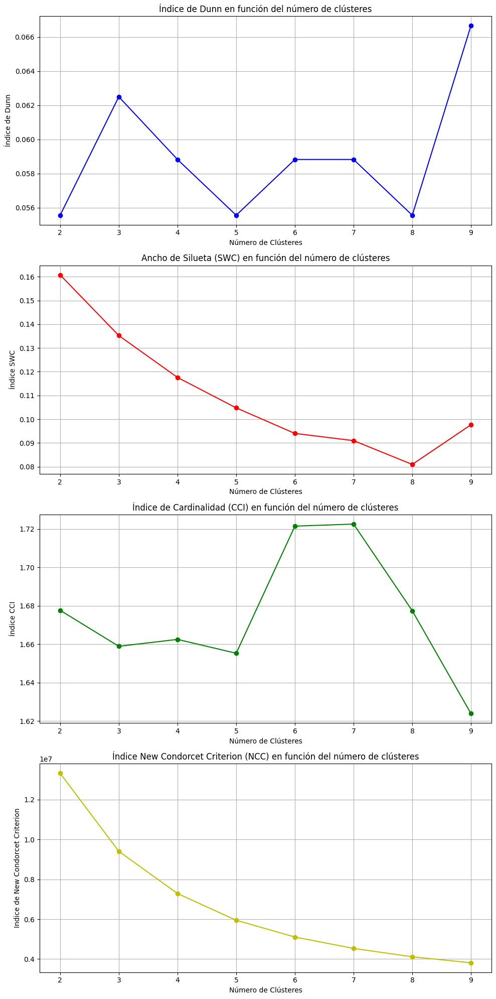

Número de Clústeres,2,3,4,5,6,7,8,9
Dunn,5.555556e-02,6.250000e-02,5.882353e-02,5.555556e-02,5.882353e-02,5.882353e-02,5.555556e-02,6.666667e-02
SWC,1.607996e-01,1.352438e-01,1.175972e-01,1.047820e-01,9.400160e-02,9.097950e-02,8.094313e-02,9.765338e-02
CCI,1.677689e+00,1.658921e+00,1.662521e+00,1.655303e+00,1.721533e+00,1.722598e+00,1.677460e+00,1.623859e+00
NCC,1.331988e+07,9.408480e+06,7.289168e+06,5.947989e+06,5.107664e+06,4.535816e+06,4.115923e+06,3.814937e+06


In [272]:
import matplotlib.pyplot as plt #Se importa la libreria matplotlib

#=====================PROBANDO LOS INDICES CON DISTINTOS NUMEROS DE CLSUTER=================
#Listas vacias para guardar el valor de los indices
dunn_values = [] #Lista de indice Dunn
silhouette_values = [] # Nueva lista para guardar los valores de silueta
cci_values = [] #Lista de indice CCI
ncc_values = [] #Lista de indice NCC
clusters = []


# Crear la figura y las subgráficas antes del bucle
fig, axs = plt.subplots(4, 1, figsize=(10, 20)) #Aqui se crea 'axs' para los subplots

#Aqui buscamos el numero optimo de cluster en base a los indices Dunn, Silhouette, Cluster cardinality Index (CCI), New Condorcet Criterion (NCC)
for i in range(2, 10):
  sc_before = SpectralClustering(n_clusters=i, affinity="precomputed", random_state=0) #This line and the following lines within the loop need to be indented
  spectral_clustering_before = sc_before.fit(disimilitud_gausiano_matrix_before)

  labels = spectral_clustering_before.labels_

  # Calcular el índice Dunn CON LA FUNCION CREADA PREVIAMNETE
  dunn_value = dunn_index(disimilitud_matrix_before, labels)
  dunn_values.append(dunn_value)
  clusters.append(i)

  # Calcular el ancho de silueta CON LIBRERIA
  silhouette_value= silhouette_score(disimilitud_matrix_before, labels, metric="precomputed") #Aqui utilizamos libreria #MIENTRAS MAS GRANDE EL NUMERO, MEJOR
  silhouette_values.append(silhouette_value)

  #Calcular el indice cardinalidad CCI
  cci_value = cluster_cardinality_index(disimilitud_matrix_before,labels)
  cci_values.append(cci_value)

  #Calcular el indice NCC
  ncc_value = new_condorcet_criterion(disimilitud_matrix_before,labels)
  ncc_values.append(ncc_value)


# Graficar el índice de Dunn (DUNN)
axs[0].plot(clusters, dunn_values, marker='o', linestyle='-', color='b')
axs[0].set_title('Índice de Dunn en función del número de clústeres')
axs[0].set_xlabel('Número de Clústeres')
axs[0].set_ylabel('Índice de Dunn')
axs[0].set_xticks(clusters)
axs[0].grid()

# Graficar (SWC)
axs[1].plot(clusters, silhouette_values, marker='o', linestyle='-', color='r')
axs[1].set_title('Ancho de Silueta (SWC) en función del número de clústeres')
axs[1].set_xlabel('Número de Clústeres')
axs[1].set_ylabel('Índice SWC')
axs[1].set_xticks(clusters)
axs[1].grid()


# Graficar la (CCI)
axs[2].plot(clusters, cci_values, marker='o', linestyle='-', color='g')
axs[2].set_title('Índice de Cardinalidad (CCI) en función del número de clústeres')
axs[2].set_xlabel('Número de Clústeres')
axs[2].set_ylabel('Índice CCI')
axs[2].set_xticks(clusters)
axs[2].grid()

#Gracficar (NCC)
axs[3].plot(clusters, ncc_values, marker='o', linestyle='-', color='y')
axs[3].set_title('Índice New Condorcet Criterion (NCC) en función del número de clústeres')
axs[3].set_xlabel('Número de Clústeres')
axs[3].set_ylabel('Indice de New Condorcet Criterion')
axs[3].set_xticks(clusters)
axs[3].grid()

# Ajustar el espacio entre las subgráficas
plt.tight_layout()
plt.show()


# Crear un DataFrame con los resultados
tabla_indices = pd.DataFrame({
    'Número de Clústeres': clusters,
    'Dunn': dunn_values,
    'SWC': silhouette_values,
    'CCI': cci_values,
    'NCC': ncc_values
}).set_index('Número de Clústeres').T

display(tabla_indices)


In [280]:
import numpy as np

# Imprimir la cantidad total de observaciones
print("Total de observaciones en 'covid_before':", len(covid_before))
print("Total de etiquetas en 'spectral_clustering_before.labels_':", len(spectral_clustering_before.labels_))

# Contar la cantidad de observaciones en cada clúster
conteo_clusters = np.bincount(spectral_clustering_before.labels_)

# Imprimir el conteo por clúster
for cluster_id, count in enumerate(conteo_clusters):
    print(f"Clúster {cluster_id}: {count} observaciones")

Total de observaciones en 'covid_before': 1588
Total de etiquetas en 'spectral_clustering_before.labels_': 1588
Clúster 0: 128 observaciones
Clúster 1: 220 observaciones
Clúster 2: 192 observaciones
Clúster 3: 180 observaciones
Clúster 4: 186 observaciones
Clúster 5: 111 observaciones
Clúster 6: 209 observaciones
Clúster 7: 196 observaciones
Clúster 8: 166 observaciones


In [284]:
#=======================CARACTERIZAR CADA CLUSTER=============================
#Agrego la columna del cluster al que pertenece cada individuo
# Restablecer el índice del DataFrame
covid_before = covid_before.reset_index(drop=True)
covid_before.loc[:len(spectral_clustering_before.labels_), 'cluster'] = spectral_clustering_before.labels_
covid_before.head(len(spectral_clustering_before.labels_)) #Visualizamos la tabla con los cluster asignados




,edad,Gen,educa,estcivil,estrato,EstVac-19,Sintcovid-19,DOLOR C,PT OLFATO,PP OLFATO,...,CONFUS,DESORIENTA,F ENERGIA,TEMBLOR,DIF NOMP,DEPRES,ANSIED,C FATIGA,OLOR FAN,cluster
0,3,F,R,V,3,S,M,S,S,S,...,S,N,N,S,S,N,N,N,S,2.0
1,2,F,S,C,3,S,M,S,N,N,...,N,N,N,N,N,N,N,S,N,6.0
2,3,M,P,C,3,S,L,S,N,S,...,N,S,S,S,N,N,N,S,N,7.0
3,1,F,T,S,3,S,M,S,S,S,...,N,N,S,S,N,N,S,S,S,4.0
4,1,F,S,S,5,N,M,S,S,S,...,N,S,S,N,N,N,N,S,N,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1583,2,F,R,C,3,S,M,S,N,N,...,N,N,S,N,N,S,N,S,N,6.0
1584,2,F,T,C,2,S,M,S,S,S,...,N,N,S,N,N,N,N,S,N,2.0
1585,2,M,G,U,4,S,L,S,S,N,...,N,S,S,S,N,N,N,S,N,1.0
1586,2,F,S,U,1,S,L,S,S,N,...,N,N,S,S,N,N,S,S,N,1.0


Cluster 2.0, Columna edad, Número de datos: 3


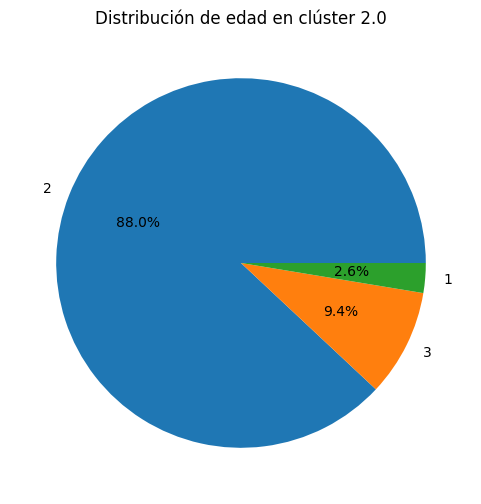

Cluster 6.0, Columna edad, Número de datos: 3


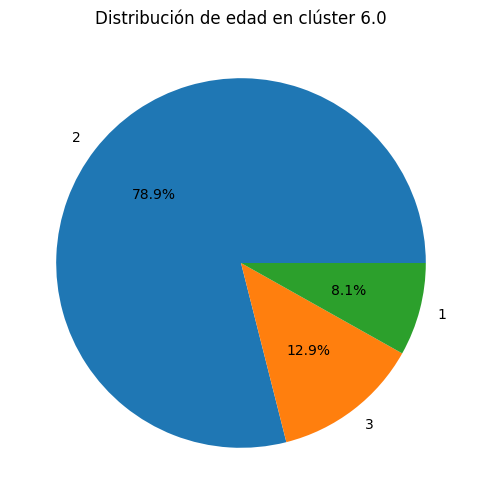

Cluster 7.0, Columna edad, Número de datos: 3


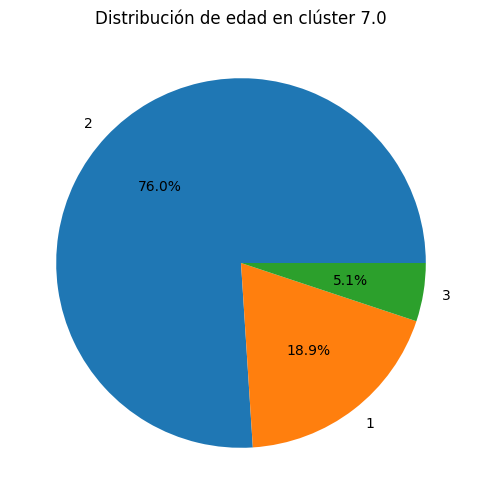

Cluster 4.0, Columna edad, Número de datos: 3


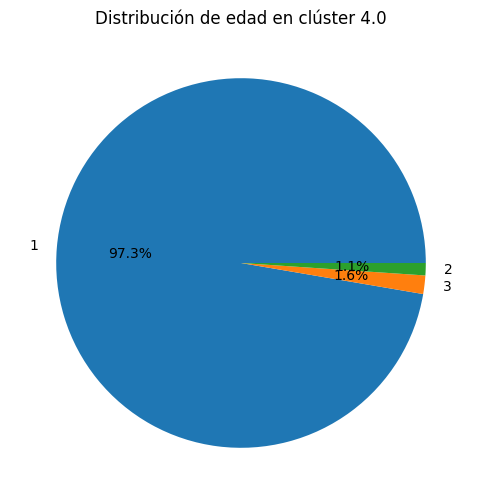

Cluster 3.0, Columna edad, Número de datos: 3


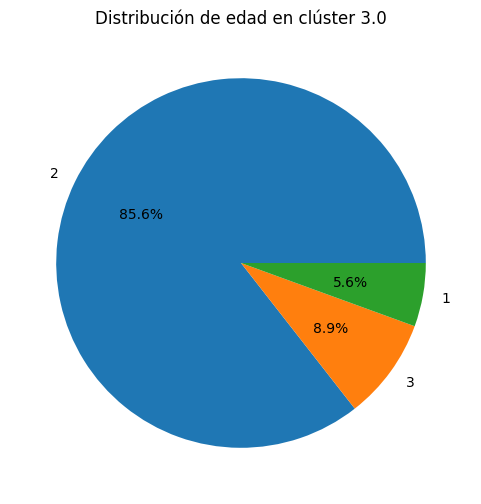

Cluster 5.0, Columna edad, Número de datos: 3


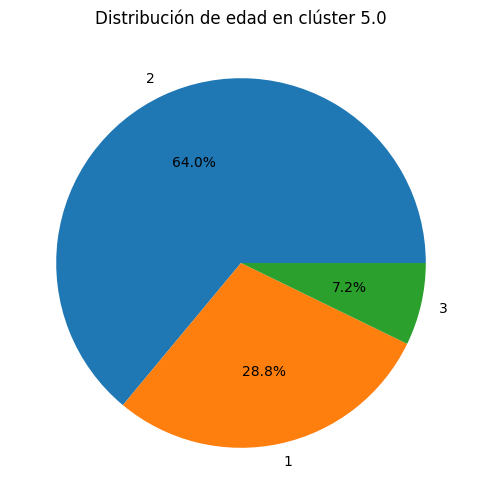

Cluster 0.0, Columna edad, Número de datos: 3


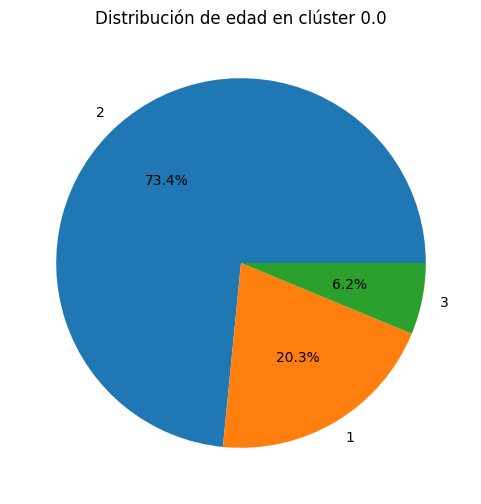

Cluster 1.0, Columna edad, Número de datos: 3


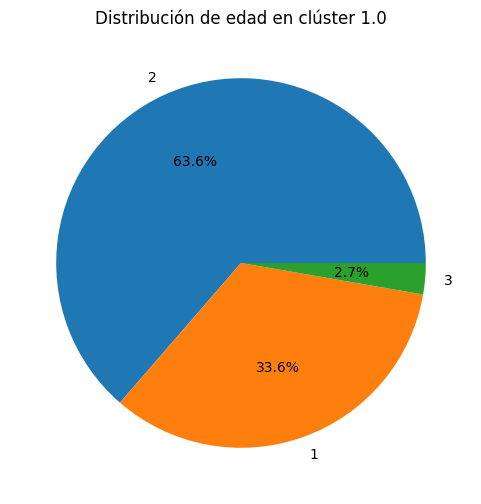

Cluster 8.0, Columna edad, Número de datos: 3


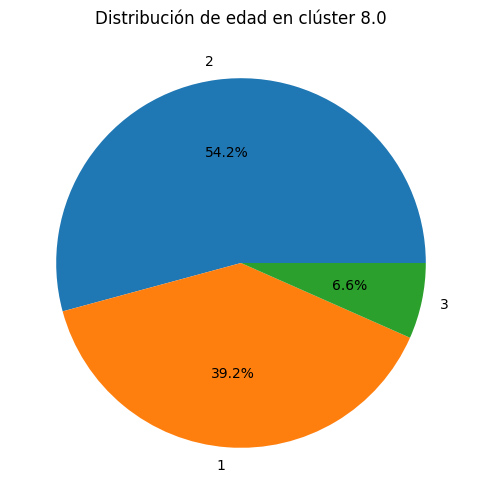

Cluster 2.0, Columna Gen, Número de datos: 1


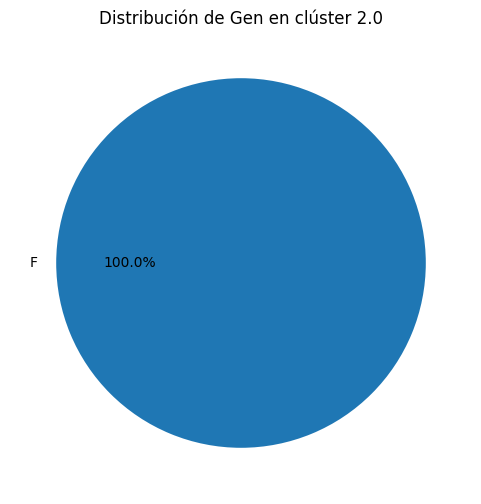

Cluster 6.0, Columna Gen, Número de datos: 2


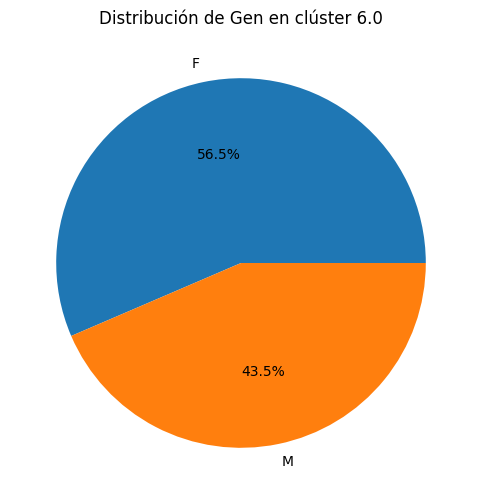

Cluster 7.0, Columna Gen, Número de datos: 1


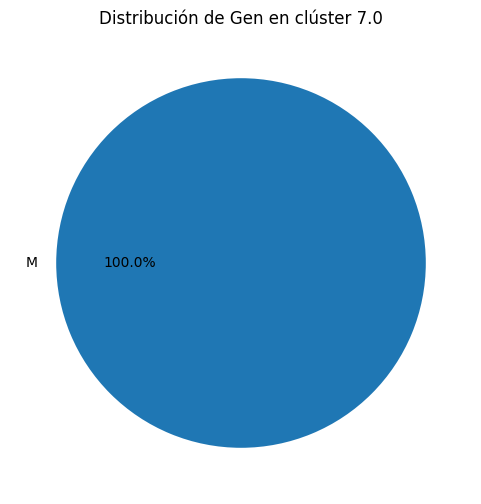

Cluster 4.0, Columna Gen, Número de datos: 2


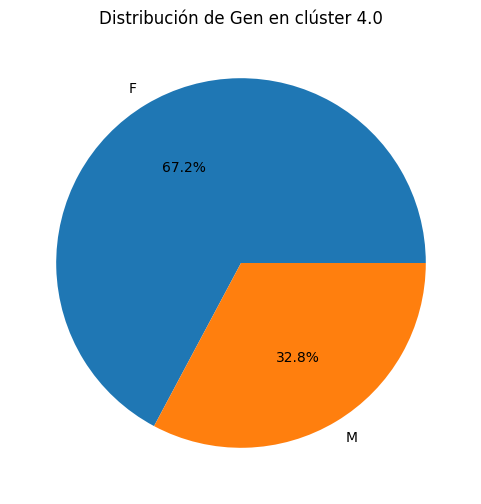

Cluster 3.0, Columna Gen, Número de datos: 2


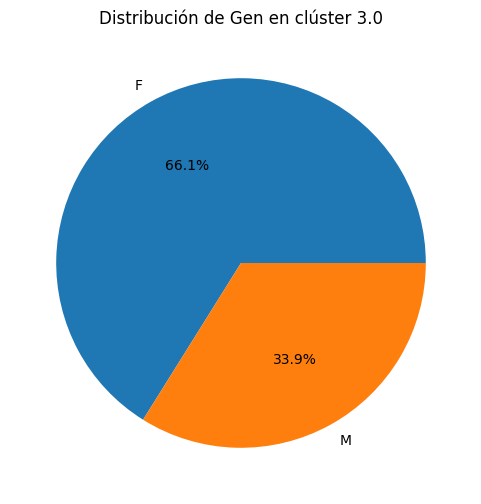

Cluster 5.0, Columna Gen, Número de datos: 2


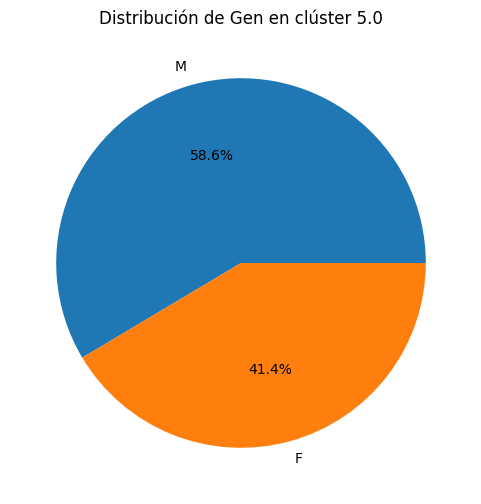

Cluster 0.0, Columna Gen, Número de datos: 2


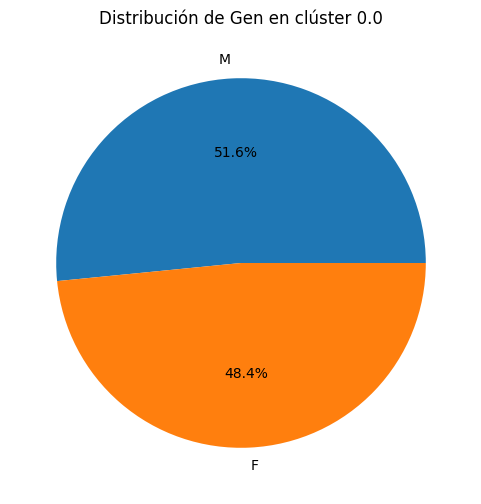

Cluster 1.0, Columna Gen, Número de datos: 2


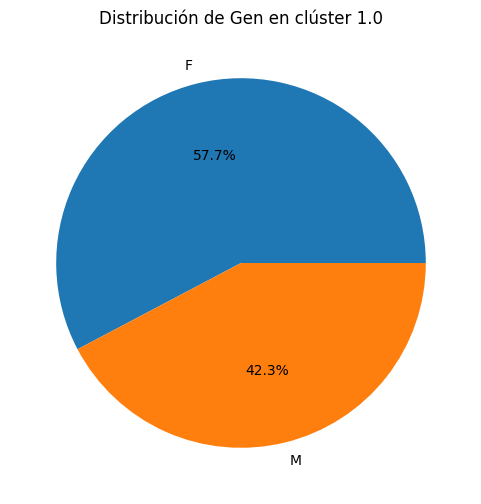

Cluster 8.0, Columna Gen, Número de datos: 2


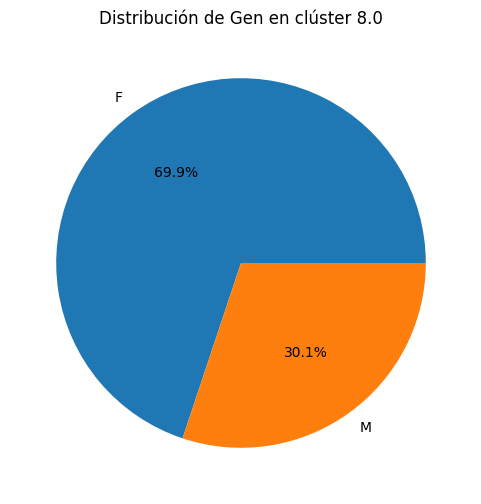

Cluster 2.0, Columna educa, Número de datos: 5


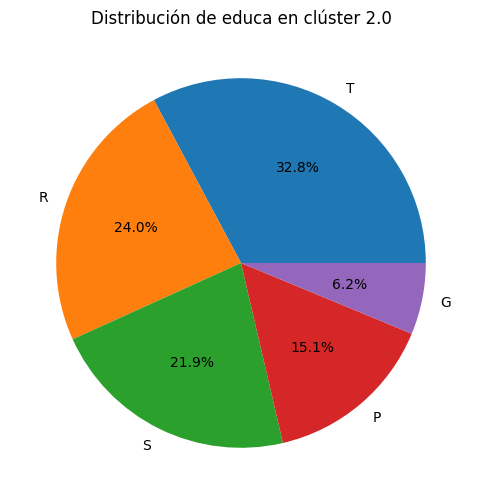

Cluster 6.0, Columna educa, Número de datos: 5


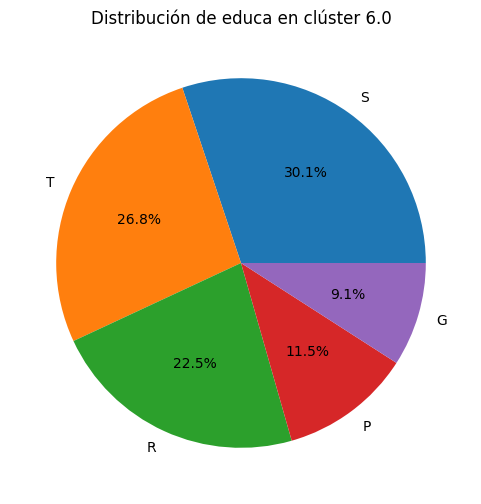

Cluster 7.0, Columna educa, Número de datos: 5


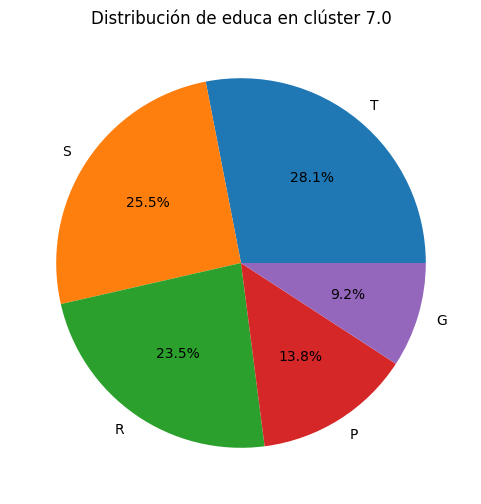

Cluster 4.0, Columna educa, Número de datos: 5


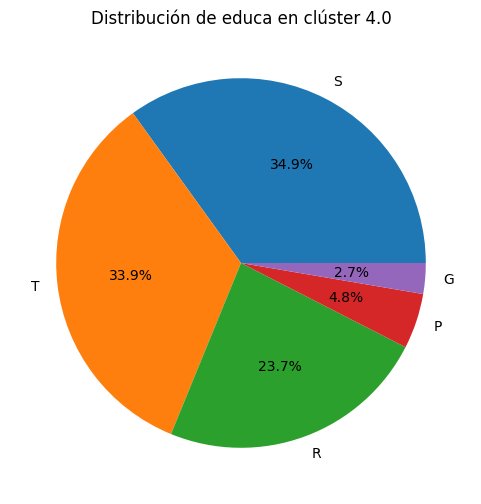

Cluster 3.0, Columna educa, Número de datos: 5


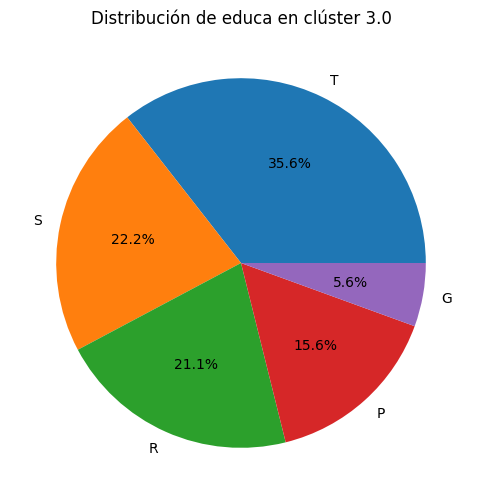

Cluster 5.0, Columna educa, Número de datos: 5


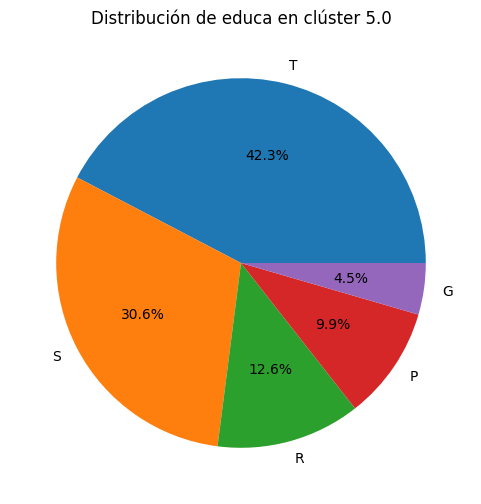

Cluster 0.0, Columna educa, Número de datos: 5


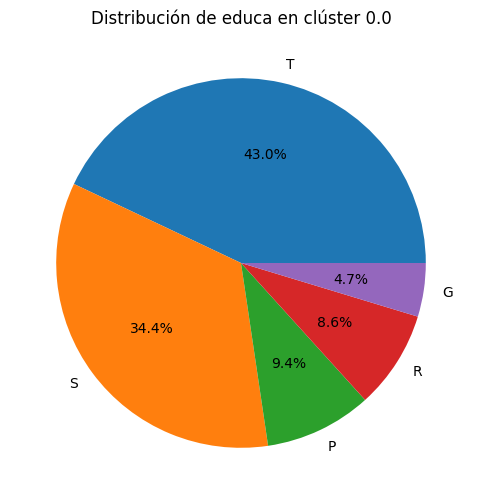

Cluster 1.0, Columna educa, Número de datos: 5


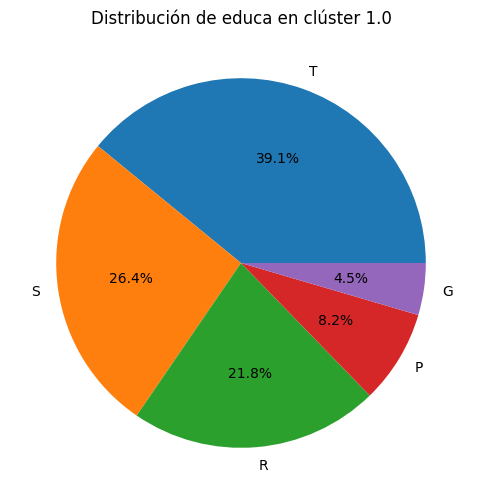

Cluster 8.0, Columna educa, Número de datos: 5


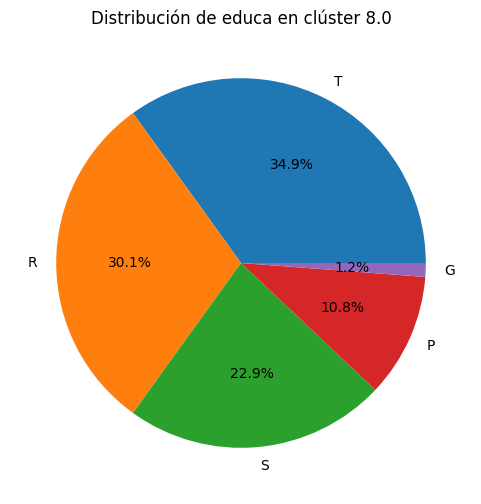

Cluster 2.0, Columna estcivil, Número de datos: 6


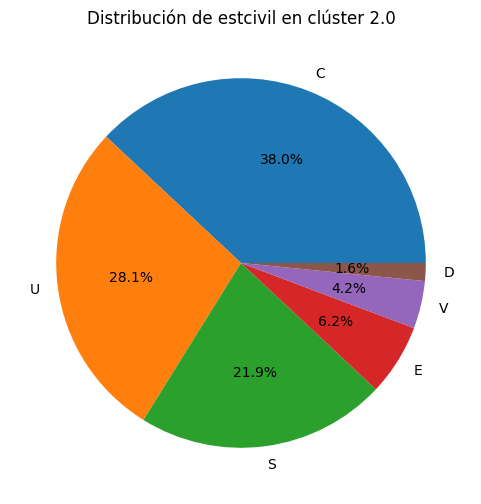

Cluster 6.0, Columna estcivil, Número de datos: 6


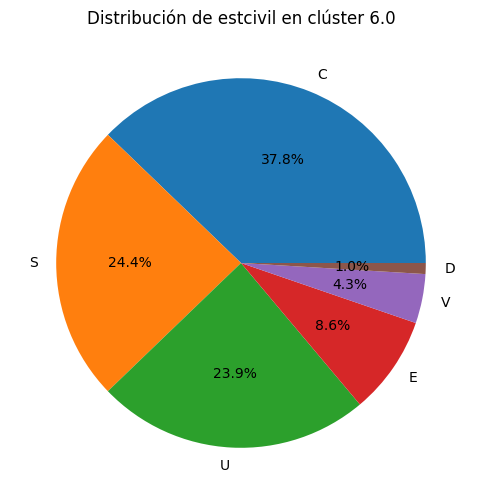

Cluster 7.0, Columna estcivil, Número de datos: 6


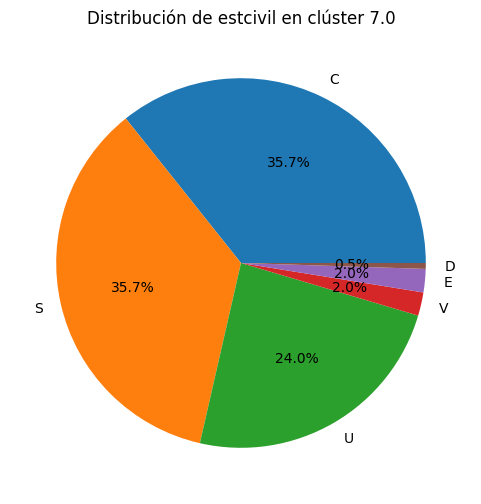

Cluster 4.0, Columna estcivil, Número de datos: 5


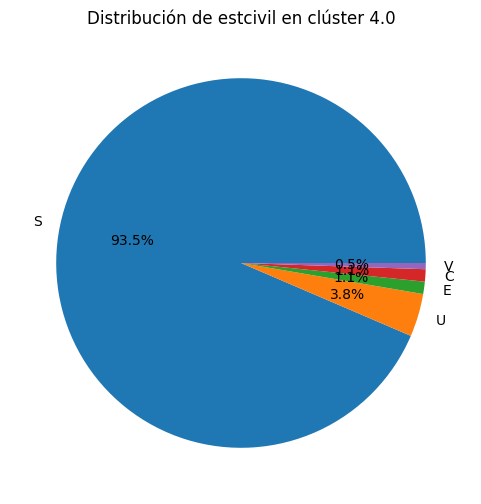

Cluster 3.0, Columna estcivil, Número de datos: 6


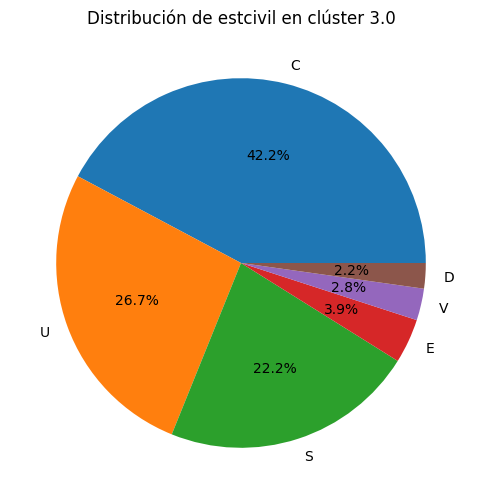

Cluster 5.0, Columna estcivil, Número de datos: 6


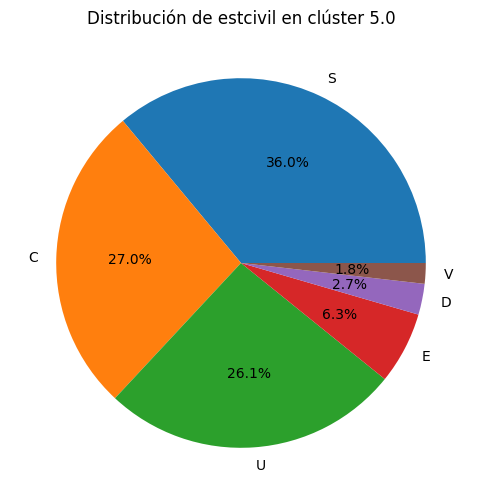

Cluster 0.0, Columna estcivil, Número de datos: 6


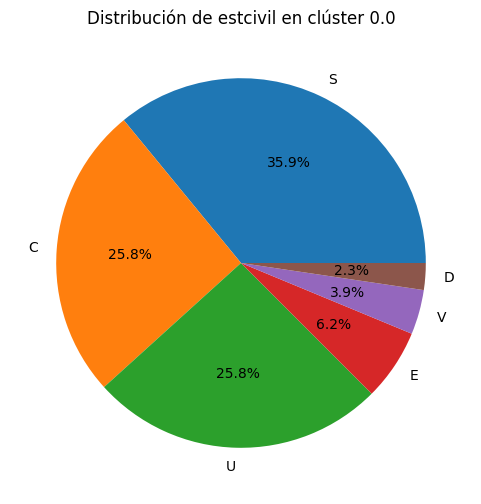

Cluster 1.0, Columna estcivil, Número de datos: 6


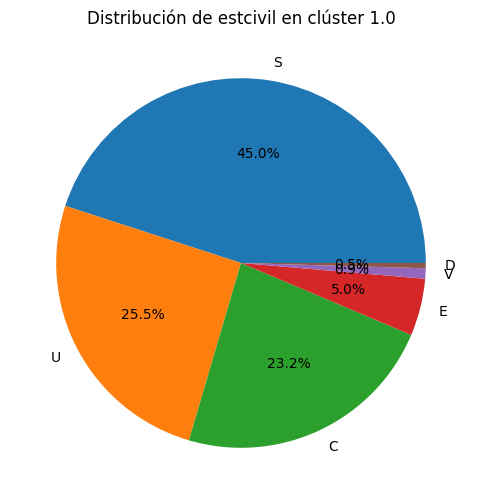

Cluster 8.0, Columna estcivil, Número de datos: 6


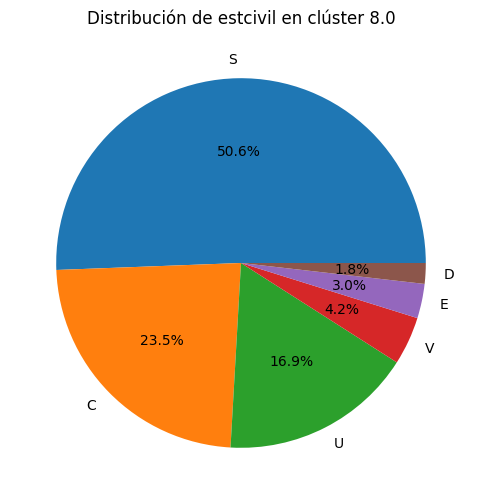

Cluster 2.0, Columna estrato, Número de datos: 4


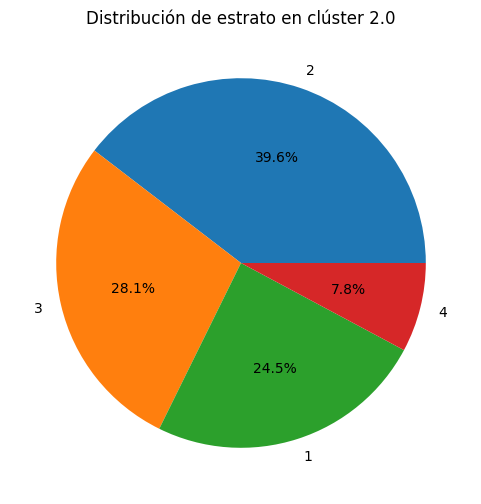

Cluster 6.0, Columna estrato, Número de datos: 6


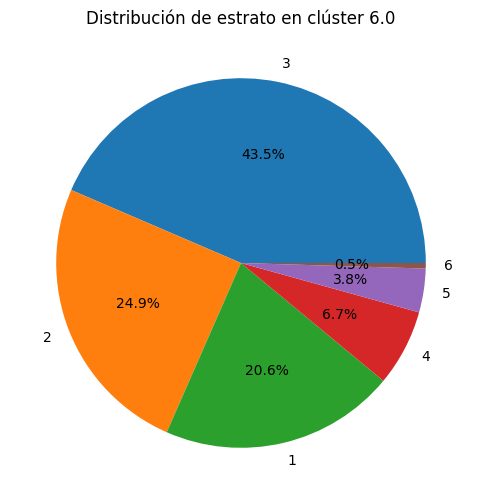

Cluster 7.0, Columna estrato, Número de datos: 5


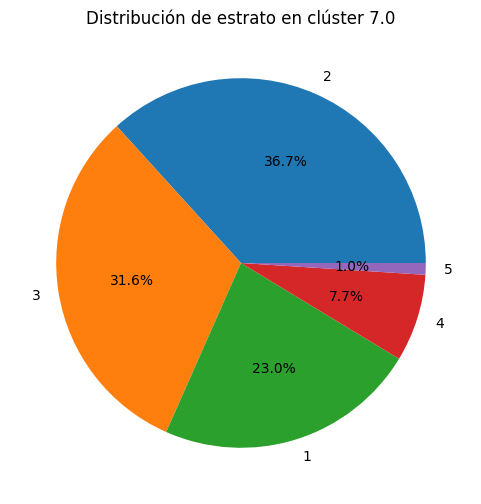

Cluster 4.0, Columna estrato, Número de datos: 5


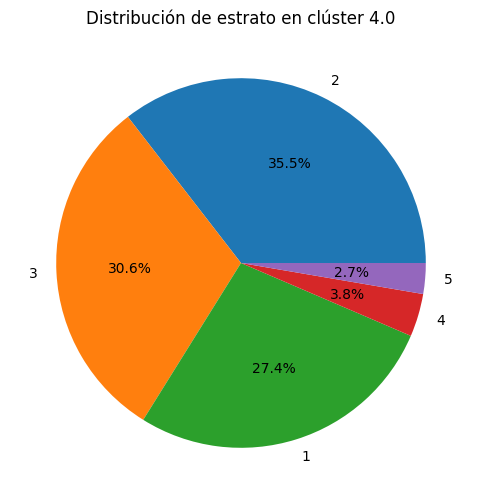

Cluster 3.0, Columna estrato, Número de datos: 5


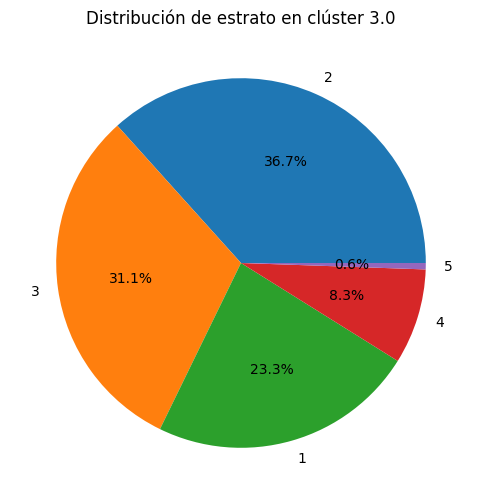

Cluster 5.0, Columna estrato, Número de datos: 5


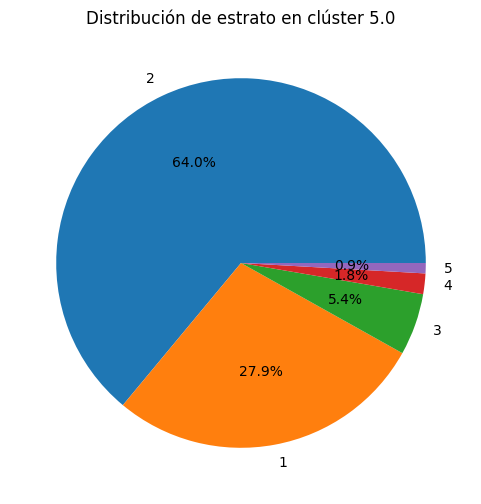

Cluster 0.0, Columna estrato, Número de datos: 5


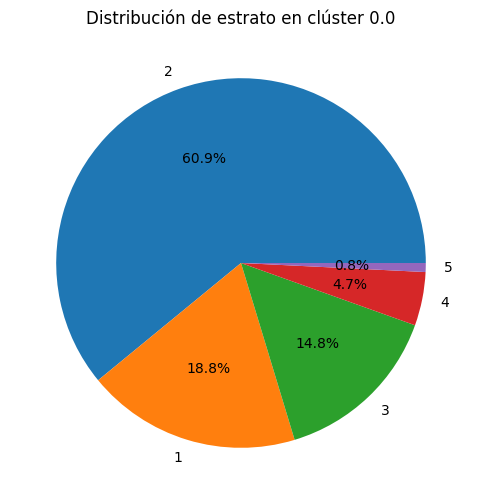

Cluster 1.0, Columna estrato, Número de datos: 5


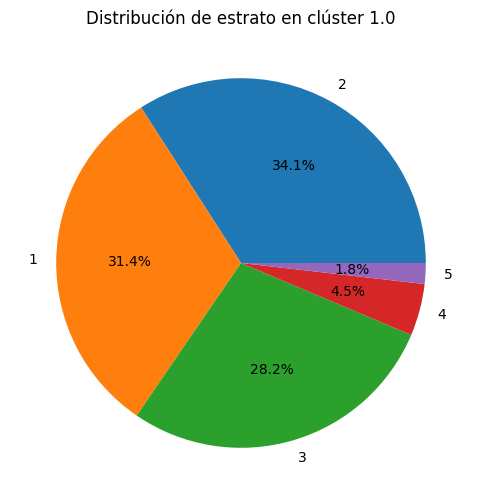

Cluster 8.0, Columna estrato, Número de datos: 6


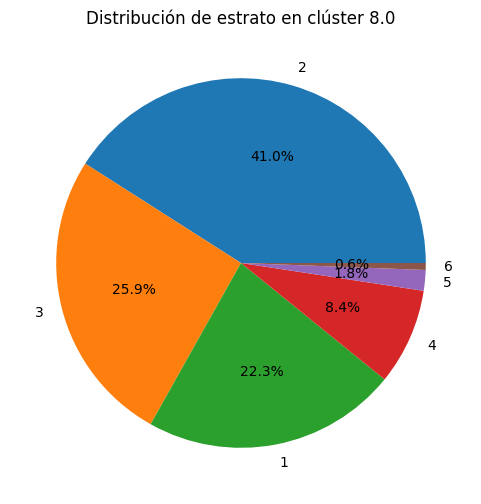

Cluster 2.0, Columna EstVac-19, Número de datos: 2


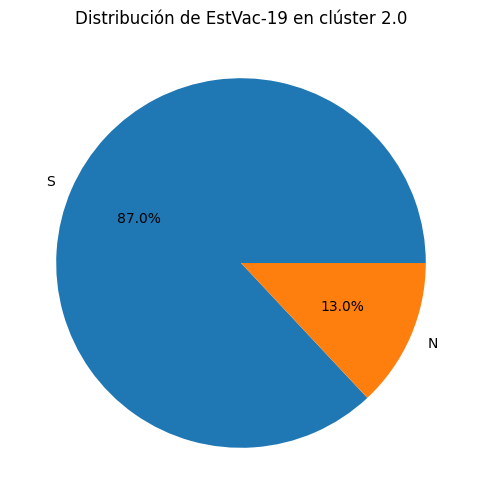

Cluster 6.0, Columna EstVac-19, Número de datos: 2


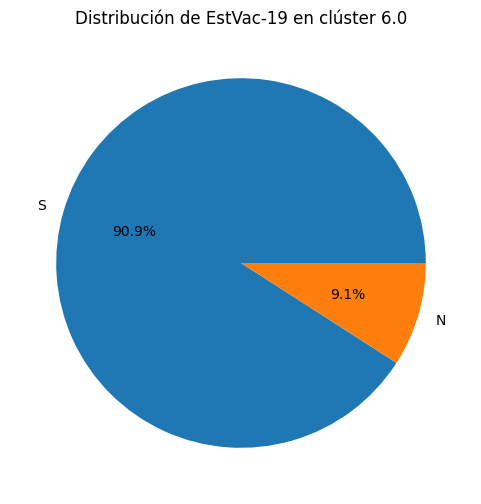

Cluster 7.0, Columna EstVac-19, Número de datos: 2


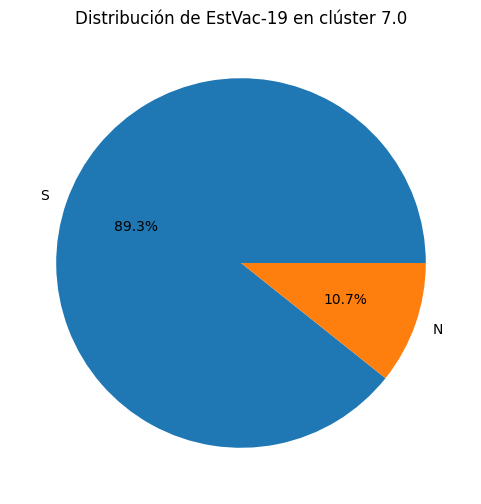

Cluster 4.0, Columna EstVac-19, Número de datos: 2


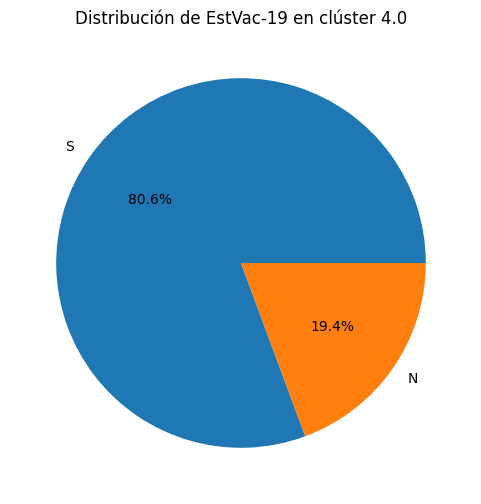

Cluster 3.0, Columna EstVac-19, Número de datos: 2


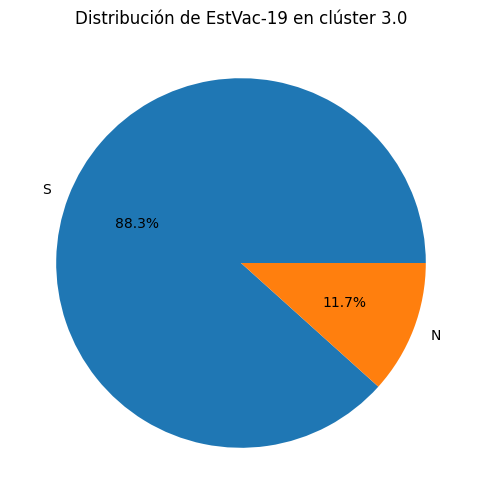

Cluster 5.0, Columna EstVac-19, Número de datos: 2


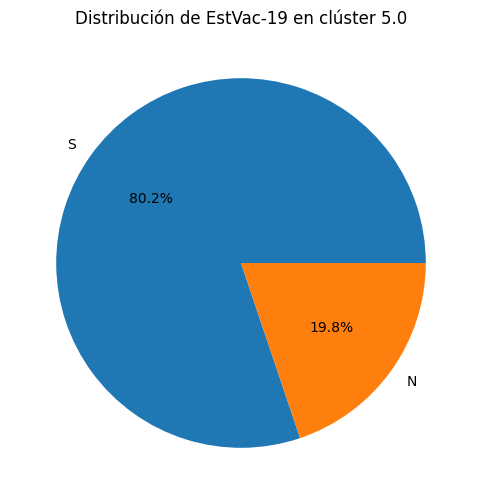

Cluster 0.0, Columna EstVac-19, Número de datos: 2


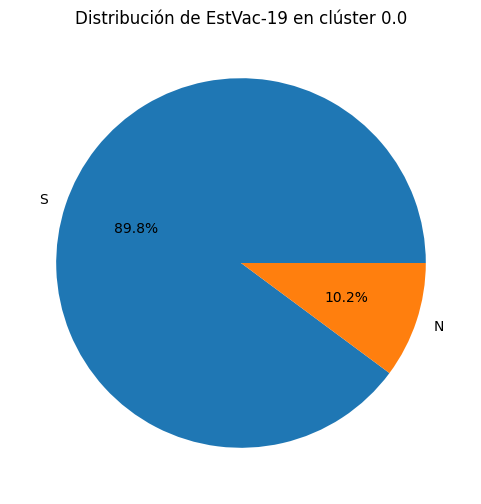

Cluster 1.0, Columna EstVac-19, Número de datos: 2


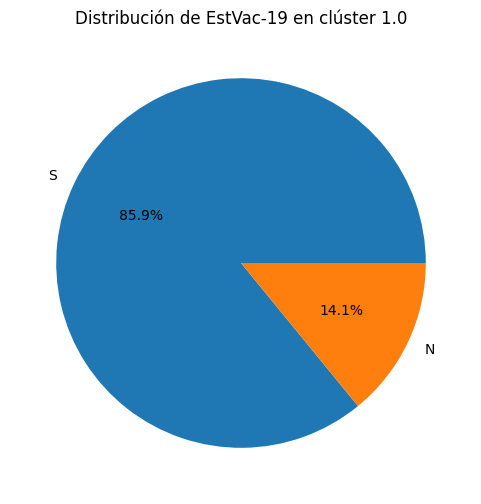

Cluster 8.0, Columna EstVac-19, Número de datos: 2


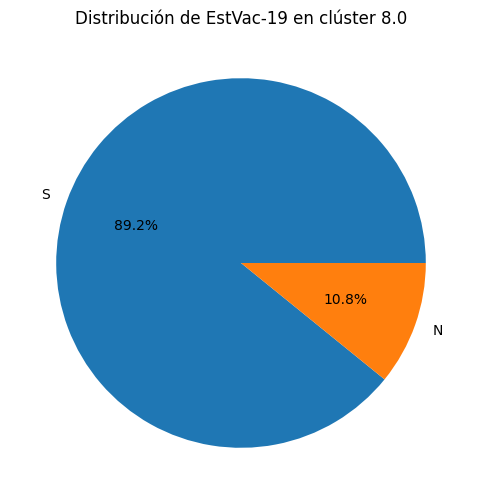

Cluster 2.0, Columna Sintcovid-19, Número de datos: 4


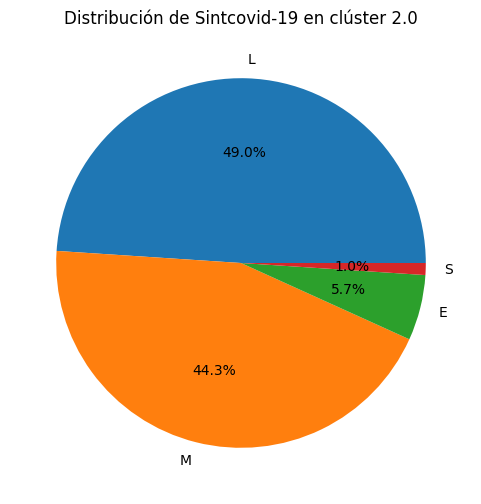

Cluster 6.0, Columna Sintcovid-19, Número de datos: 4


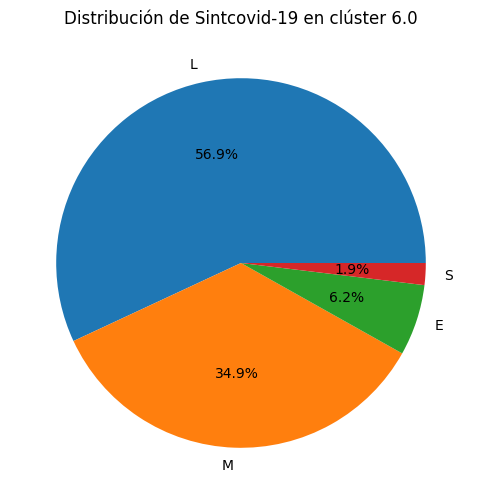

Cluster 7.0, Columna Sintcovid-19, Número de datos: 4


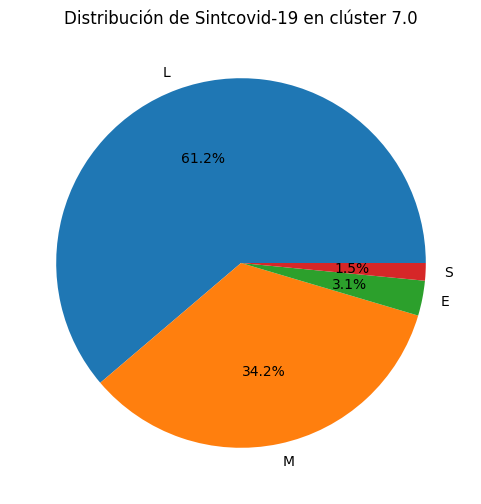

Cluster 4.0, Columna Sintcovid-19, Número de datos: 4


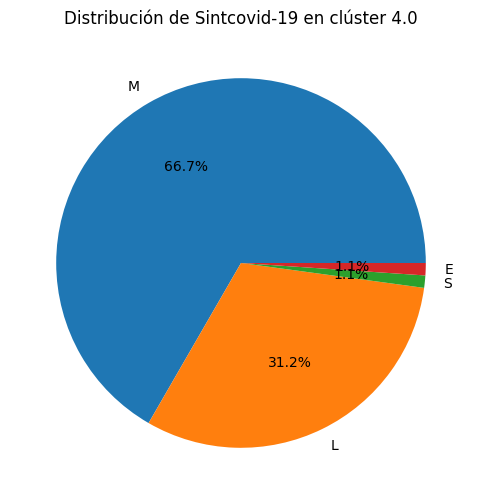

Cluster 3.0, Columna Sintcovid-19, Número de datos: 3


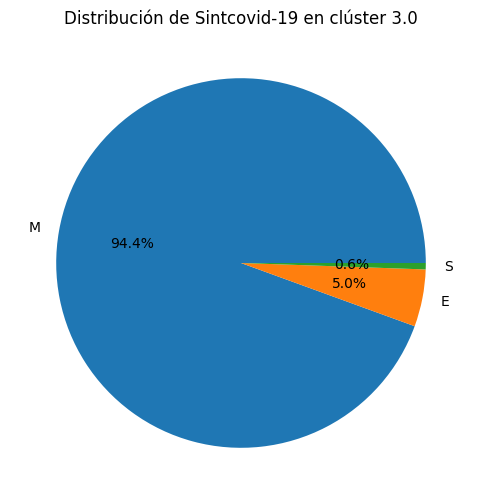

Cluster 5.0, Columna Sintcovid-19, Número de datos: 4


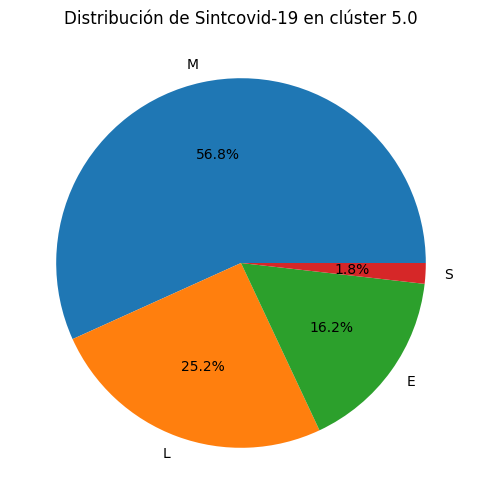

Cluster 0.0, Columna Sintcovid-19, Número de datos: 4


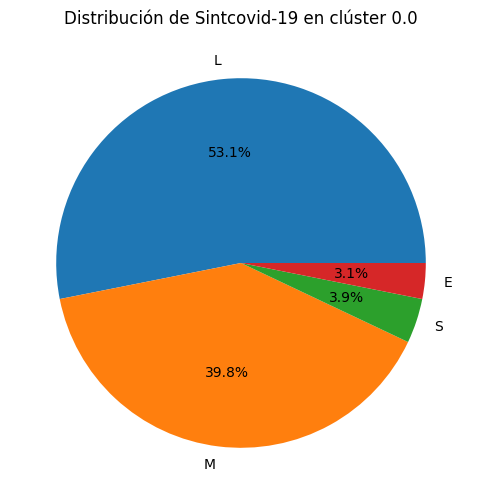

Cluster 1.0, Columna Sintcovid-19, Número de datos: 3


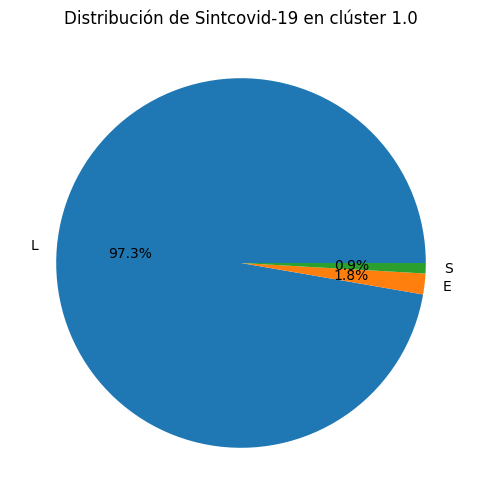

Cluster 8.0, Columna Sintcovid-19, Número de datos: 4


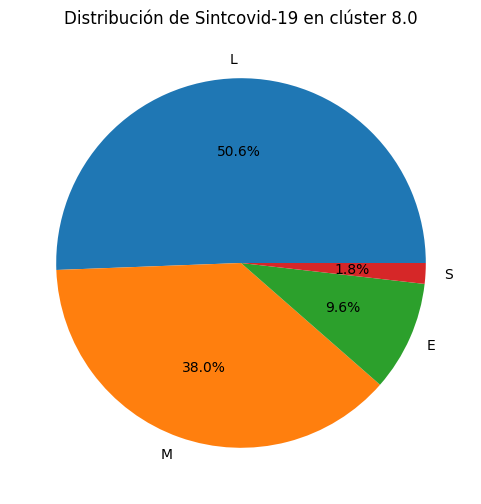

Cluster 2.0, Columna DOLOR C, Número de datos: 2


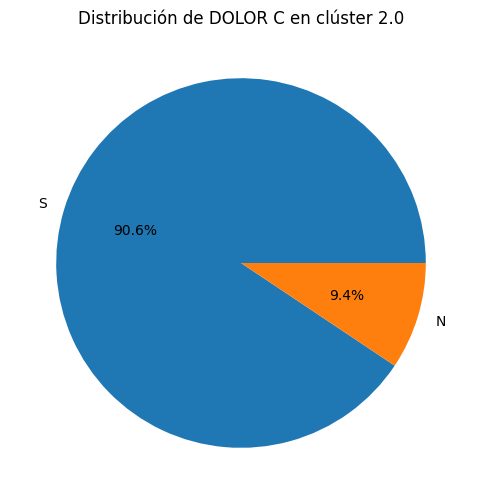

Cluster 6.0, Columna DOLOR C, Número de datos: 2


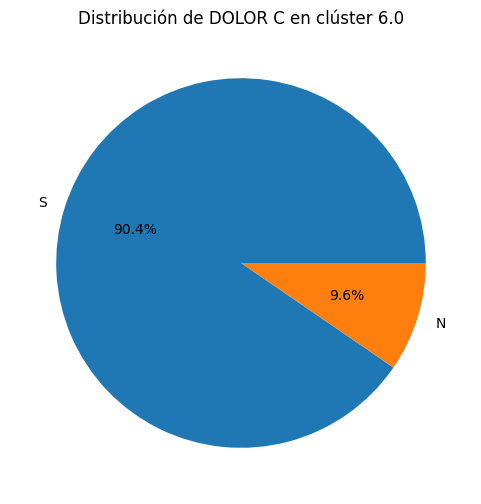

Cluster 7.0, Columna DOLOR C, Número de datos: 2


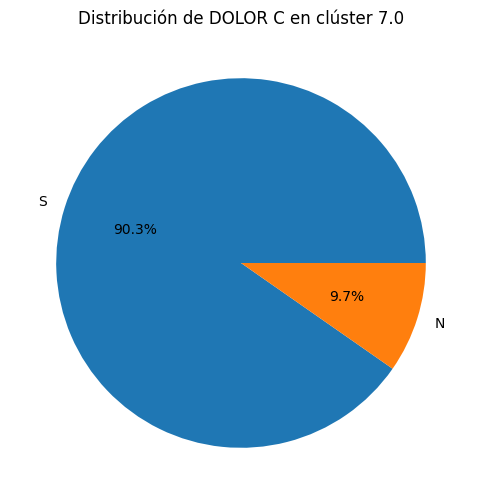

Cluster 4.0, Columna DOLOR C, Número de datos: 2


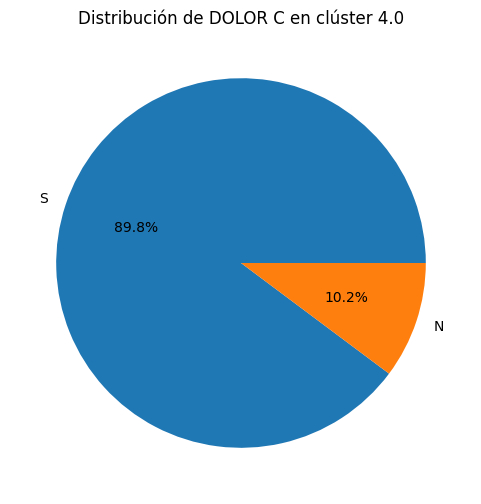

Cluster 3.0, Columna DOLOR C, Número de datos: 2


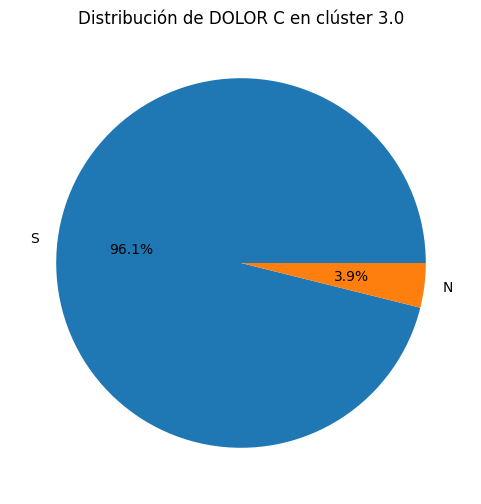

Cluster 5.0, Columna DOLOR C, Número de datos: 2


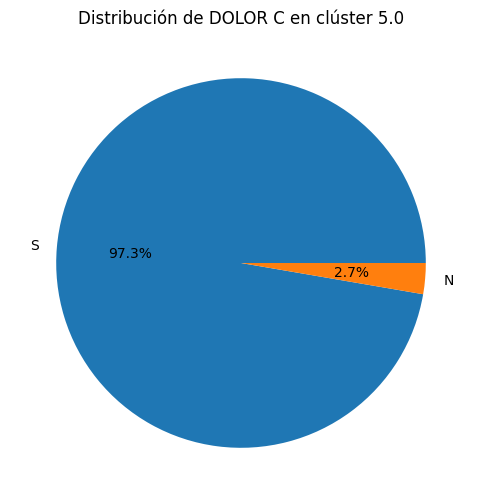

Cluster 0.0, Columna DOLOR C, Número de datos: 2


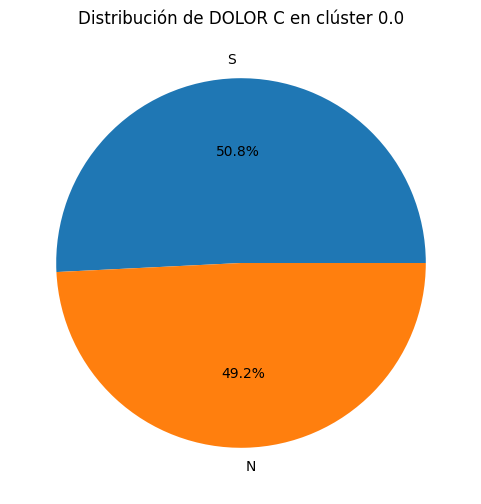

Cluster 1.0, Columna DOLOR C, Número de datos: 2


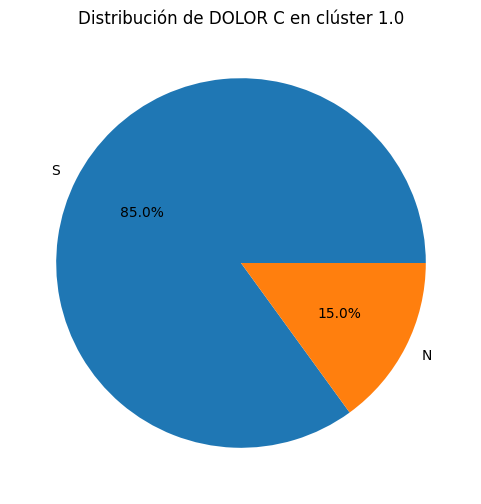

Cluster 8.0, Columna DOLOR C, Número de datos: 2


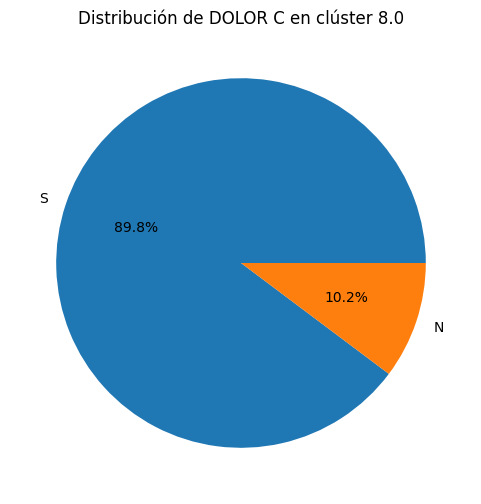

Cluster 2.0, Columna PT OLFATO, Número de datos: 2


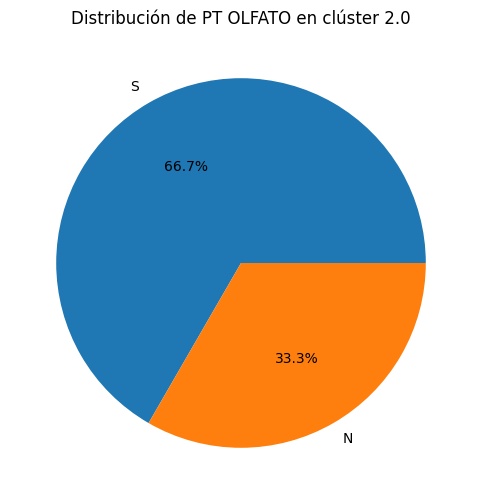

Cluster 6.0, Columna PT OLFATO, Número de datos: 2


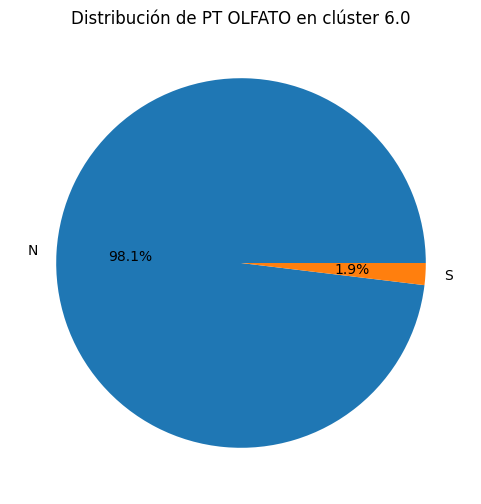

Cluster 7.0, Columna PT OLFATO, Número de datos: 2


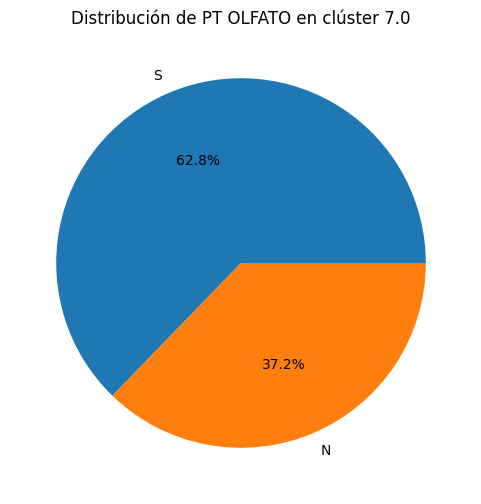

Cluster 4.0, Columna PT OLFATO, Número de datos: 2


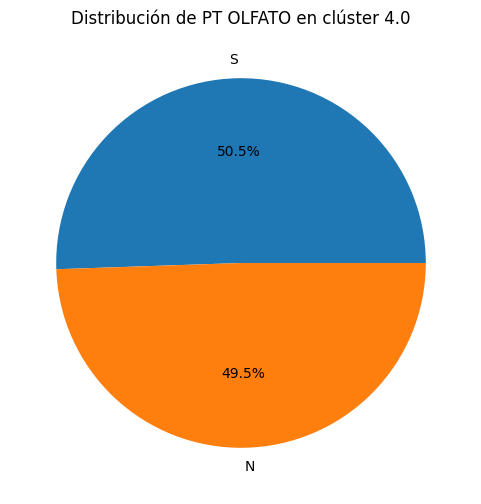

Cluster 3.0, Columna PT OLFATO, Número de datos: 2


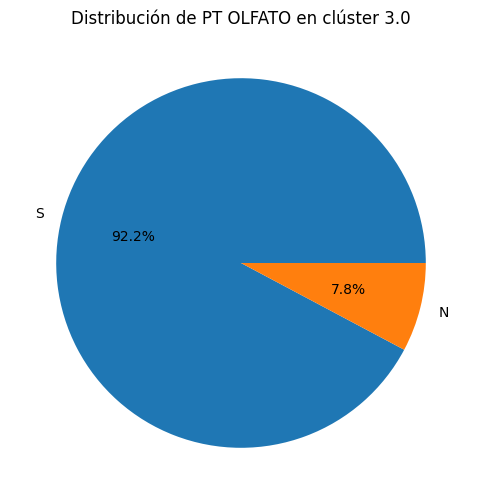

Cluster 5.0, Columna PT OLFATO, Número de datos: 2


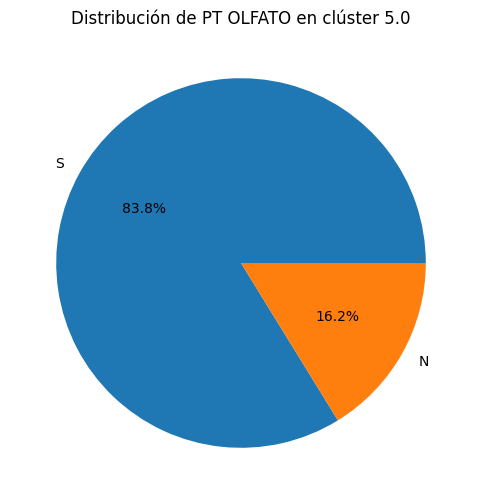

Cluster 0.0, Columna PT OLFATO, Número de datos: 2


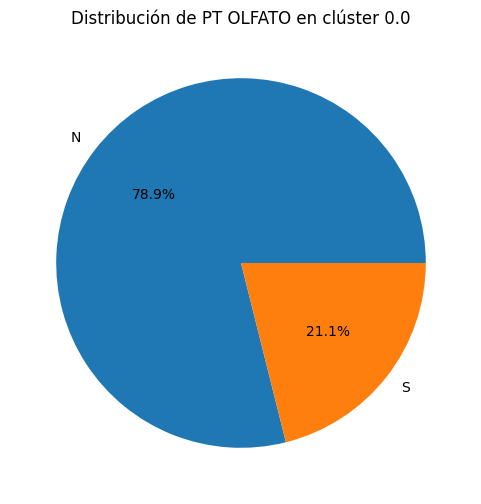

Cluster 1.0, Columna PT OLFATO, Número de datos: 2


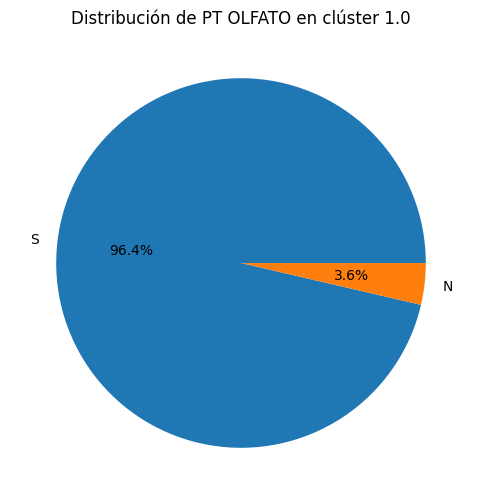

Cluster 8.0, Columna PT OLFATO, Número de datos: 2


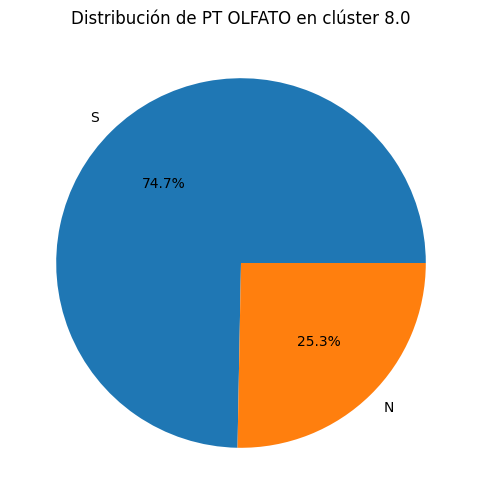

Cluster 2.0, Columna PP OLFATO, Número de datos: 2


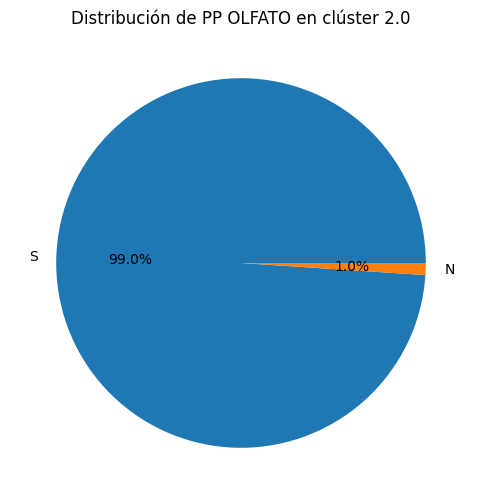

Cluster 6.0, Columna PP OLFATO, Número de datos: 2


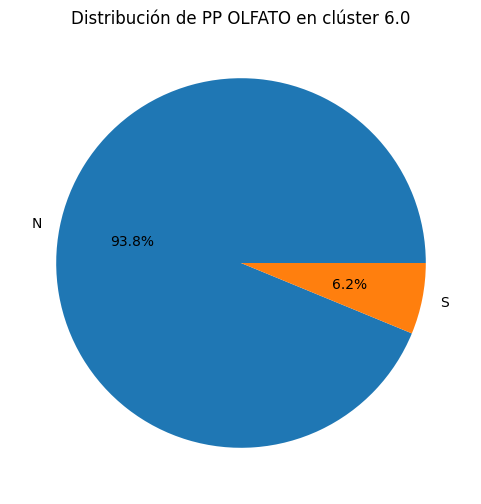

Cluster 7.0, Columna PP OLFATO, Número de datos: 2


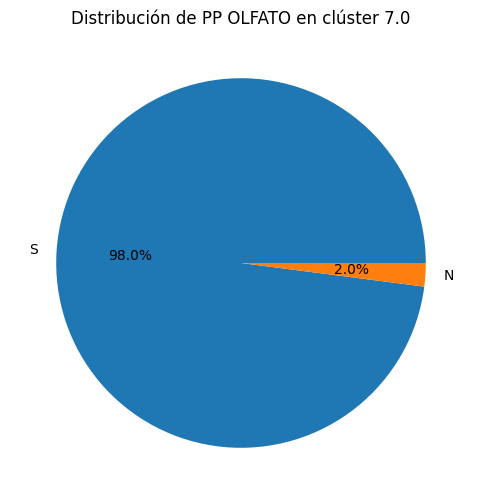

Cluster 4.0, Columna PP OLFATO, Número de datos: 2


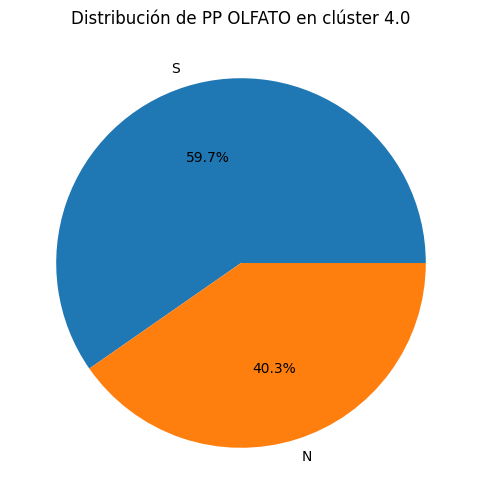

Cluster 3.0, Columna PP OLFATO, Número de datos: 1


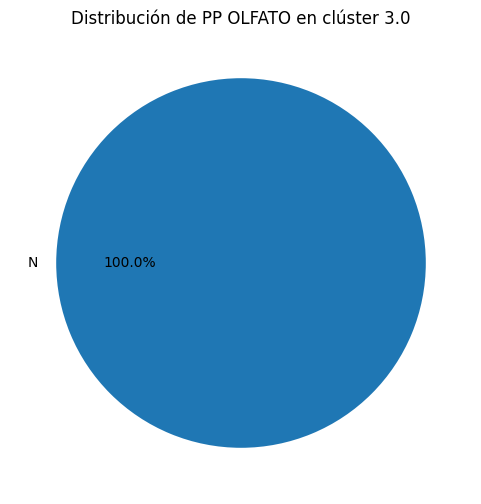

Cluster 5.0, Columna PP OLFATO, Número de datos: 2


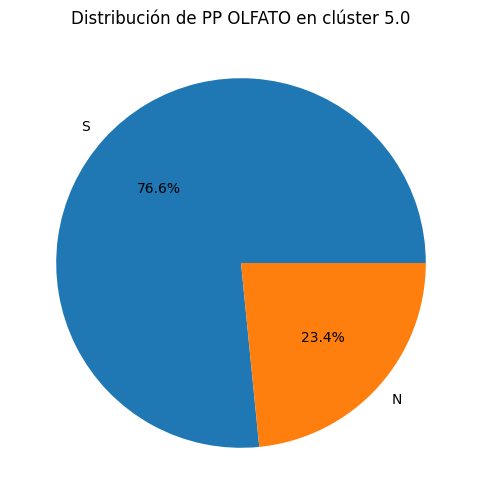

Cluster 0.0, Columna PP OLFATO, Número de datos: 2


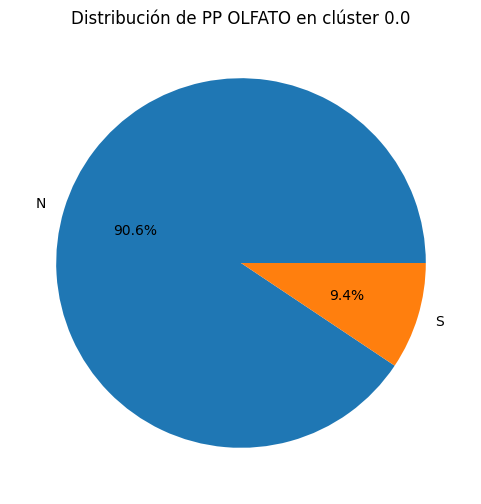

Cluster 1.0, Columna PP OLFATO, Número de datos: 2


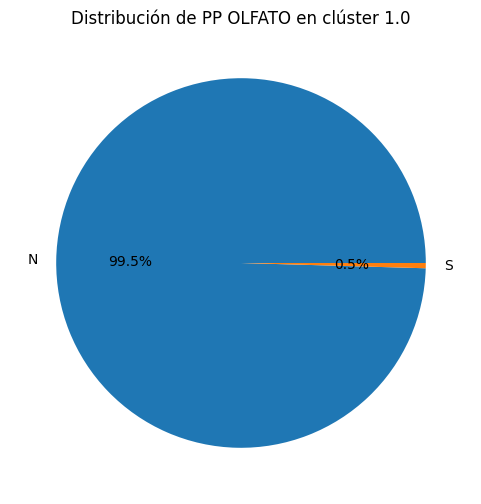

Cluster 8.0, Columna PP OLFATO, Número de datos: 2


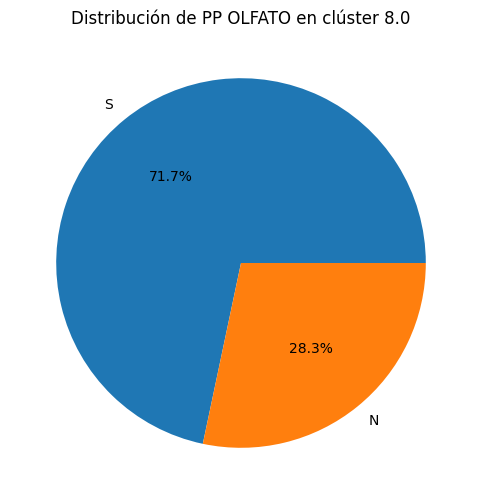

Cluster 2.0, Columna P GUSTO, Número de datos: 2


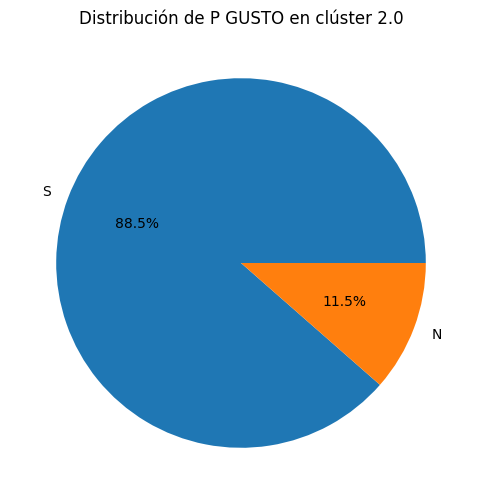

Cluster 6.0, Columna P GUSTO, Número de datos: 2


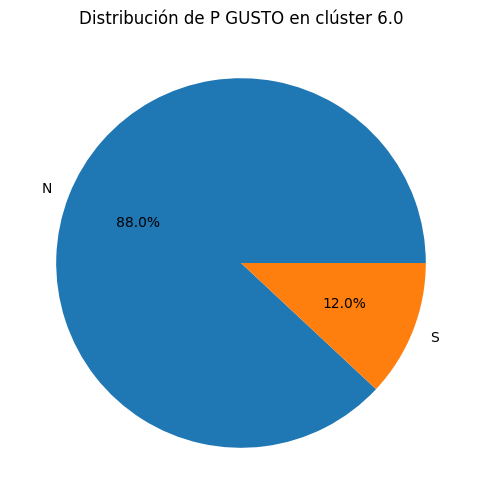

Cluster 7.0, Columna P GUSTO, Número de datos: 2


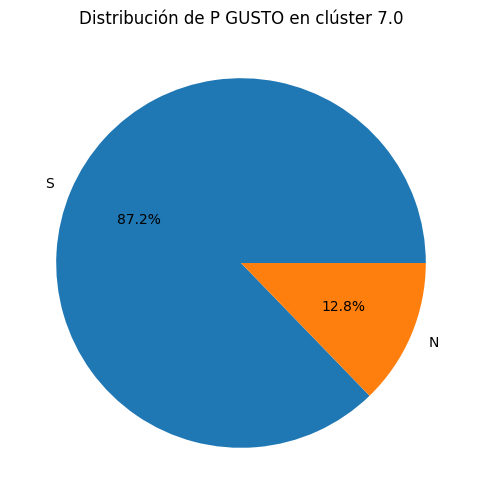

Cluster 4.0, Columna P GUSTO, Número de datos: 2


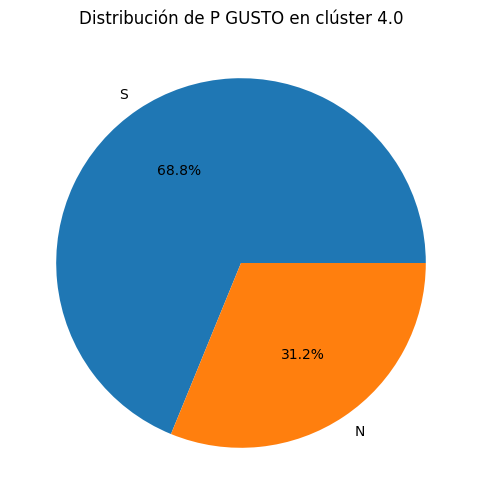

Cluster 3.0, Columna P GUSTO, Número de datos: 2


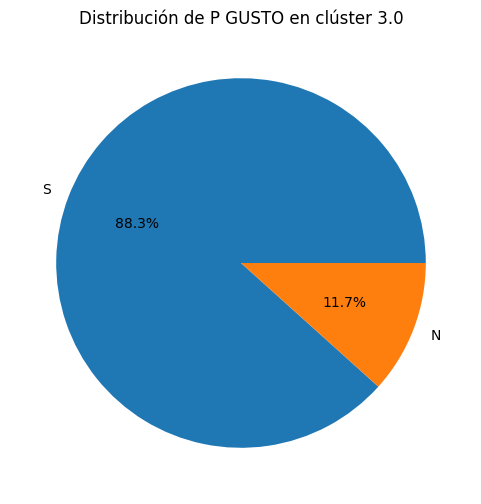

Cluster 5.0, Columna P GUSTO, Número de datos: 2


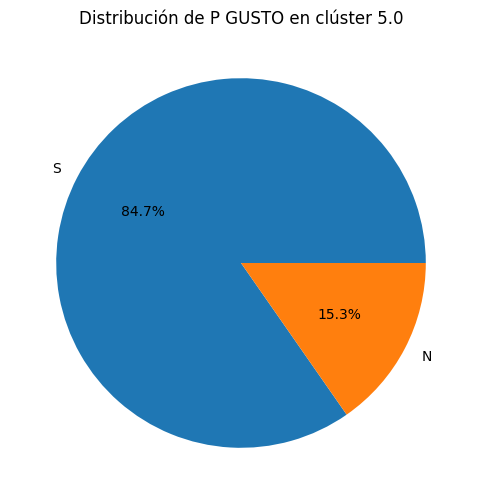

Cluster 0.0, Columna P GUSTO, Número de datos: 2


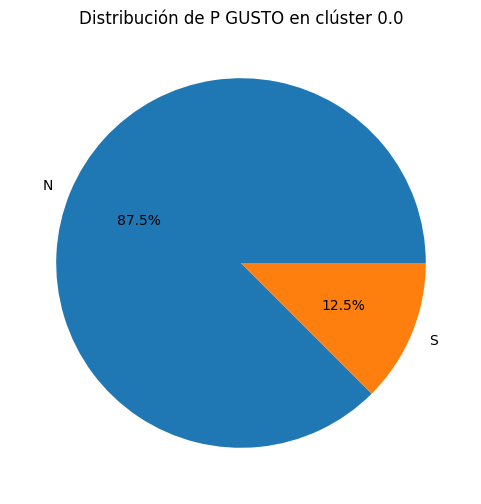

Cluster 1.0, Columna P GUSTO, Número de datos: 2


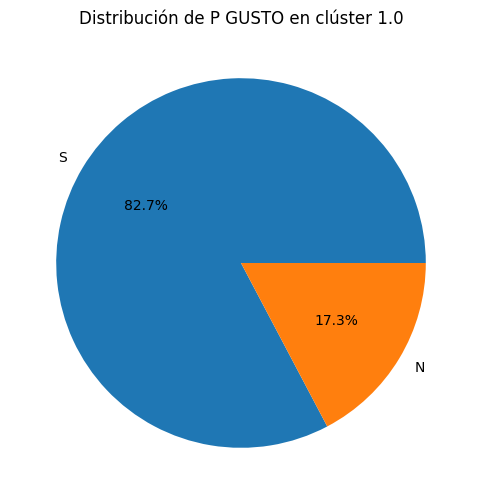

Cluster 8.0, Columna P GUSTO, Número de datos: 2


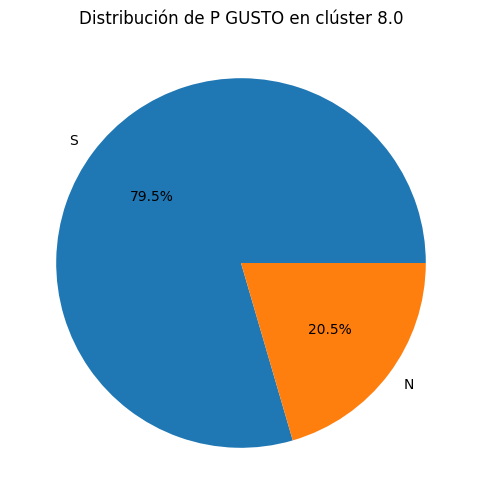

Cluster 2.0, Columna CONFUS, Número de datos: 2


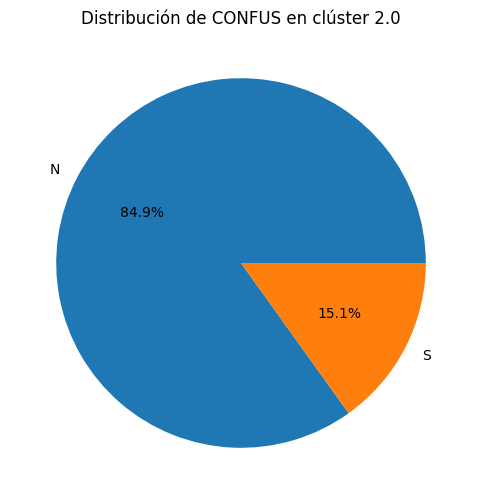

Cluster 6.0, Columna CONFUS, Número de datos: 2


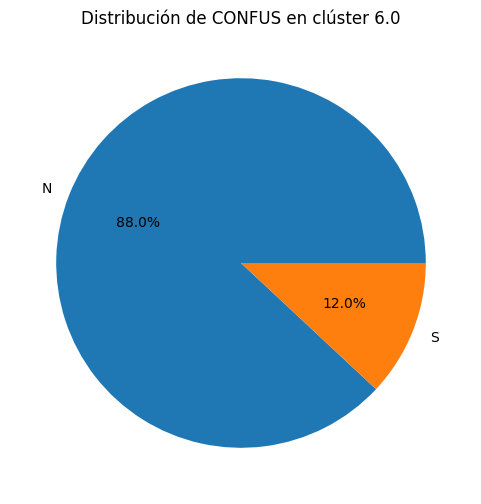

Cluster 7.0, Columna CONFUS, Número de datos: 2


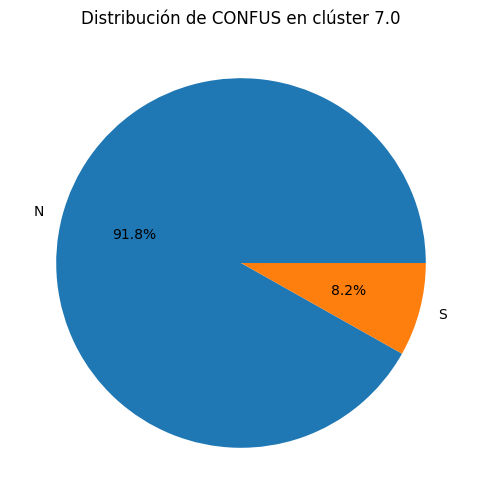

Cluster 4.0, Columna CONFUS, Número de datos: 2


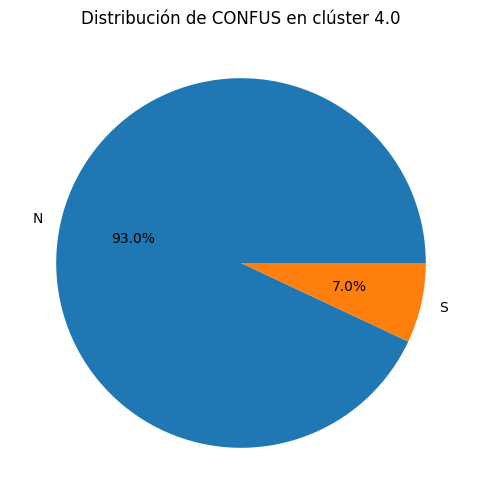

Cluster 3.0, Columna CONFUS, Número de datos: 2


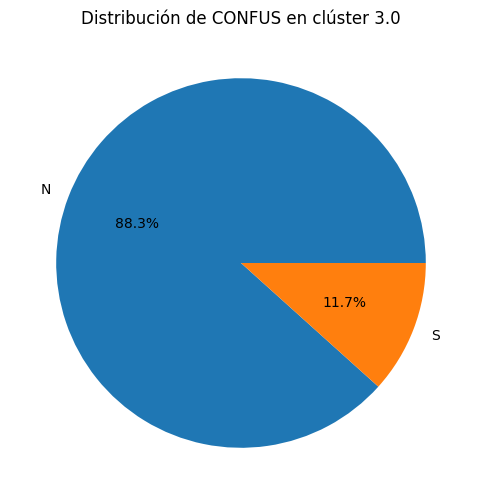

Cluster 5.0, Columna CONFUS, Número de datos: 2


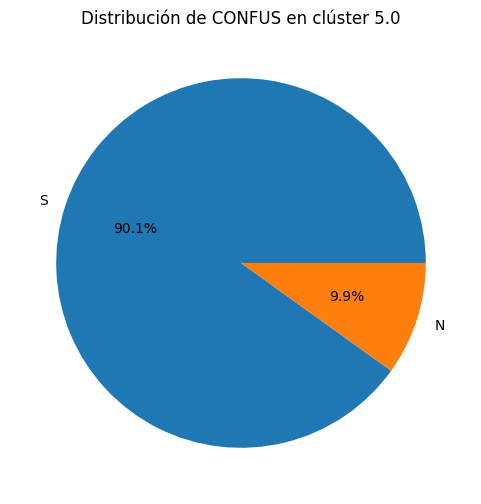

Cluster 0.0, Columna CONFUS, Número de datos: 2


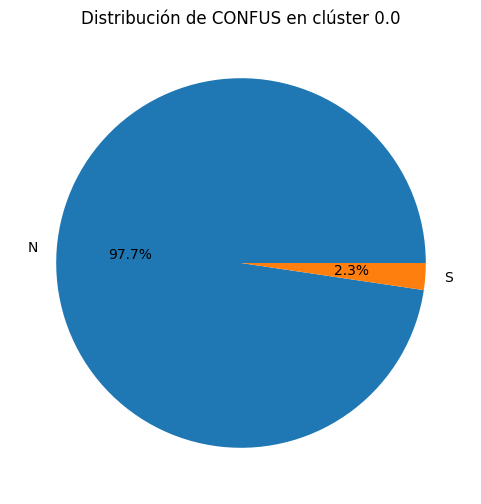

Cluster 1.0, Columna CONFUS, Número de datos: 2


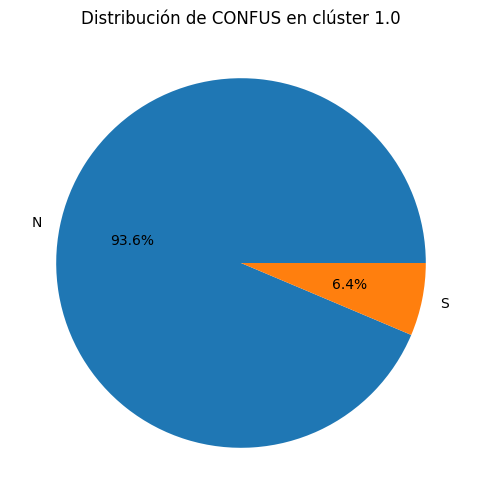

Cluster 8.0, Columna CONFUS, Número de datos: 2


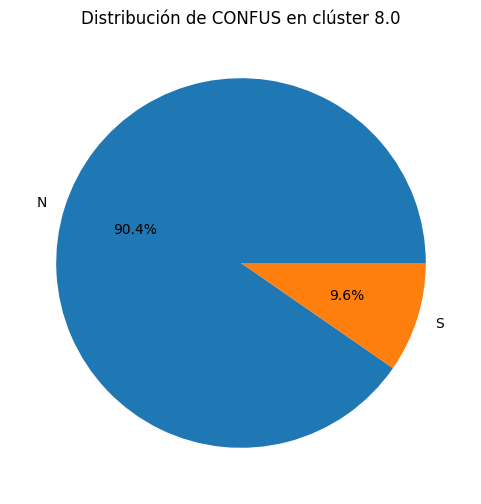

Cluster 2.0, Columna DESORIENTA, Número de datos: 2


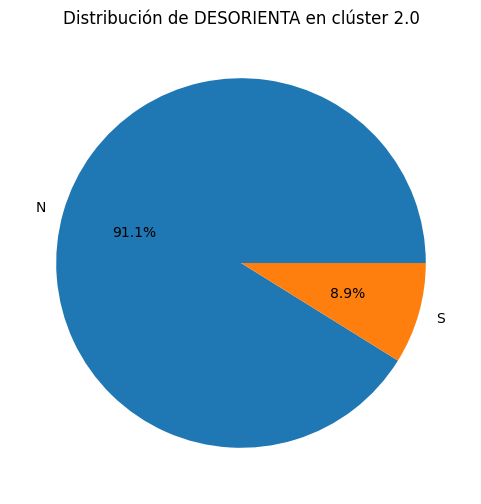

Cluster 6.0, Columna DESORIENTA, Número de datos: 2


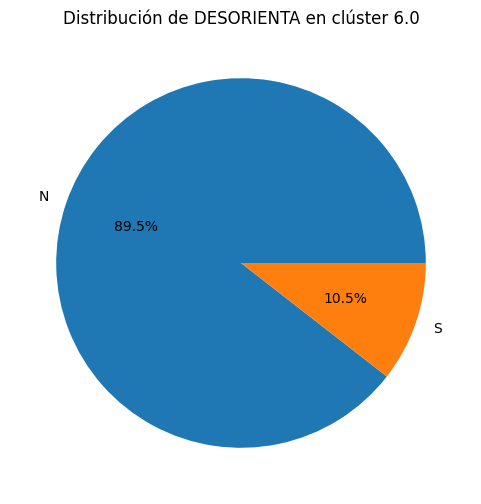

Cluster 7.0, Columna DESORIENTA, Número de datos: 2


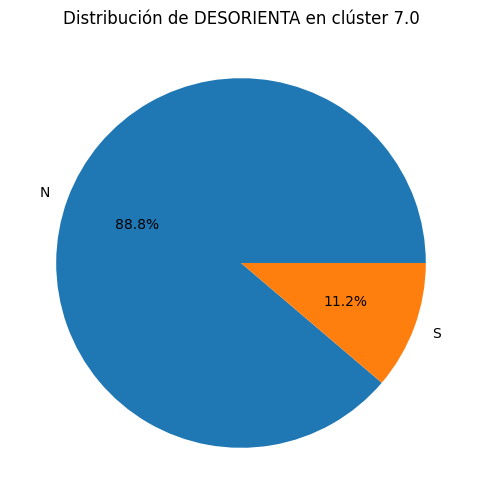

Cluster 4.0, Columna DESORIENTA, Número de datos: 2


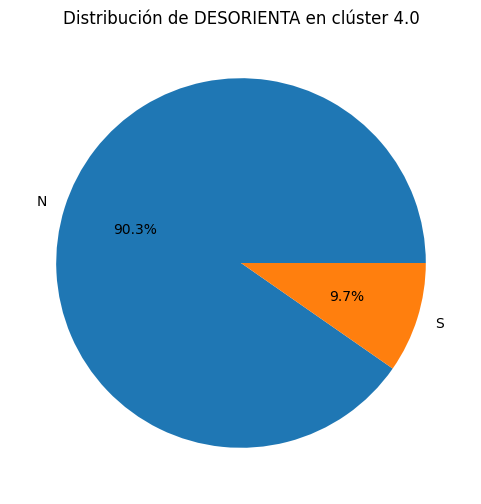

Cluster 3.0, Columna DESORIENTA, Número de datos: 2


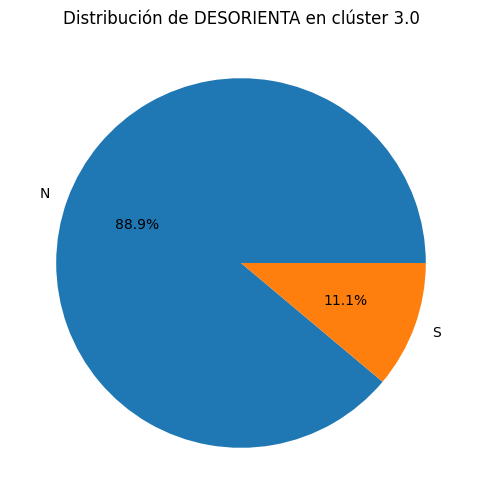

Cluster 5.0, Columna DESORIENTA, Número de datos: 2


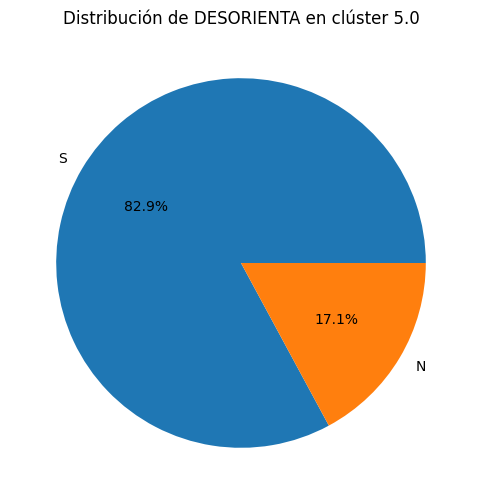

Cluster 0.0, Columna DESORIENTA, Número de datos: 2


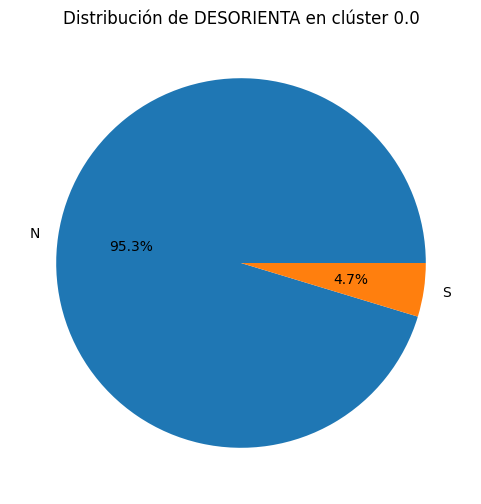

Cluster 1.0, Columna DESORIENTA, Número de datos: 2


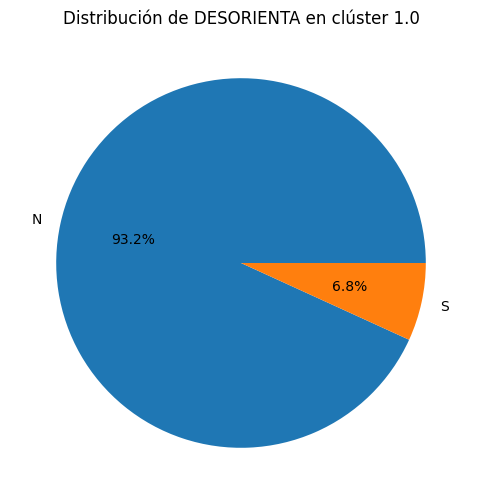

Cluster 8.0, Columna DESORIENTA, Número de datos: 2


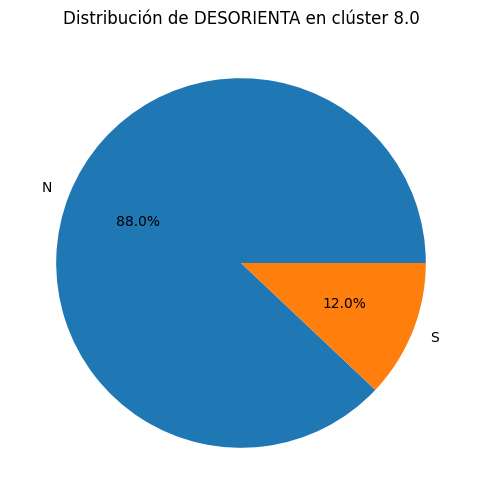

Cluster 2.0, Columna F ENERGIA, Número de datos: 2


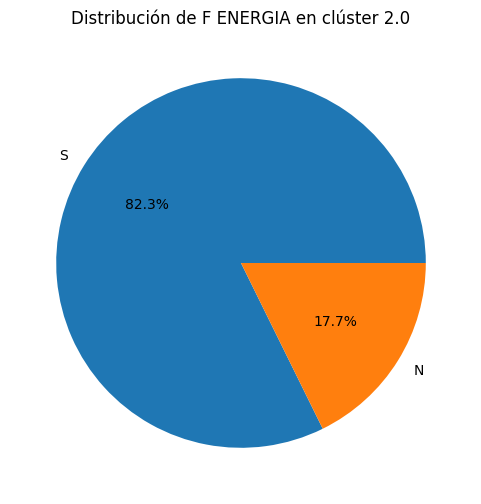

Cluster 6.0, Columna F ENERGIA, Número de datos: 2


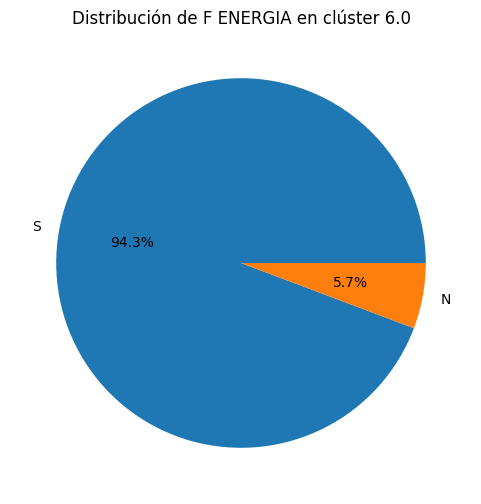

Cluster 7.0, Columna F ENERGIA, Número de datos: 2


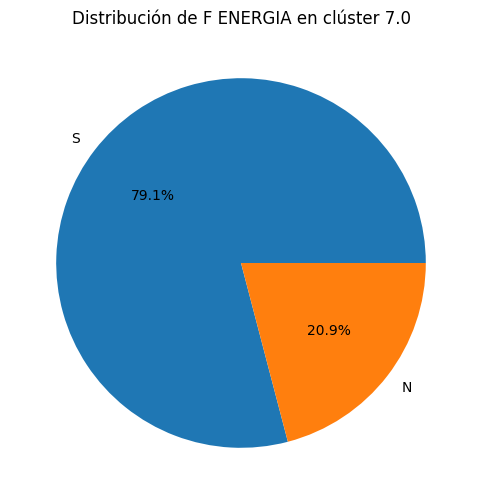

Cluster 4.0, Columna F ENERGIA, Número de datos: 2


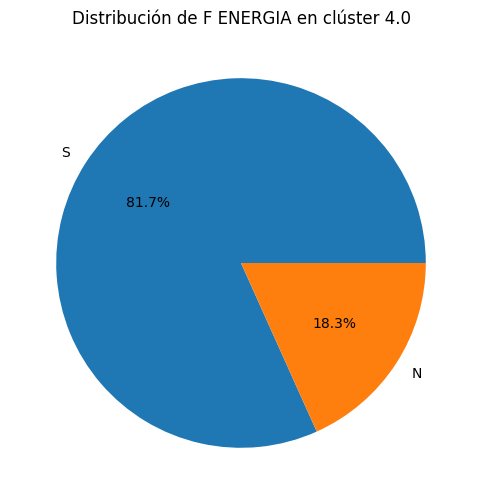

Cluster 3.0, Columna F ENERGIA, Número de datos: 2


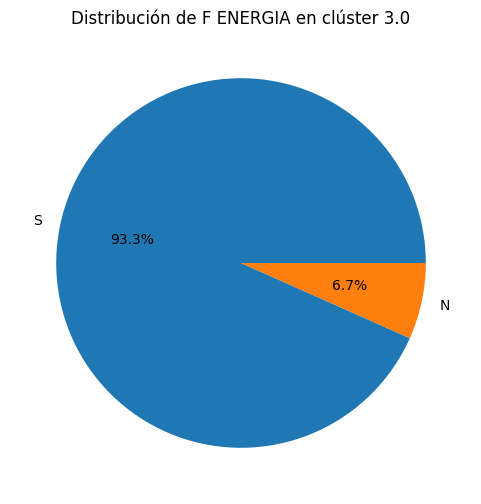

Cluster 5.0, Columna F ENERGIA, Número de datos: 2


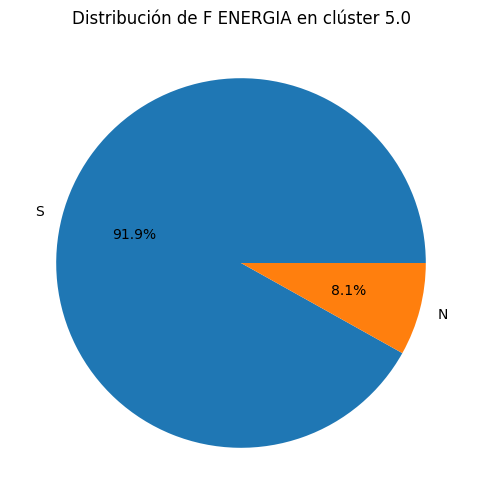

Cluster 0.0, Columna F ENERGIA, Número de datos: 2


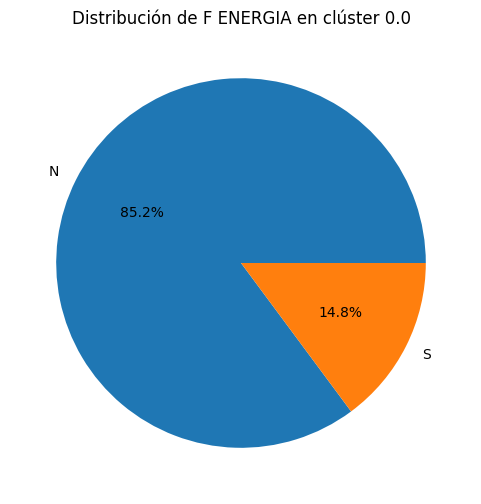

Cluster 1.0, Columna F ENERGIA, Número de datos: 2


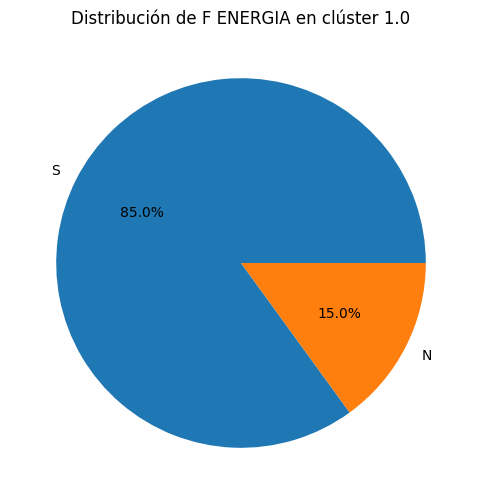

Cluster 8.0, Columna F ENERGIA, Número de datos: 2


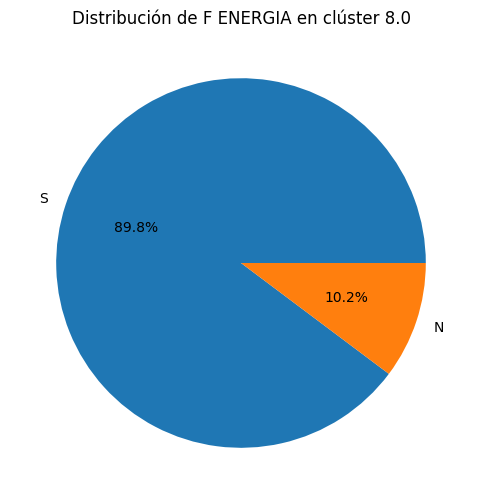

Cluster 2.0, Columna TEMBLOR, Número de datos: 2


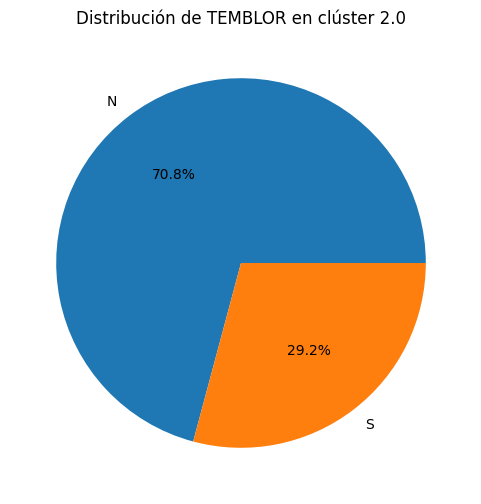

Cluster 6.0, Columna TEMBLOR, Número de datos: 2


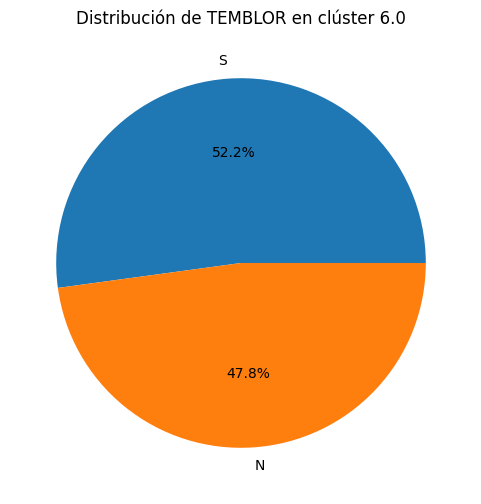

Cluster 7.0, Columna TEMBLOR, Número de datos: 2


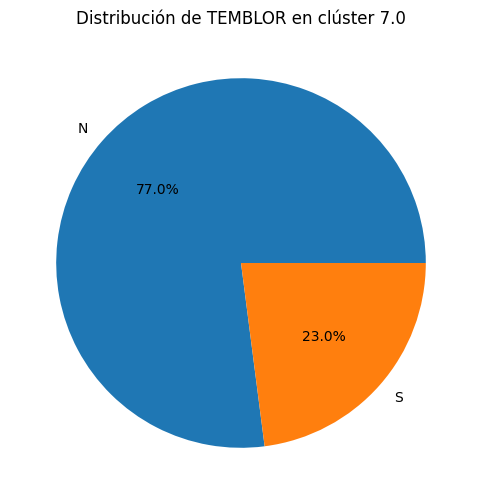

Cluster 4.0, Columna TEMBLOR, Número de datos: 2


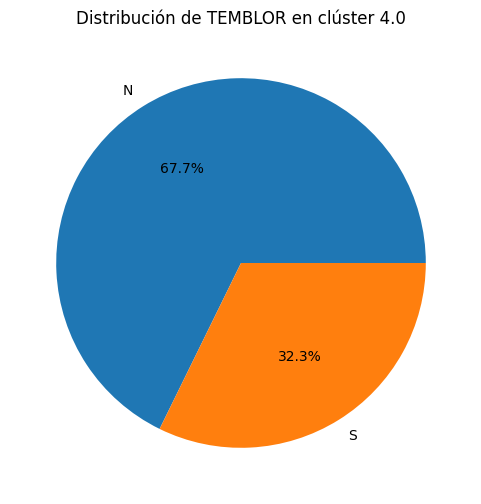

Cluster 3.0, Columna TEMBLOR, Número de datos: 2


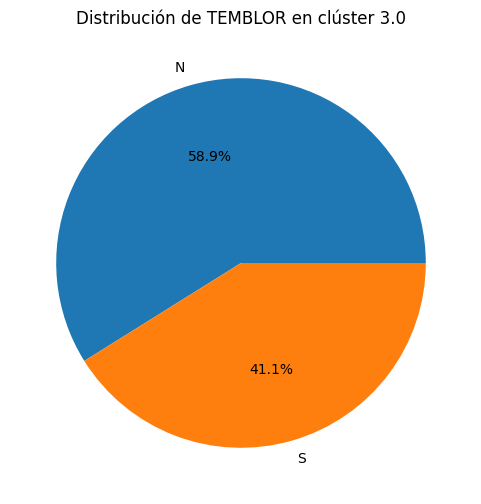

Cluster 5.0, Columna TEMBLOR, Número de datos: 2


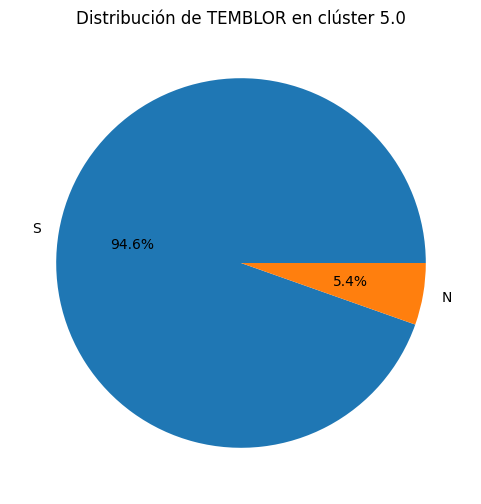

Cluster 0.0, Columna TEMBLOR, Número de datos: 2


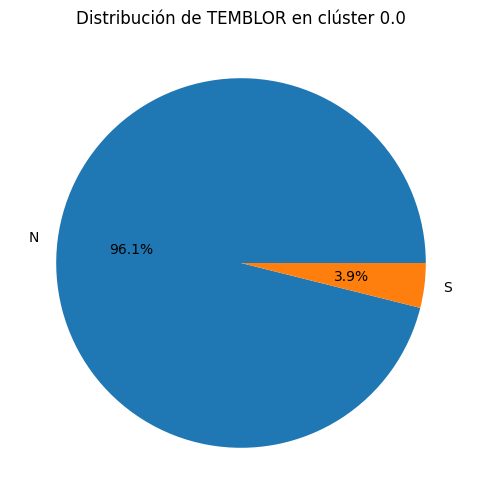

Cluster 1.0, Columna TEMBLOR, Número de datos: 2


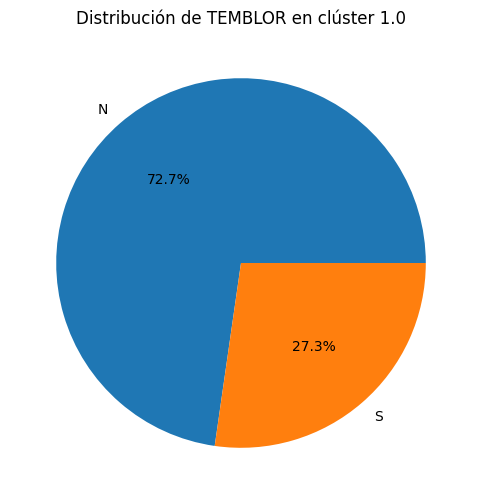

Cluster 8.0, Columna TEMBLOR, Número de datos: 2


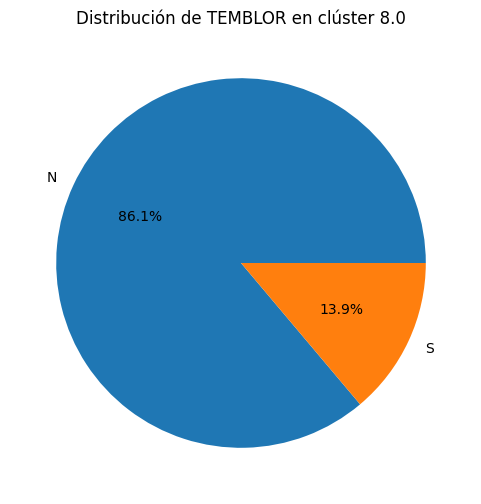

Cluster 2.0, Columna DIF NOMP, Número de datos: 2


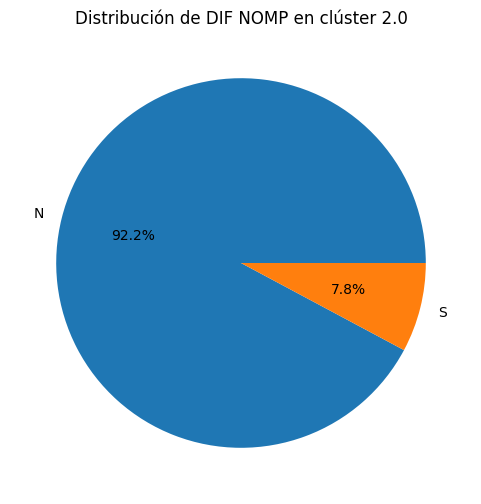

Cluster 6.0, Columna DIF NOMP, Número de datos: 2


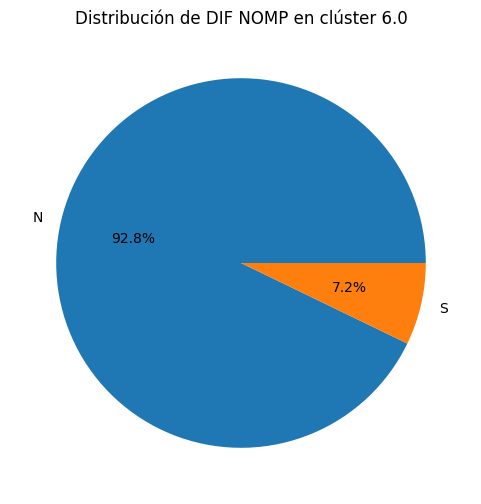

Cluster 7.0, Columna DIF NOMP, Número de datos: 2


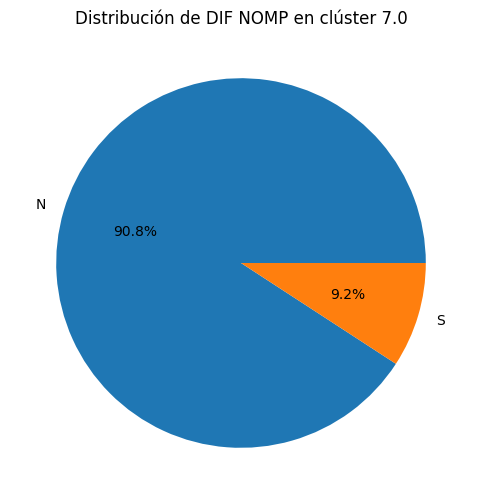

Cluster 4.0, Columna DIF NOMP, Número de datos: 2


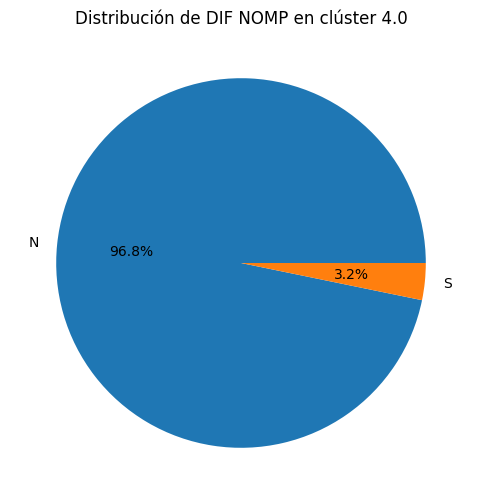

Cluster 3.0, Columna DIF NOMP, Número de datos: 2


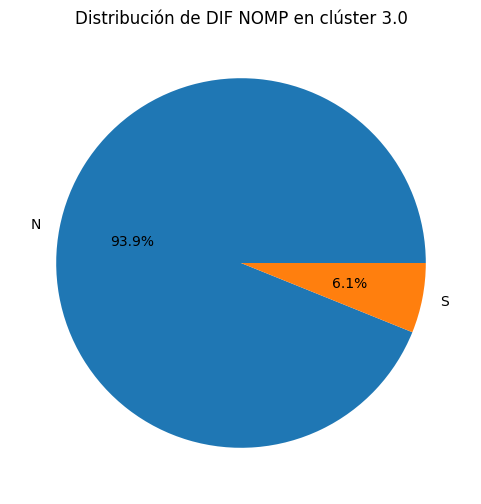

Cluster 5.0, Columna DIF NOMP, Número de datos: 2


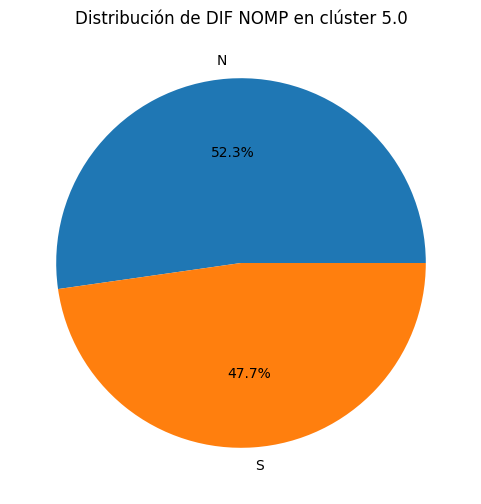

Cluster 0.0, Columna DIF NOMP, Número de datos: 2


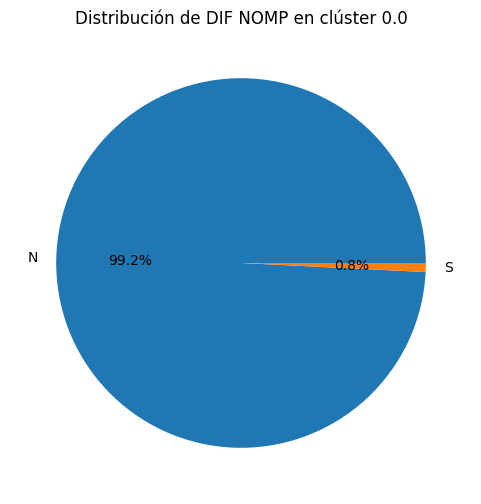

Cluster 1.0, Columna DIF NOMP, Número de datos: 2


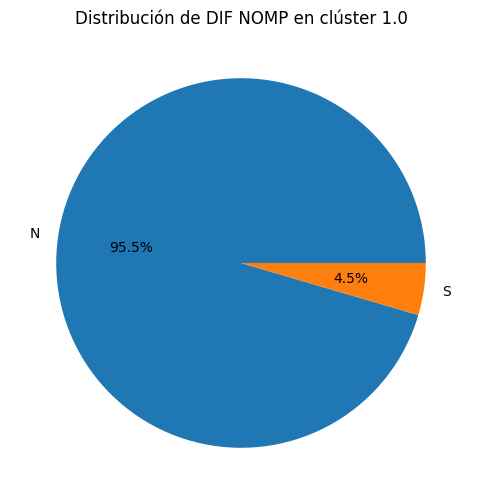

Cluster 8.0, Columna DIF NOMP, Número de datos: 2


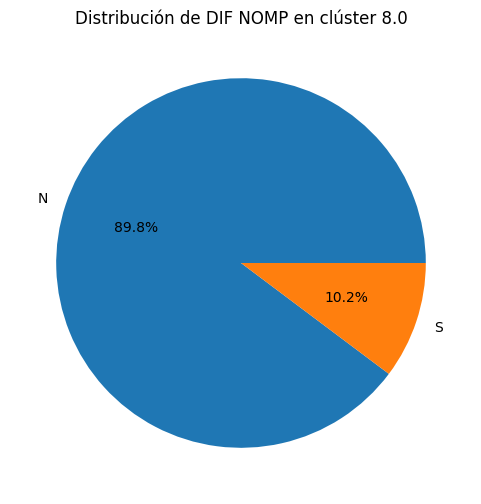

Cluster 2.0, Columna DEPRES, Número de datos: 2


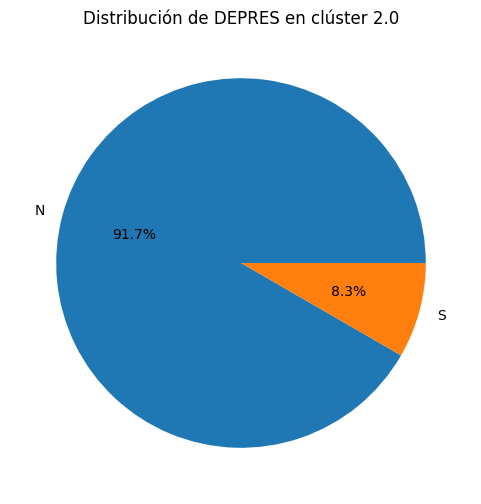

Cluster 6.0, Columna DEPRES, Número de datos: 2


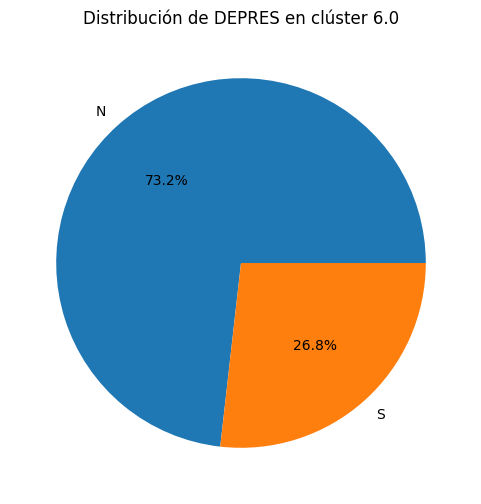

Cluster 7.0, Columna DEPRES, Número de datos: 2


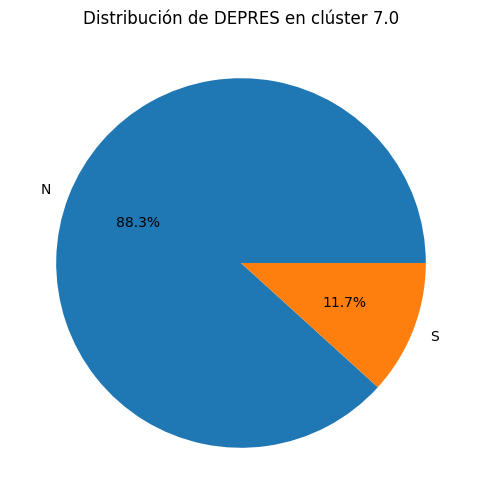

Cluster 4.0, Columna DEPRES, Número de datos: 2


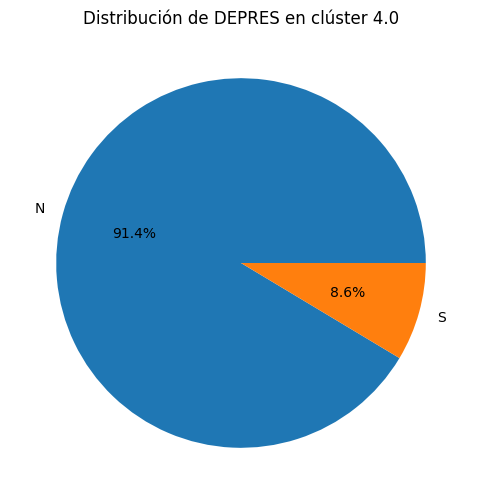

Cluster 3.0, Columna DEPRES, Número de datos: 2


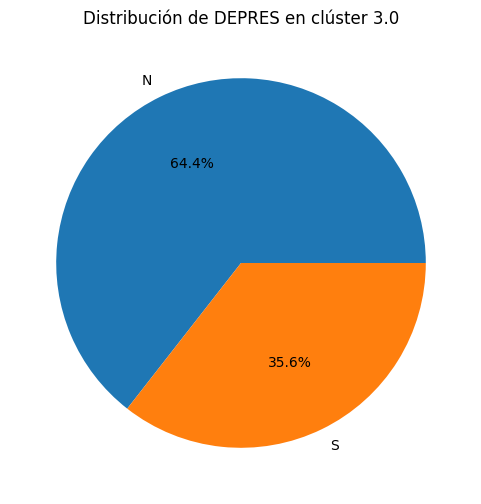

Cluster 5.0, Columna DEPRES, Número de datos: 2


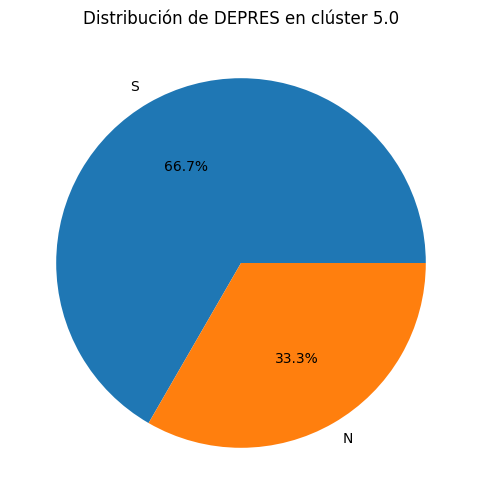

Cluster 0.0, Columna DEPRES, Número de datos: 2


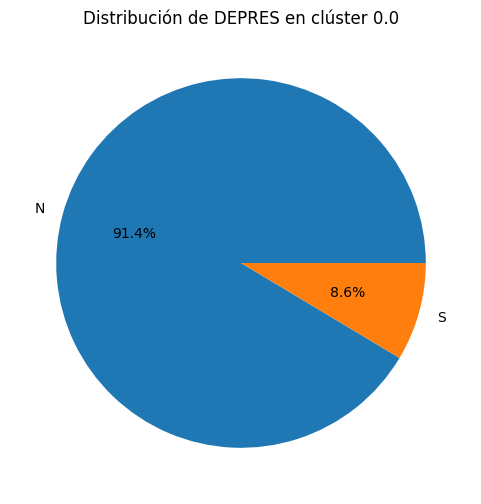

Cluster 1.0, Columna DEPRES, Número de datos: 2


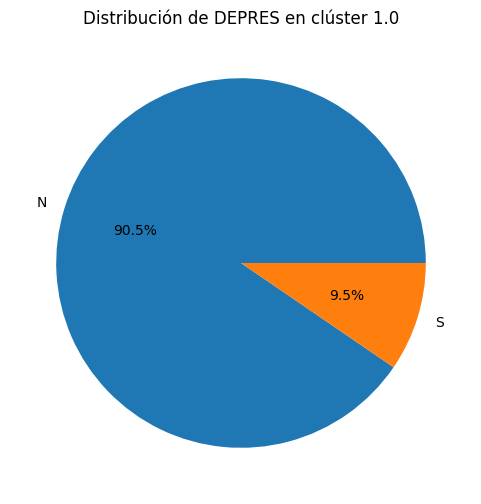

Cluster 8.0, Columna DEPRES, Número de datos: 2


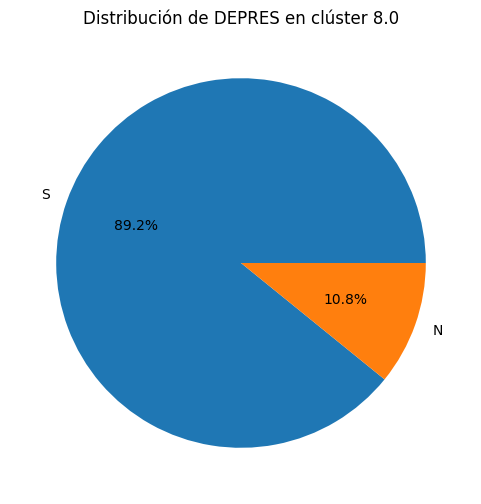

Cluster 2.0, Columna ANSIED, Número de datos: 2


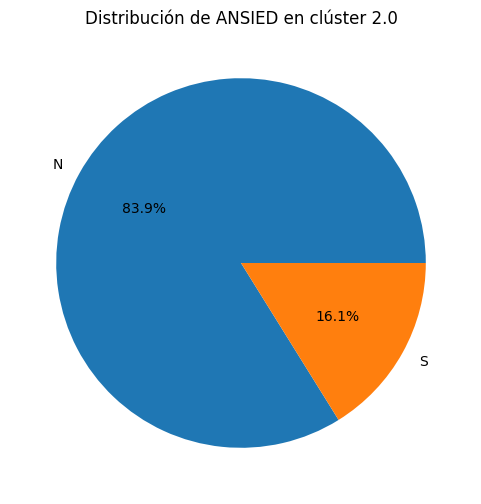

Cluster 6.0, Columna ANSIED, Número de datos: 2


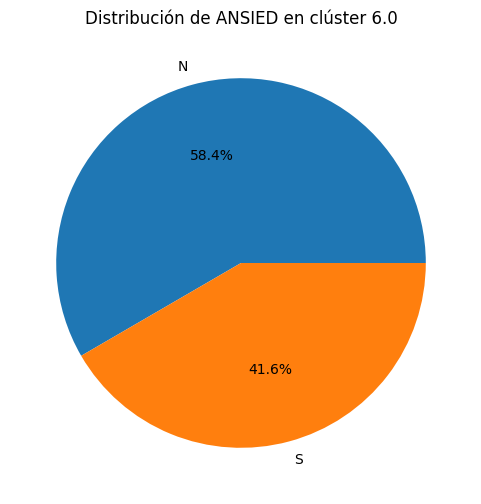

Cluster 7.0, Columna ANSIED, Número de datos: 2


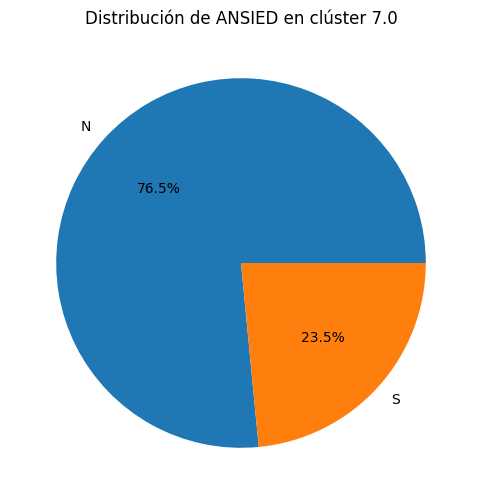

Cluster 4.0, Columna ANSIED, Número de datos: 2


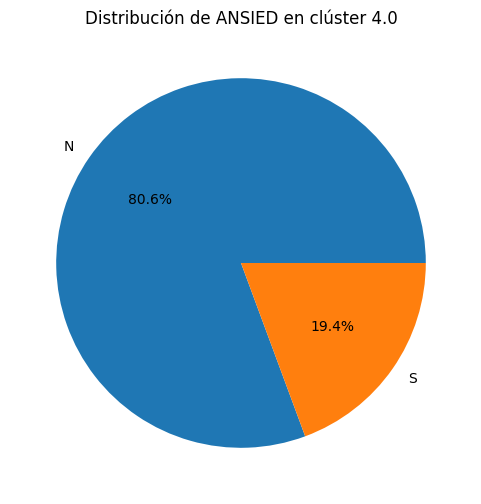

Cluster 3.0, Columna ANSIED, Número de datos: 2


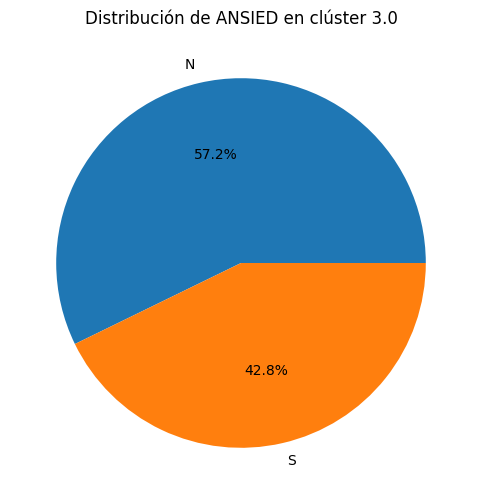

Cluster 5.0, Columna ANSIED, Número de datos: 2


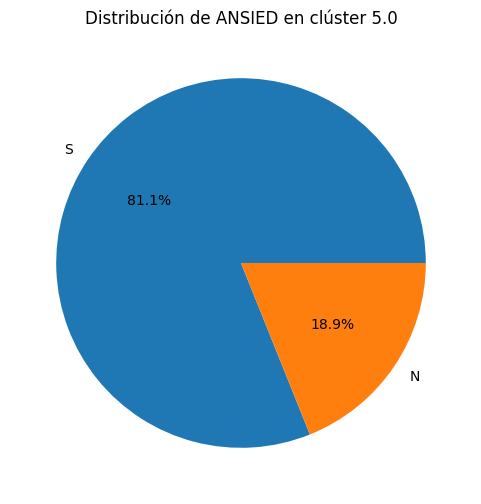

Cluster 0.0, Columna ANSIED, Número de datos: 2


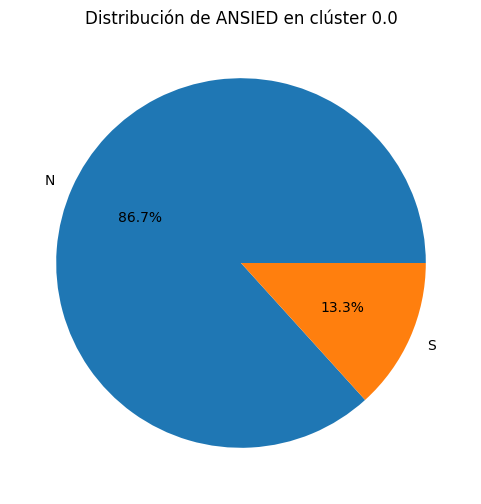

Cluster 1.0, Columna ANSIED, Número de datos: 2


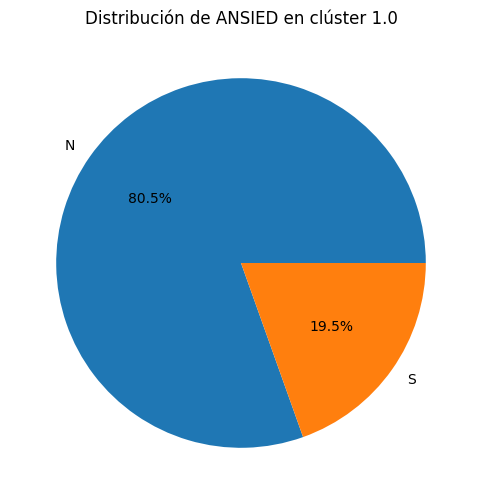

Cluster 8.0, Columna ANSIED, Número de datos: 2


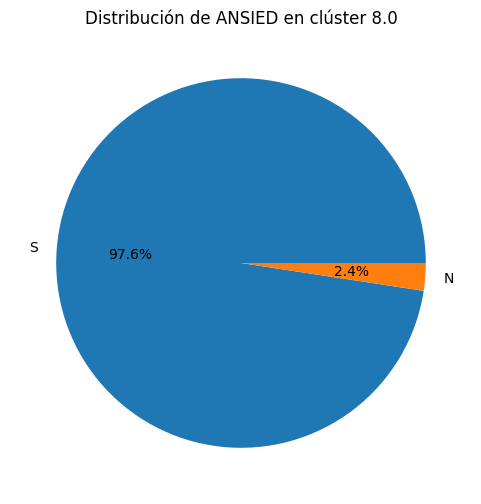

Cluster 2.0, Columna C FATIGA, Número de datos: 2


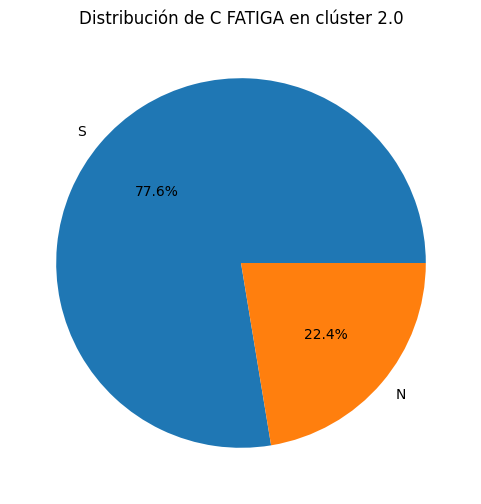

Cluster 6.0, Columna C FATIGA, Número de datos: 2


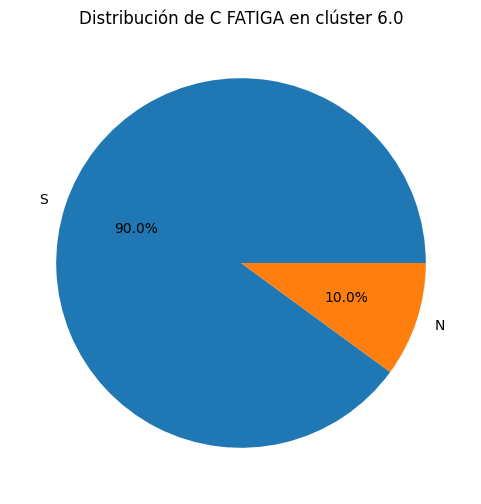

Cluster 7.0, Columna C FATIGA, Número de datos: 2


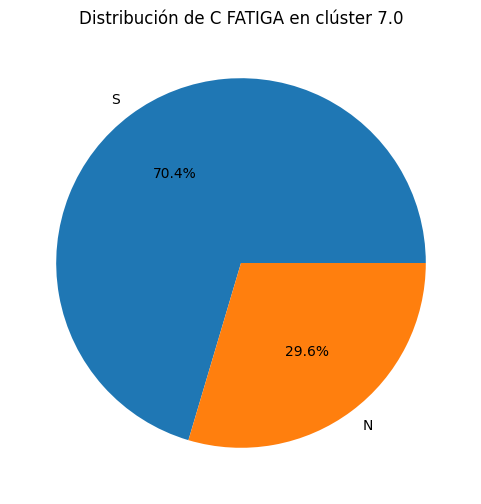

Cluster 4.0, Columna C FATIGA, Número de datos: 2


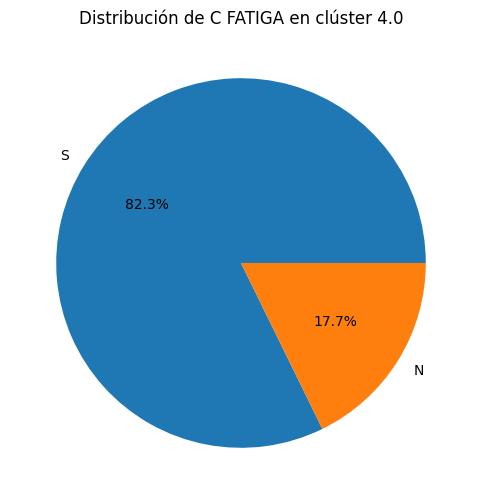

Cluster 3.0, Columna C FATIGA, Número de datos: 2


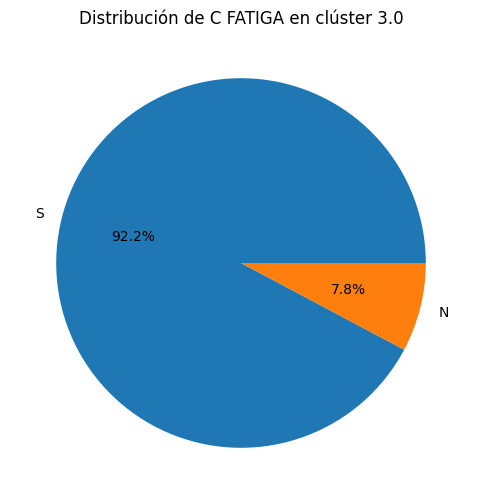

Cluster 5.0, Columna C FATIGA, Número de datos: 2


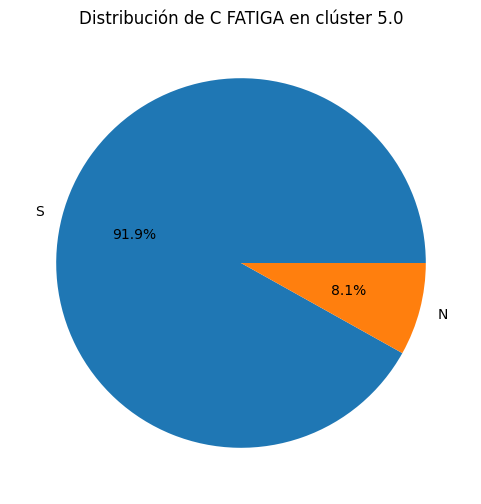

Cluster 0.0, Columna C FATIGA, Número de datos: 2


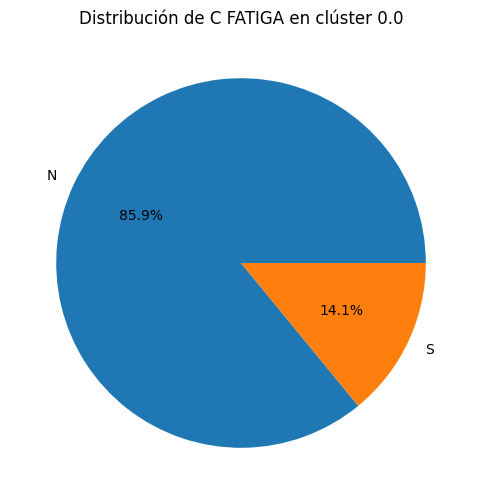

Cluster 1.0, Columna C FATIGA, Número de datos: 2


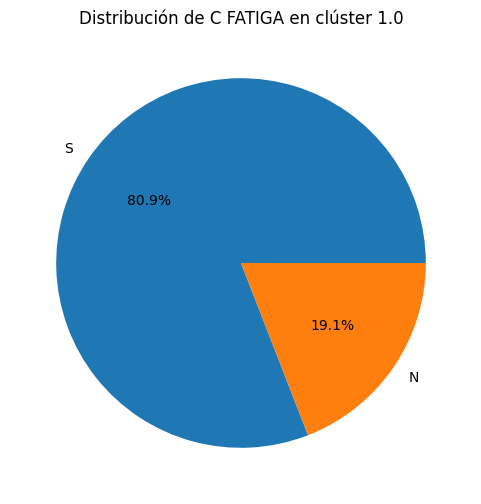

Cluster 8.0, Columna C FATIGA, Número de datos: 2


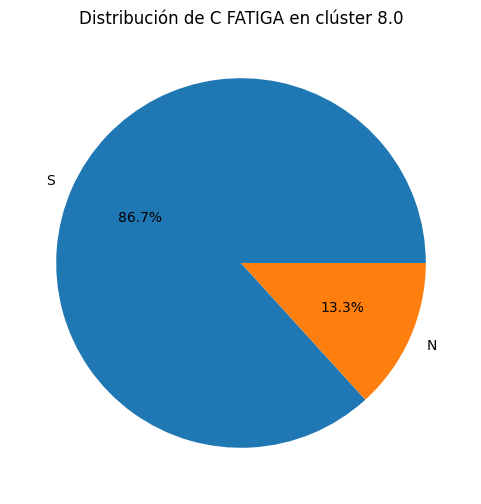

Cluster 2.0, Columna OLOR FAN, Número de datos: 2


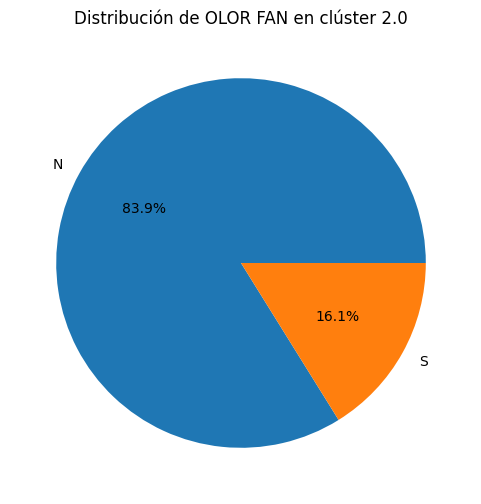

Cluster 6.0, Columna OLOR FAN, Número de datos: 2


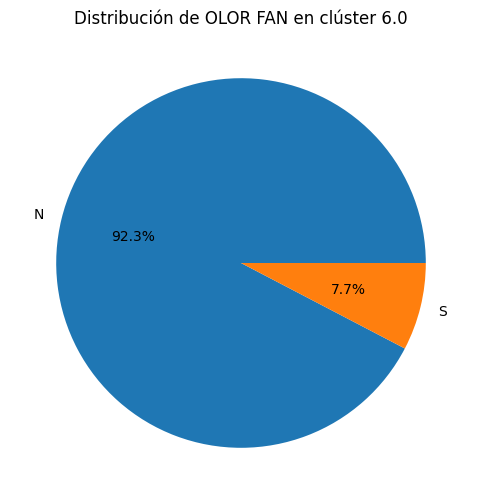

Cluster 7.0, Columna OLOR FAN, Número de datos: 2


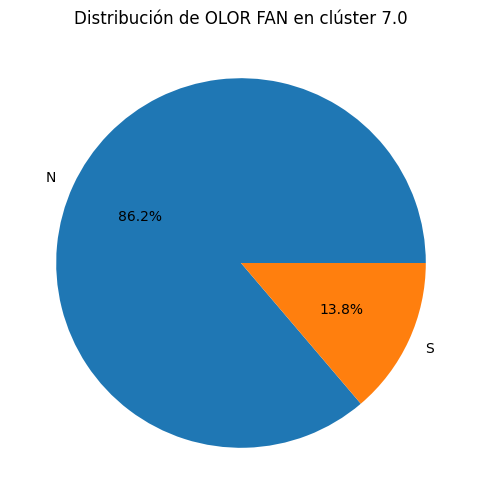

Cluster 4.0, Columna OLOR FAN, Número de datos: 2


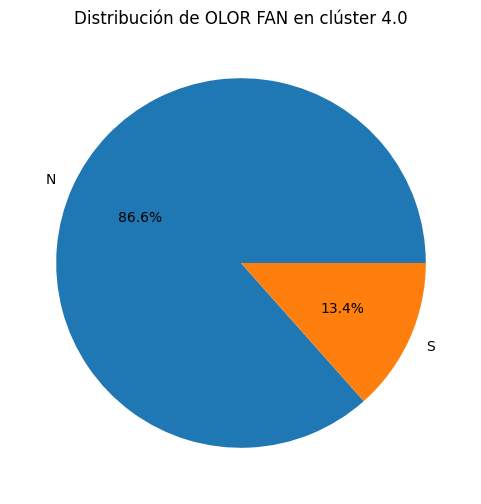

Cluster 3.0, Columna OLOR FAN, Número de datos: 2


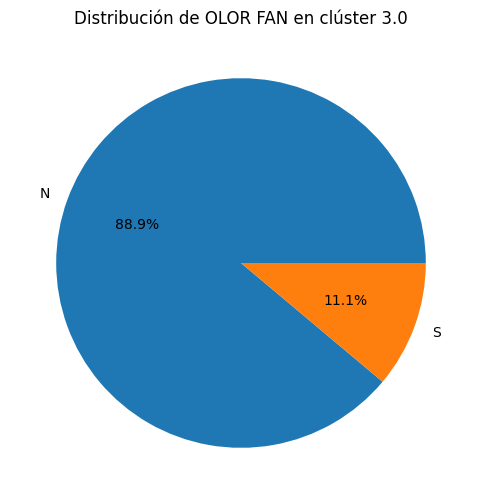

Cluster 5.0, Columna OLOR FAN, Número de datos: 2


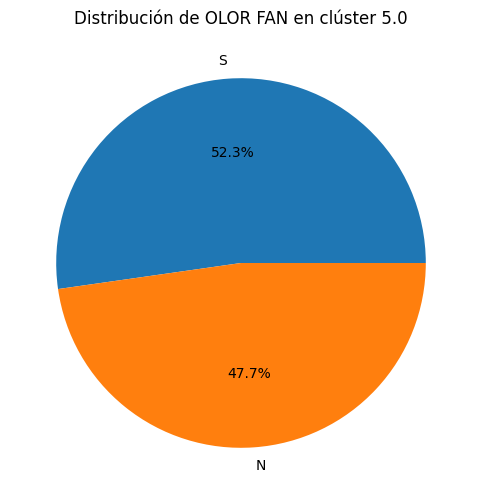

Cluster 0.0, Columna OLOR FAN, Número de datos: 2


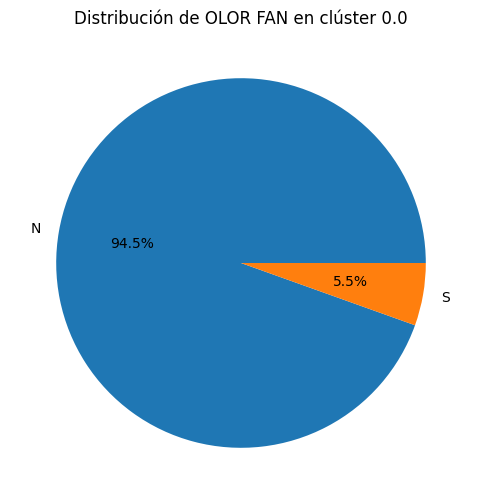

Cluster 1.0, Columna OLOR FAN, Número de datos: 2


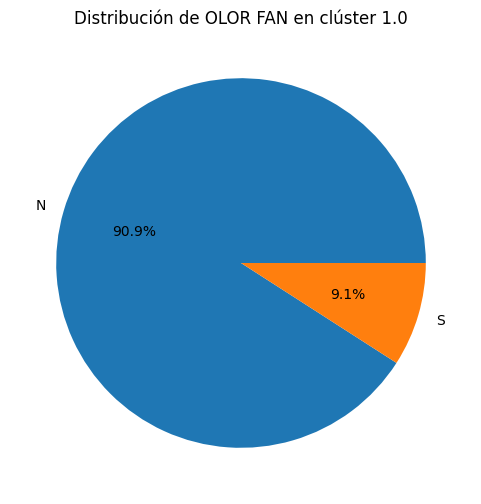

Cluster 8.0, Columna OLOR FAN, Número de datos: 2


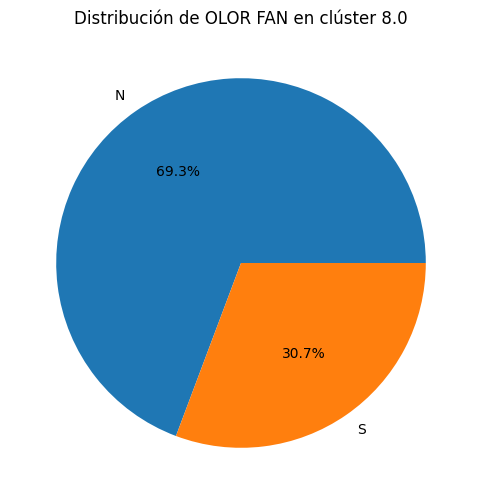

In [285]:
#=========================ANALISIS DESCRIPTIVO POR CADA CLIUSTER============
for columna in covid_before.columns:
    if columna != 'cluster':
        # Filtrar solo las primeras num_filas del DataFrame
        datos_filtrados = covid_before.iloc[:len(spectral_clustering_before.labels_)]

        for cluster in datos_filtrados['cluster'].unique():
            # Filtrar solo las filas donde 'cluster' no sea NA
            datos_cluster = datos_filtrados[datos_filtrados['cluster'] == cluster][columna].value_counts()

            # Mostrar cuántos datos hay en este clúster y columna
            print(f"Cluster {cluster}, Columna {columna}, Número de datos: {len(datos_cluster)}")

            if not datos_cluster.empty:
                plt.figure(figsize=(6, 6))
                plt.pie(datos_cluster, labels=datos_cluster.index, autopct='%1.1f%%')
                plt.title(f"Distribución de {columna} en clúster {cluster}")
                plt.show()
            else:
                print(f"No hay datos suficientes para la columna {columna} en el clúster {cluster}")

## ANALISIS DE GRAFO Para el SEGUNDO periodo (after)

In [286]:
# =============ANÁLISIS DE GRAFOS============
#estabelecer nivel de "tolerancia"
#Con la matriz de distancia ya es suficiente para crear el clsuter espcetral

import numpy as np
import networkx as nx
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import hamming
import matplotlib.pyplot as plt

# Considerar el segundo periodo
covid_after = covid.iloc[:, np.r_[0:7, 21:35]] #El data frame que considera el segundo periodo esta constituido por esas columnas

# Convertir cada fila en una cadena de caracteres concatenados
vector_caracteres_after = covid_after.apply(lambda x: ''.join(x.astype(str)), axis=1)  #Crea el vector donde cada elemento, es un vector de caracterres formados por las respuestas de cada individuo (fila)
#vector_caracteres_after = vector_caracteres_after[:700]  #Aqui le digo cuantas observaciones considerare                                     # Por ahora para practicar
print(vector_caracteres_after)
print(len(vector_caracteres_after))


0       3FRV3SMNSSSNNSNNSSSNN
1       2FSC3SMNNNNNNNNNNNNNN
2       3MPC3SLNNSNNNNNNNNNNN
3       1FTS3SMSNNNNNNNNNNNNN
4       1FSS5NMNNNNNNSNNNNNNN
                ...          
1596    2FRC3SMSNNNNNSNNSNSNN
1597    2FTC2SMNNNNNNNNNNNNNN
1598    2MGU4SLSSNSNNSSNNNSNN
1599    2FSU1SLNNNNNNNNNNNNNN
1600    1MRC2SMNNNNNNNNNNNNNN
Length: 1588, dtype: object
1588


In [287]:
import numpy as np
from scipy.spatial.distance import hamming


#================CREAR LA MATRIZ DE DISTANCIA HAMMING=====================
# Crear la matriz vacía
n = len(vector_caracteres_after)
similitud_matrix_after = np.zeros((n, n)) #Crea una matriz de dimension nxn, correspondiente a cada uno de los indivuos del vector de respuestas
disimilitud_matrix_after = np.zeros((n, n)) #Crea una matriz de SIMILITUF

similitud_entero_matrix_after= np.zeros((n,n)) #Crea una matriz de dimension nxn, donde se guardara la distancia hamming en valores entero para la similitud
disimilitud_entero_matrix_after= np.zeros((n,n)) #Crea una matriz de dimension nxn, donde se guardara la distancia hamming en valores entero para la disimilitud

# Llenar la matriz de distancias
for i in range(n):  #Por cada elemento del vector de respuestas
    for j in range(i + 1, n): #Toma un segundo elemento del vector de respuestas
        disimilitud_porcentual = hamming(list(vector_caracteres_after.iloc[i]), list(vector_caracteres_after.iloc[j]))  # Calcula la proporción directamente.
        similitud_porcentual= 1-disimilitud_porcentual #Se saca el complemento para que sea una matriz de similitud directamente

        #Convertirlo a valores enteros, debido a que scipy.distance, calcula una proporcion originalmente
        similitud_matrix_after[i, j] = similitud_porcentual #Lo guarda en la matriz de posicion i,j
        similitud_matrix_after[j, i] = similitud_porcentual #Lo guarda en la matriz de posicion j, i ya que es simetrica

        #Para la matriz de disimilutd el cual es necesario para el indice CCI (Cluster Cardinality Index)
        disimilitud_matrix_after[i, j] = disimilitud_porcentual #Lo guarda en la matriz de posicion i,j
        disimilitud_matrix_after[j, i] = disimilitud_porcentual

        #=============PARA VALORES ENTEROS=====================
        disimilitud_entero= disimilitud_porcentual*len(vector_caracteres_after.iloc[i])
        similitud_entero= 20-disimilitud_entero #Se saca el complemento para que sea una matriz de similitud directamente

        #Para la mtriz de disimilitud con valores enteros
        disimilitud_entero_matrix_after[i, j] = disimilitud_entero #Lo guarda en la matriz de posicion i,j
        disimilitud_entero_matrix_after[j, i] = disimilitud_entero


        #para la mtriz de similitud conv alores enteros
        similitud_entero_matrix_after[i, j] = similitud_entero #Lo guarda en la matriz de posicion i,j
        similitud_entero_matrix_after[j, i] = similitud_entero #Lo guarda en la matriz de posicion j, i ya que es simetrica


# Imprimir la matriz de distancias
print("Matriz de distancias:")
# Ajusta las opciones para mostrar todas las filas y columnas
np.set_printoptions(threshold=np.inf)

# Ahora imprime la matriz
print(similitud_matrix_after)



Se han truncado las últimas 5000 líneas del flujo de salida.
  0.61904762 0.66666667 0.66666667 0.71428571 0.71428571 0.61904762
  0.71428571 0.57142857 0.66666667 0.66666667 0.80952381 0.57142857
  0.66666667 0.61904762 0.61904762 0.57142857 0.66666667 0.57142857
  0.57142857 0.57142857 0.61904762 0.61904762 0.52380952 0.57142857
  0.71428571 0.66666667 0.52380952 0.80952381 0.57142857 0.80952381
  0.61904762 0.57142857 0.66666667 0.61904762 0.42857143 0.57142857
  0.66666667 0.52380952 0.61904762 0.71428571 0.52380952 0.66666667
  0.61904762 0.57142857 0.66666667 0.66666667 0.52380952 0.57142857
  0.66666667 0.76190476 0.61904762 0.71428571 0.80952381 0.66666667
  0.66666667 0.76190476 0.52380952 0.66666667 0.66666667 0.61904762
  0.57142857 0.71428571 0.61904762 0.76190476 0.61904762 0.57142857
  0.71428571 0.61904762 0.57142857 0.57142857 0.66666667 0.47619048
  0.71428571 0.52380952 0.71428571 0.61904762 0.71428571 0.61904762
  0.71428571 0.71428571 0.61904762 0.57142857 0.7142857

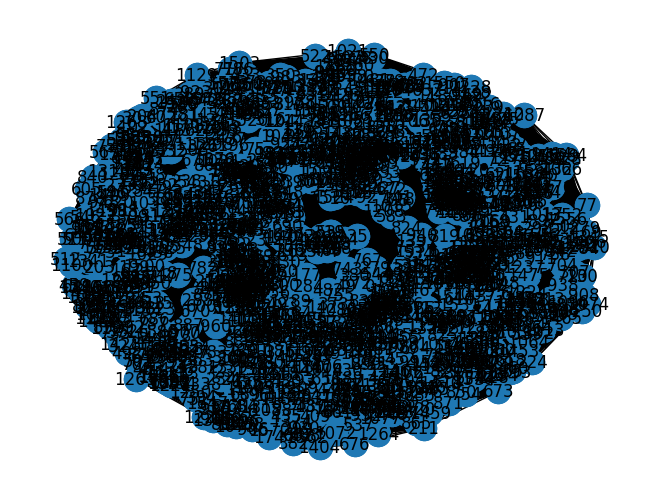

In [288]:
import networkx as nx
import matplotlib.pyplot as plt

# Crear un grafo a partir de la matriz de similitud
G = nx.from_numpy_array(disimilitud_matrix_after) #El grafo se llama G

# Calcular las posiciones de los nodos
pos = nx.spring_layout(G, seed=42)

# Dibujar el grafo
nx.draw(G, pos=pos) #Dibuja el grafo
nx.draw_networkx_nodes(G, pos=pos) #Dibuja los nodos (sin su etiqueta)
nx.draw_networkx_labels(G, pos=pos) #Dibuja los numeros correspondiente a los individuos (etiqueta)

# Dibujar las aristas con pesos (inncecesario)
#labels = nx.get_edge_attributes(G, 'weight')  # Obtener los pesos de las aristas
#nx.draw_networkx_edge_labels(G, pos)  # Dibujar las etiquetas de peso

plt.show()

## suavizamiento del criteior de disimilitud
# AQUI LE APLCIAMOS UNA TOLERNAICA DE DISIMILITUD, ES DECIR, SE CONECTARAN LOS VERTICE, CUYA DISIMILITUD SEA MENOR A 0.25, ES DECIR, QUE DIFIERAN EN A LO MAS EN 5 VARIABLES (CONSIDERANDOR QUE EL TOTAL DEL VARIABLES SON 20)

In [289]:
'''
#  Umbral de similitud
tolerancia = 0.25

# Crear un nuevo grafo con solo las aristas que superan el umbral
G_filtered = nx.Graph()
for i in range(n):
    for j in range(i + 1, n):
        if disimilitud_matrix_after[i, j] < tolerancia:
            G_filtered.add_edge(i, j, weight=disimilitud_matrix_after[i, j])

# Calcular las posiciones de los nodos para el grafo filtrado
pos_filtered = nx.spring_layout(G, seed=42)

# Dibujar el grafo filtrado
nx.draw(G_filtered, with_labels=True, pos=pos_filtered)
nx.draw_networkx_nodes(G_filtered, pos=pos_filtered)
nx.draw_networkx_labels(G_filtered, pos=pos_filtered)
'''

'\n#  Umbral de similitud\ntolerancia = 0.25\n\n# Crear un nuevo grafo con solo las aristas que superan el umbral\nG_filtered = nx.Graph()\nfor i in range(n):\n    for j in range(i + 1, n):\n        if disimilitud_matrix_after[i, j] < tolerancia:\n            G_filtered.add_edge(i, j, weight=disimilitud_matrix_after[i, j])\n\n# Calcular las posiciones de los nodos para el grafo filtrado\npos_filtered = nx.spring_layout(G, seed=42)\n\n# Dibujar el grafo filtrado\nnx.draw(G_filtered, with_labels=True, pos=pos_filtered)\nnx.draw_networkx_nodes(G_filtered, pos=pos_filtered)\nnx.draw_networkx_labels(G_filtered, pos=pos_filtered)\n'

##Creacion de CLUSTER SEGUNDO **periodo**

In [290]:
#====================CREACION DE CLUSTER=================
from sklearn.cluster import SpectralClustering
import matplotlib.pyplot as plt
import numpy as np

# Supongamos que 'D' es tu matriz de distancias de Hamming

# Convertimos la matriz de distancias en una matriz de afinidad (similaridad)
sigma = 1.0
disimilitud_gausiano_matrix_after = np.exp(-disimilitud_matrix_after**2 / (2. * sigma**2))

sc = SpectralClustering(n_clusters=2, affinity="precomputed", random_state=0)
spectral_clustering = sc.fit(disimilitud_entero_matrix_after)

print(spectral_clustering.labels_)

[0 0 0 1 1 0 1 0 0 1 0 0 0 0 1 1 1 0 0 0 0 0 1 0 1 0 1 0 0 1 1 0 1 0 1 0 1
 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 1 1 0 1 1 1 0 1 0 1 0 1 0 0
 0 1 1 1 1 1 1 1 1 0 1 1 0 1 0 0 1 0 1 0 1 1 0 1 0 1 0 1 0 0 1 0 0 0 1 0 1
 0 0 1 0 1 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 0 1 0
 0 0 1 0 1 0 1 0 0 0 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 1 0 1 1 0 0 1 1 0 0 1 0
 0 0 0 0 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0
 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 0 1 1 1 1 0 0 0 0 1 0 0 0
 1 1 1 1 0 0 0 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 1 1 1 0 1 1 0 1 1 0 1 1 1
 1 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 0 0 1 1 1 0 1
 0 0 0 1 1 0 1 1 1 1 1 0 1 0 1 1 0 0 1 1 0 0 0 1 1 1 0 1 0 0 1 0 1 0 1 0 0
 0 1 0 0 1 1 0 0 1 0 0 1 0 0 0 0 0 1 0 1 1 1 1 0 1 0 1 1 1 1 1 0 1 0 0 1 1
 1 0 1 1 1 1 1 1 1 1 1 1 0 0 0 1 1 0 1 0 1 0 1 1 0 1 0 0 1 1 1 0 1 1 0 0 1
 1 1 0 0 0 0 1 0 1 1 0 1 0 1 0 0 1 1 1 0 1 1 1 1 0 1 1 0 0 0 0 0 0 0 0 1 1
 1 1 1 1 0 1 0 0 0 1 0 0 

## Probando distinta cantidad de cluster y evluando indices (after)

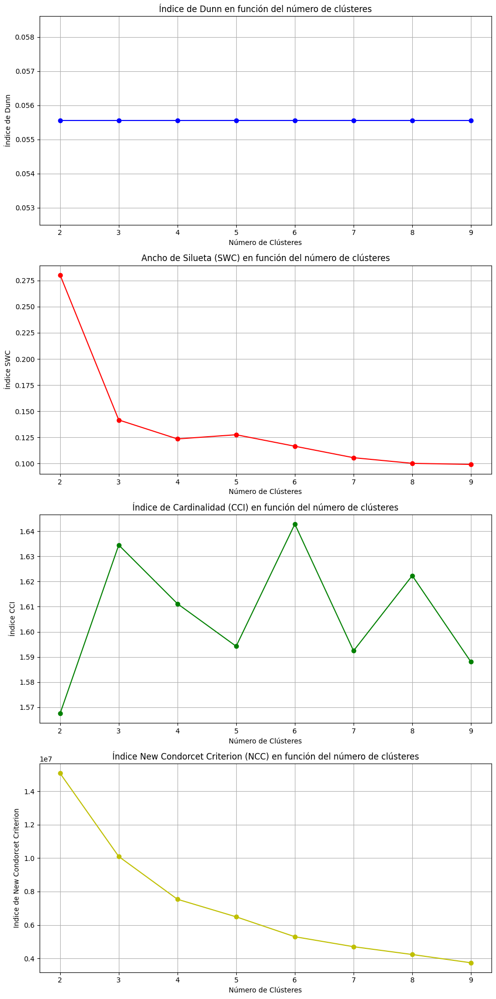

Número de Clústeres,2,3,4,5,6,7,8,9
Dunn,5.555556e-02,5.555556e-02,5.555556e-02,5.555556e-02,5.555556e-02,5.555556e-02,5.555556e-02,5.555556e-02
SWC,2.804393e-01,1.415960e-01,1.234568e-01,1.274599e-01,1.164567e-01,1.054821e-01,1.000871e-01,9.905462e-02
CCI,1.567484e+00,1.634496e+00,1.611165e+00,1.594255e+00,1.642830e+00,1.592437e+00,1.622335e+00,1.588038e+00
NCC,1.507550e+07,1.009629e+07,7.539442e+06,6.489347e+06,5.299143e+06,4.703085e+06,4.235295e+06,3.741016e+06


In [291]:
import matplotlib.pyplot as plt #Se importa la libreria matplotlib

#=====================PROBANDO LOS INDICES CON DISTINTOS NUMEROS DE CLSUTER=================
#Listas vacias para guardar el valor de los indices
dunn_values = [] #Lista de indice Dunn
silhouette_values = [] # Nueva lista para guardar los valores de silueta
cci_values = [] #Lista de indice CCI
ncc_values = [] #Lista de indice NCC
clusters = []


# Crear la figura y las subgráficas antes del bucle
fig, axs = plt.subplots(4, 1, figsize=(10, 20)) #Aqui se crea 'axs' para los subplots

#Aqui buscamos el numero optimo de cluster en base a los indices Dunn, Silhouette width crriterion (SWC), Cluster cardinality Index (CCI), New Condorcet Criterion (NCC)
for i in range(2, 10):
  sc_after = SpectralClustering(n_clusters=i, affinity="precomputed", random_state=0)
  spectral_clustering_after = sc_after.fit(disimilitud_gausiano_matrix_after)

  labels = spectral_clustering_after.labels_


  #Calcular el índice Dunn CON LA FUNCION CREADA PREVIAMNETE
  dunn_value = dunn_index(disimilitud_matrix_after, labels)
  dunn_values.append(dunn_value)
  clusters.append(i)

  # Calcular el ancho de silueta CON LIBRERIA
  silhouette_value= silhouette_score(disimilitud_matrix_after, labels, metric="precomputed") #Aqui utilizamos libreria
  silhouette_values.append(silhouette_value)

  #Calcular el indice cardinalidad CCI
  cci_value = cluster_cardinality_index(disimilitud_matrix_after,labels)
  cci_values.append(cci_value)

  #Calcular el indice NCC
  ncc_value = new_condorcet_criterion(disimilitud_matrix_after,labels)
  ncc_values.append(ncc_value)


# Graficar el índice de Dunn (DUNN)
axs[0].plot(clusters, dunn_values, marker='o', linestyle='-', color='b')
axs[0].set_title('Índice de Dunn en función del número de clústeres')
axs[0].set_xlabel('Número de Clústeres')
axs[0].set_ylabel('Índice de Dunn')
axs[0].set_xticks(clusters)
axs[0].grid()

# Graficar (SWC)
axs[1].plot(clusters, silhouette_values, marker='o', linestyle='-', color='r')
axs[1].set_title('Ancho de Silueta (SWC) en función del número de clústeres')
axs[1].set_xlabel('Número de Clústeres')
axs[1].set_ylabel('Índice SWC')
axs[1].set_xticks(clusters)
axs[1].grid()

# Graficar la (CCI)
axs[2].plot(clusters, cci_values, marker='o', linestyle='-', color='g')
axs[2].set_title('Índice de Cardinalidad (CCI) en función del número de clústeres')
axs[2].set_xlabel('Número de Clústeres')
axs[2].set_ylabel('Índice CCI')
axs[2].set_xticks(clusters)
axs[2].grid()

#Gracficar (NCC)
axs[3].plot(clusters, ncc_values, marker='o', linestyle='-', color='y')
axs[3].set_title('Índice New Condorcet Criterion (NCC) en función del número de clústeres')
axs[3].set_xlabel('Número de Clústeres')
axs[3].set_ylabel('Indice de New Condorcet Criterion')
axs[3].set_xticks(clusters)
axs[3].grid()

# Ajustar el espacio entre las subgráficas
plt.tight_layout()
plt.show()


# Crear un DataFrame con los resultados
tabla_indices = pd.DataFrame({
    'Número de Clústeres': clusters,
    'Dunn': dunn_values,
    'SWC': silhouette_values,
    'CCI': cci_values,
    'NCC': ncc_values
}).set_index('Número de Clústeres').T

display(tabla_indices)

In [292]:
import numpy as np

# Imprimir la cantidad total de observaciones
print("Total de observaciones en 'covid_before':", len(covid_after))
print("Total de etiquetas en 'spectral_clustering_before.labels_':", len(spectral_clustering_after.labels_))

# Contar la cantidad de observaciones en cada clúster
conteo_clusters = np.bincount(spectral_clustering_after.labels_)

# Imprimir el conteo por clúster
for cluster_id, count in enumerate(conteo_clusters):
    print(f"Clúster {cluster_id}: {count} observaciones")

Total de observaciones en 'covid_before': 1588
Total de etiquetas en 'spectral_clustering_before.labels_': 1588
Clúster 0: 102 observaciones
Clúster 1: 220 observaciones
Clúster 2: 204 observaciones
Clúster 3: 159 observaciones
Clúster 4: 252 observaciones
Clúster 5: 167 observaciones
Clúster 6: 201 observaciones
Clúster 7: 189 observaciones
Clúster 8: 94 observaciones


In [293]:
#=======================CARACTERIZAR CADA CLUSTER=============================
#Agrego la columan "CLUSTER" SOLO A LAS OBSERVACIUONES QUE SELECCIONE
covid_after = covid_after.reset_index(drop=True)
covid_after.loc[:len(spectral_clustering_after.labels_)+1, 'cluster'] = spectral_clustering_after.labels_
#Visualizamos la tabla con los cluster asignados
covid_after.head(len(spectral_clustering_before.labels_))




,edad,Gen,educa,estcivil,estrato,EstVac-19,Sintcovid-19,DOLOR C_2,PT OLFATO_2,PP OLFATO_2,...,DESORIENTA_2,F ENERGIA_2,TEMBLOR_2,DIF NOMP_2,DEPRES_2,ANSIED_2,C FATIGA_2,OLOR FAN_2,VERTIGO_2,cluster
0,3,F,R,V,3,S,M,N,S,S,...,N,S,N,N,S,S,S,N,N,0.0
1,2,F,S,C,3,S,M,N,N,N,...,N,N,N,N,N,N,N,N,N,4.0
2,3,M,P,C,3,S,L,N,N,S,...,N,N,N,N,N,N,N,N,N,7.0
3,1,F,T,S,3,S,M,S,N,N,...,N,N,N,N,N,N,N,N,N,3.0
4,1,F,S,S,5,N,M,N,N,N,...,N,S,N,N,N,N,N,N,N,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1583,2,F,R,C,3,S,M,S,N,N,...,N,S,N,N,S,N,S,N,N,2.0
1584,2,F,T,C,2,S,M,N,N,N,...,N,N,N,N,N,N,N,N,N,4.0
1585,2,M,G,U,4,S,L,S,S,N,...,N,S,S,N,N,N,S,N,N,6.0
1586,2,F,S,U,1,S,L,N,N,N,...,N,N,N,N,N,N,N,N,N,1.0


Cluster 0.0, Columna edad, Número de datos: 3


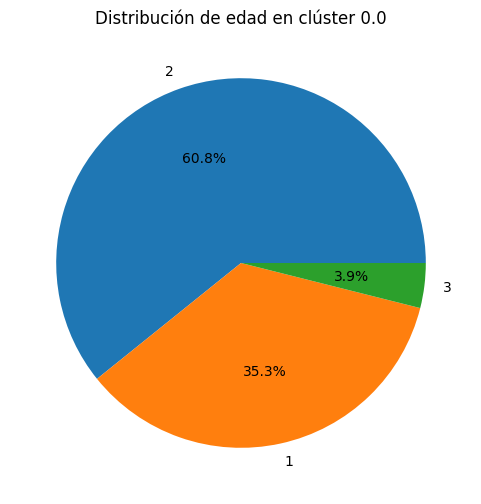

Cluster 4.0, Columna edad, Número de datos: 3


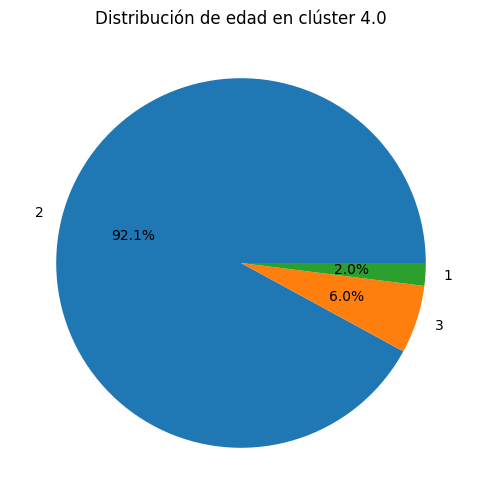

Cluster 7.0, Columna edad, Número de datos: 3


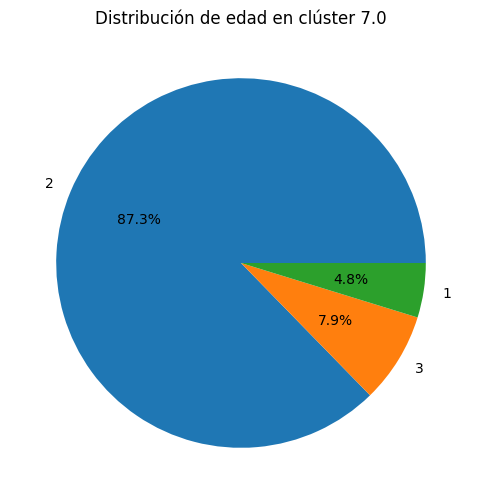

Cluster 3.0, Columna edad, Número de datos: 3


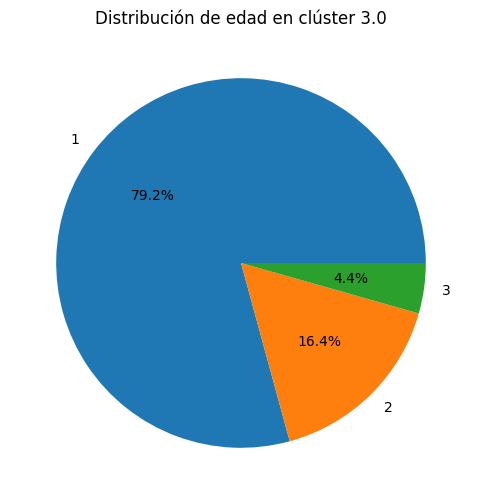

Cluster 8.0, Columna edad, Número de datos: 3


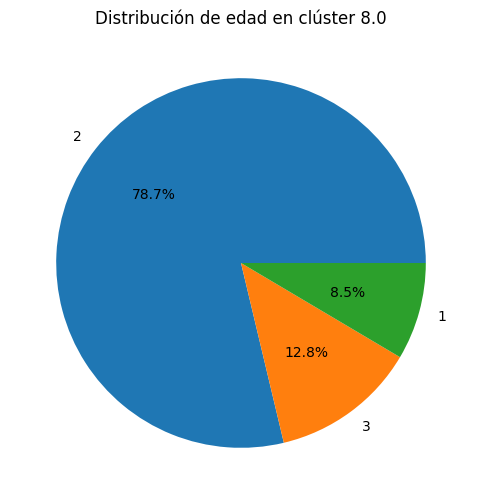

Cluster 6.0, Columna edad, Número de datos: 3


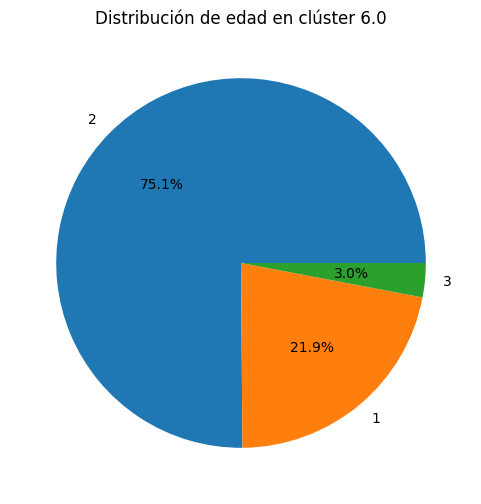

Cluster 2.0, Columna edad, Número de datos: 3


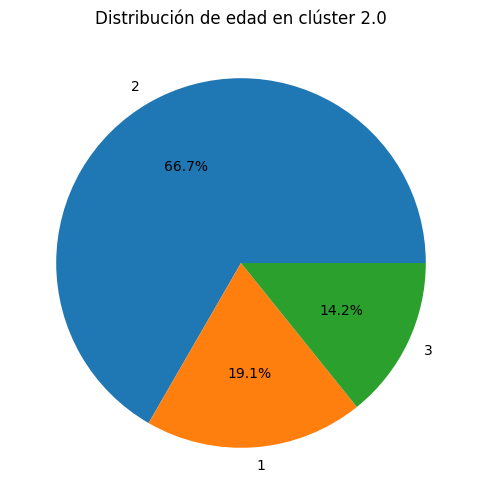

Cluster 5.0, Columna edad, Número de datos: 3


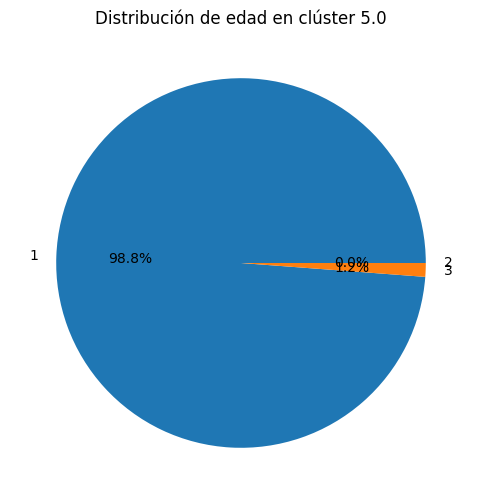

Cluster 1.0, Columna edad, Número de datos: 3


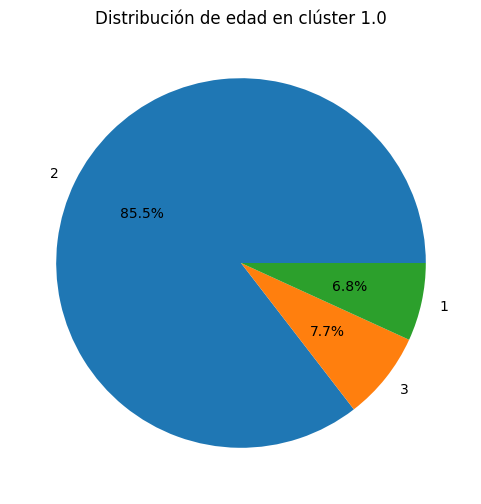

Cluster 0.0, Columna Gen, Número de datos: 2


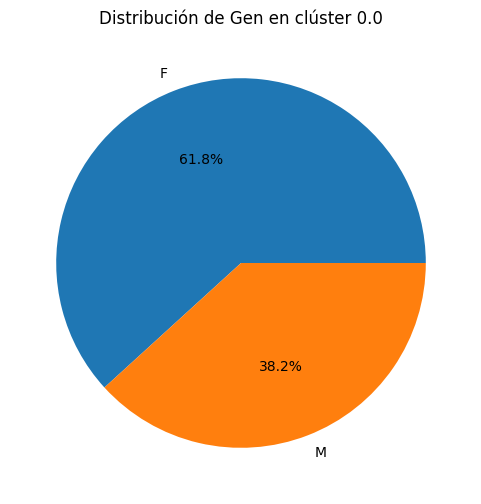

Cluster 4.0, Columna Gen, Número de datos: 2


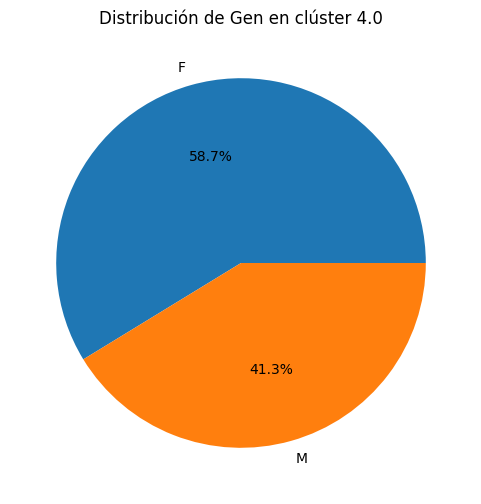

Cluster 7.0, Columna Gen, Número de datos: 1


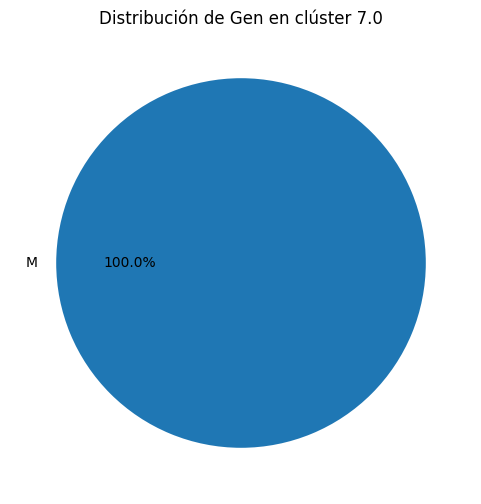

Cluster 3.0, Columna Gen, Número de datos: 2


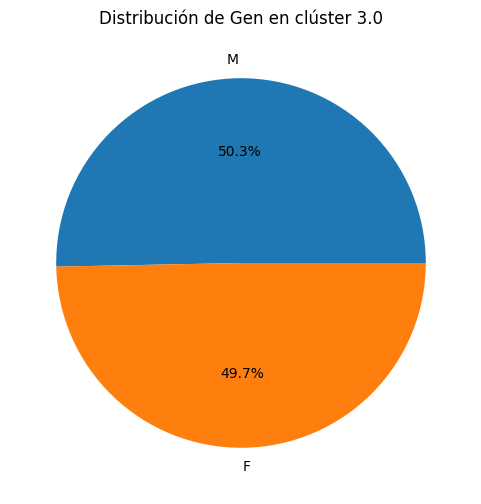

Cluster 8.0, Columna Gen, Número de datos: 2


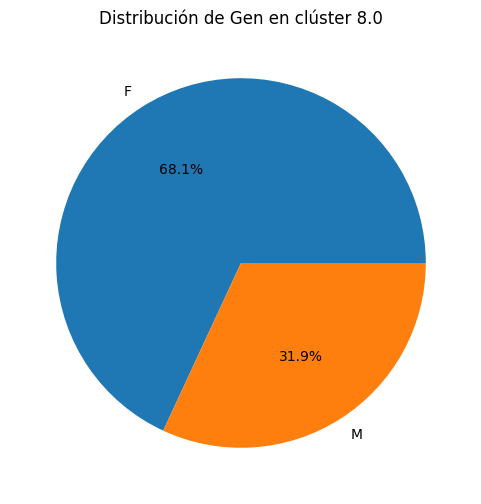

Cluster 6.0, Columna Gen, Número de datos: 2


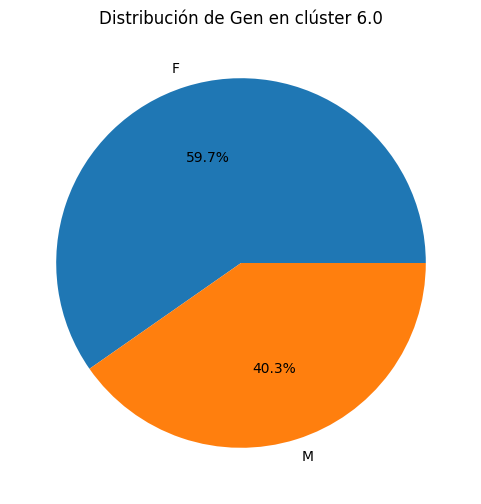

Cluster 2.0, Columna Gen, Número de datos: 2


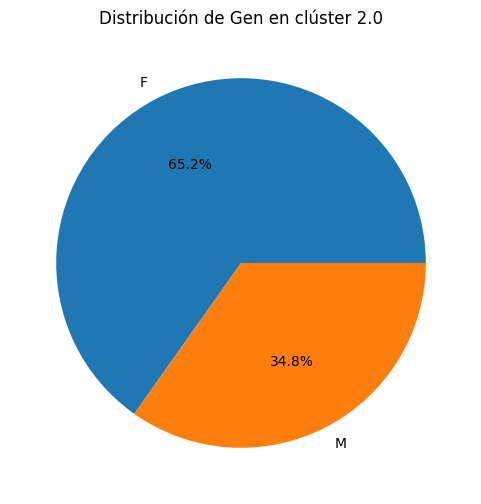

Cluster 5.0, Columna Gen, Número de datos: 2


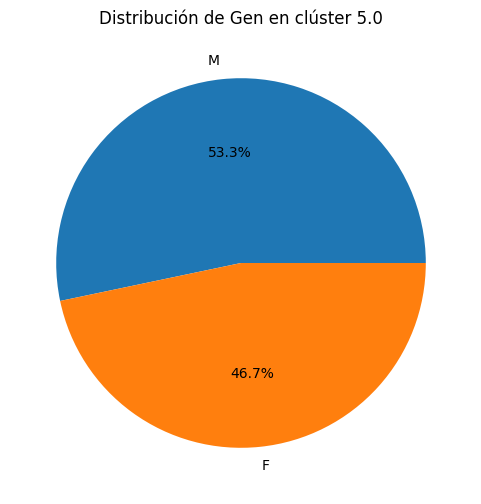

Cluster 1.0, Columna Gen, Número de datos: 1


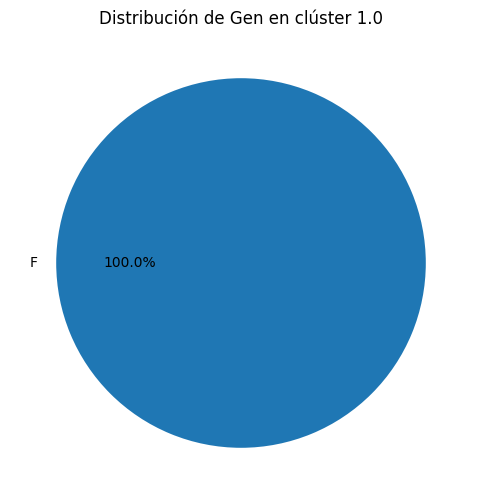

Cluster 0.0, Columna educa, Número de datos: 5


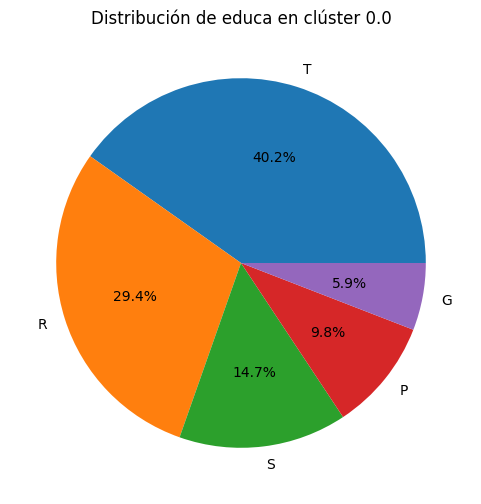

Cluster 4.0, Columna educa, Número de datos: 5


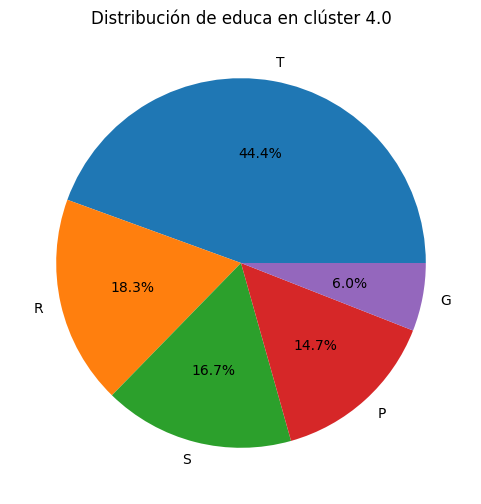

Cluster 7.0, Columna educa, Número de datos: 5


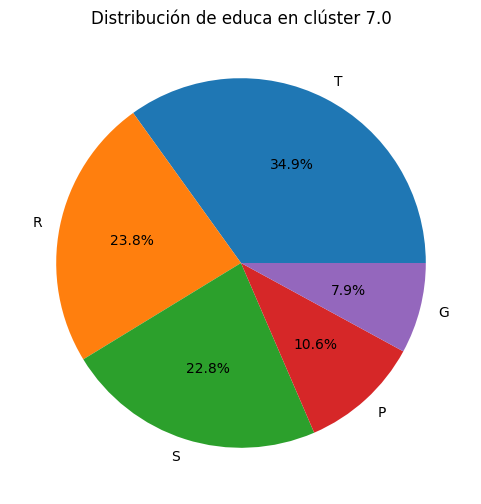

Cluster 3.0, Columna educa, Número de datos: 5


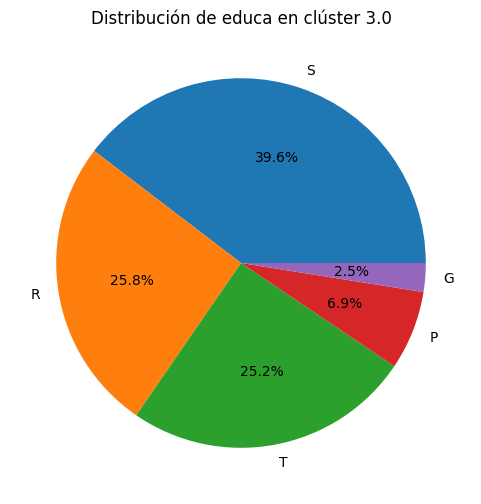

Cluster 8.0, Columna educa, Número de datos: 5


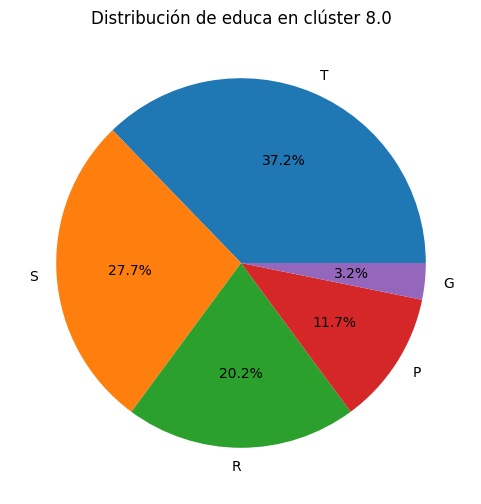

Cluster 6.0, Columna educa, Número de datos: 5


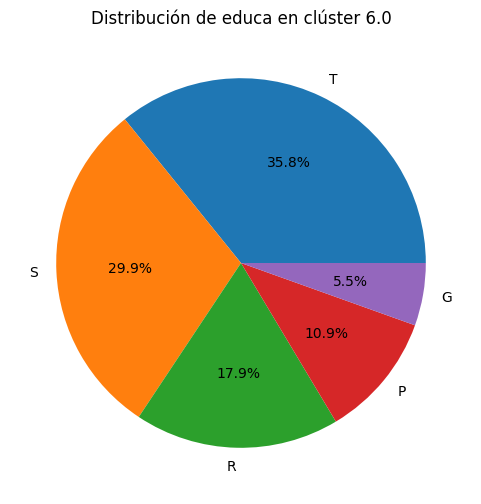

Cluster 2.0, Columna educa, Número de datos: 5


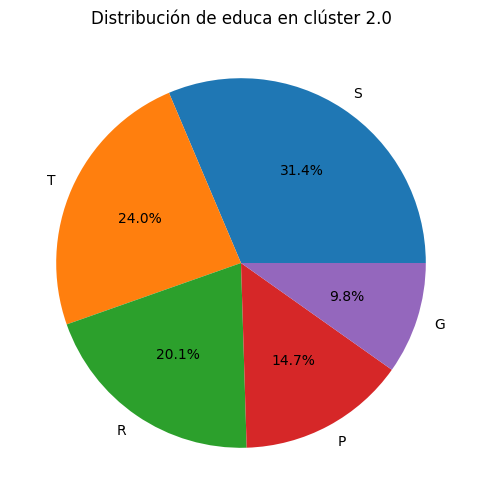

Cluster 5.0, Columna educa, Número de datos: 5


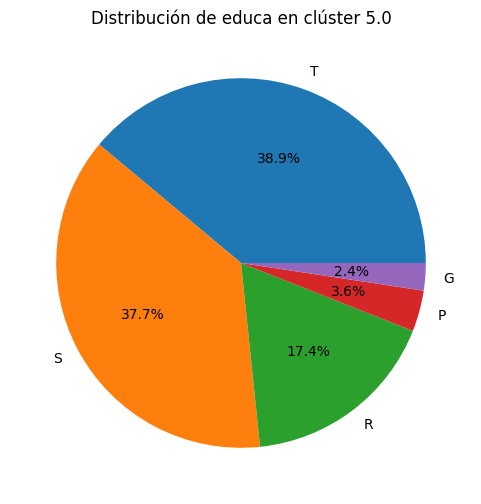

Cluster 1.0, Columna educa, Número de datos: 5


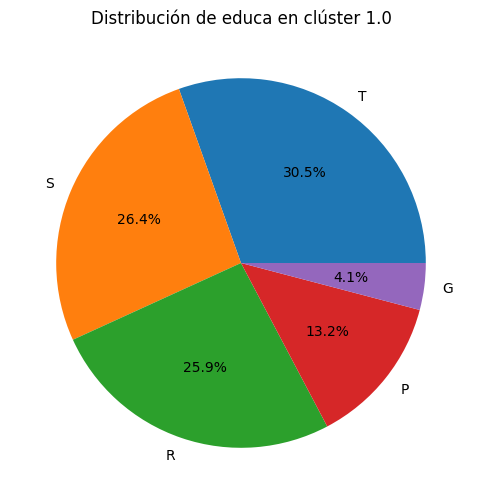

Cluster 0.0, Columna estcivil, Número de datos: 5


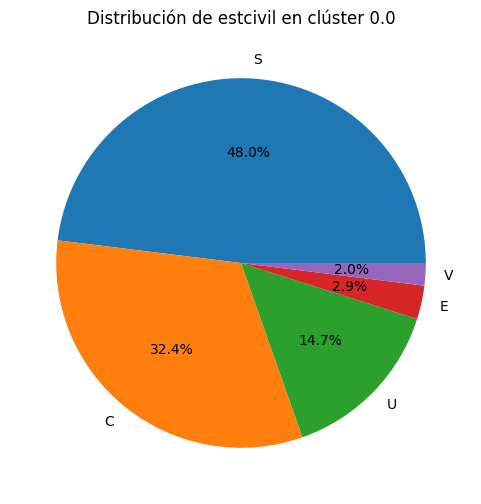

Cluster 4.0, Columna estcivil, Número de datos: 6


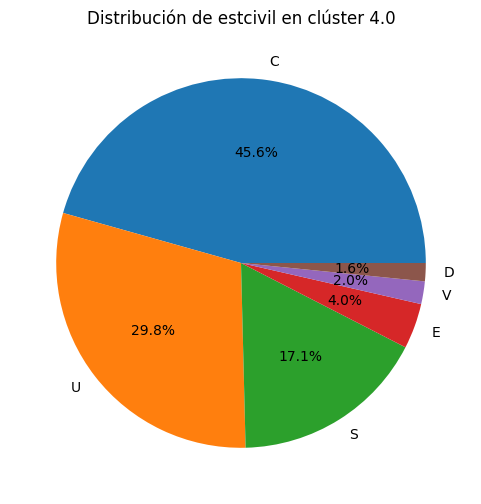

Cluster 7.0, Columna estcivil, Número de datos: 6


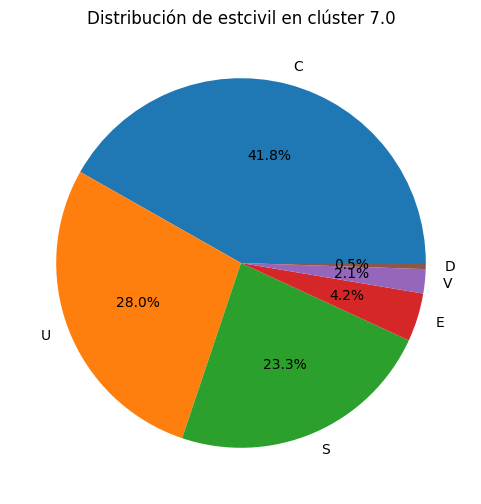

Cluster 3.0, Columna estcivil, Número de datos: 6


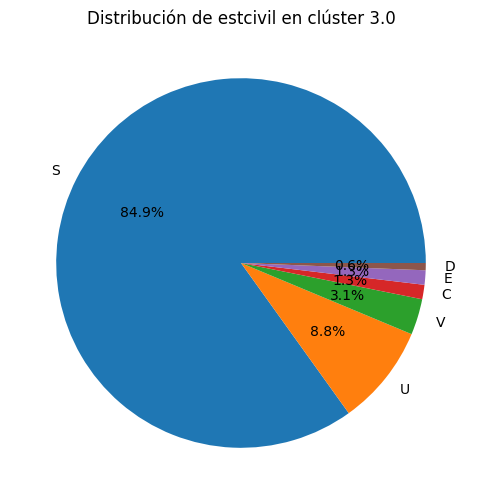

Cluster 8.0, Columna estcivil, Número de datos: 6


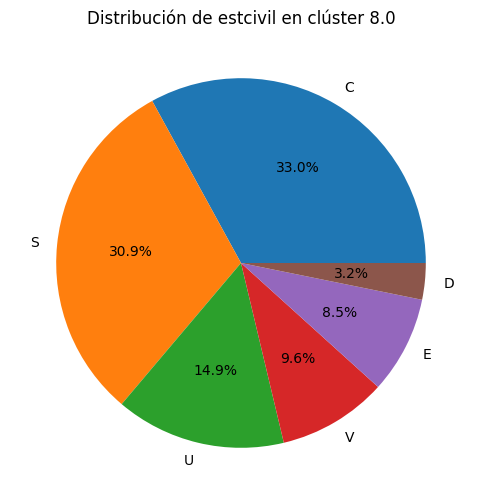

Cluster 6.0, Columna estcivil, Número de datos: 6


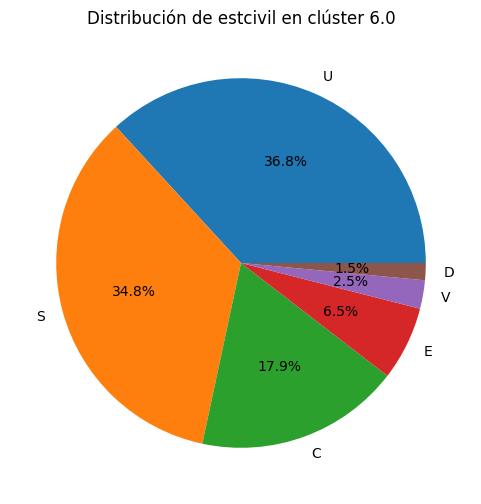

Cluster 2.0, Columna estcivil, Número de datos: 6


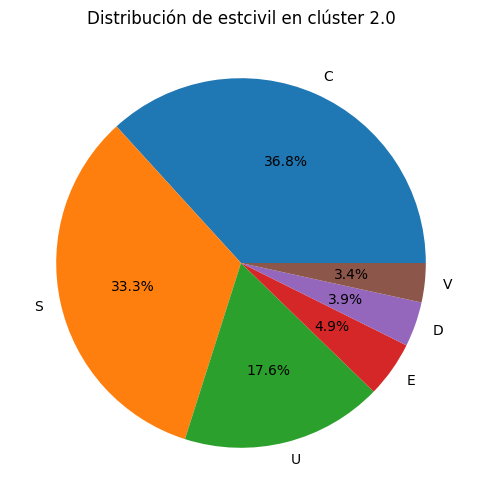

Cluster 5.0, Columna estcivil, Número de datos: 3


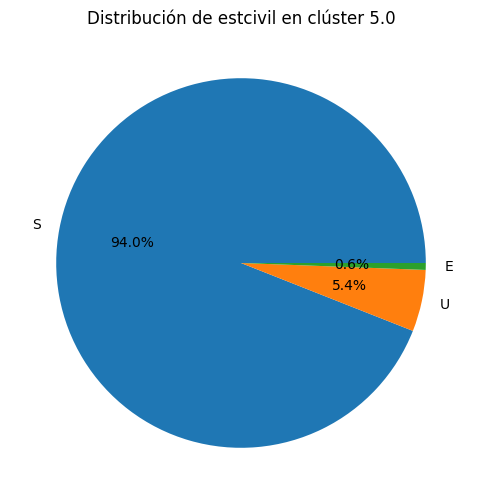

Cluster 1.0, Columna estcivil, Número de datos: 5


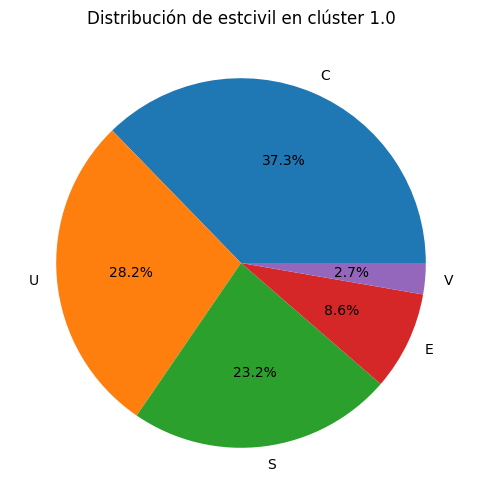

Cluster 0.0, Columna estrato, Número de datos: 5


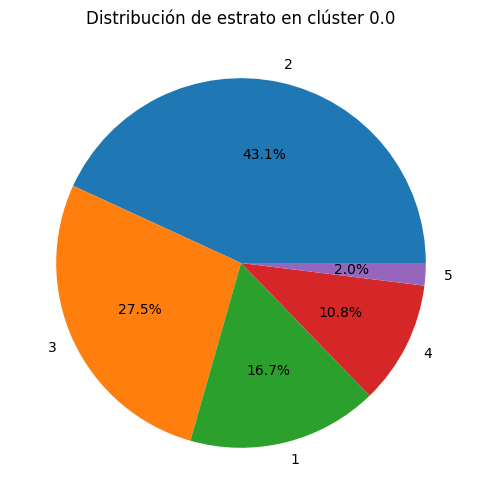

Cluster 4.0, Columna estrato, Número de datos: 5


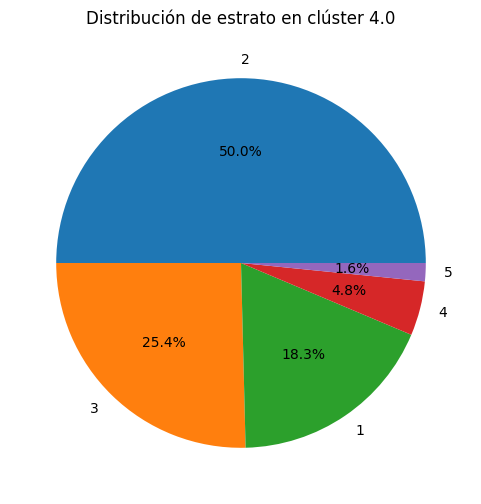

Cluster 7.0, Columna estrato, Número de datos: 6


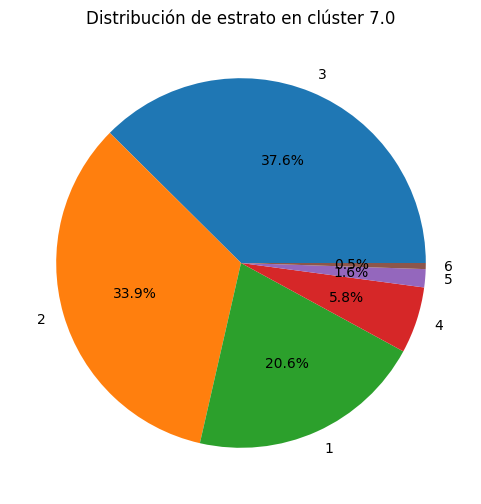

Cluster 3.0, Columna estrato, Número de datos: 5


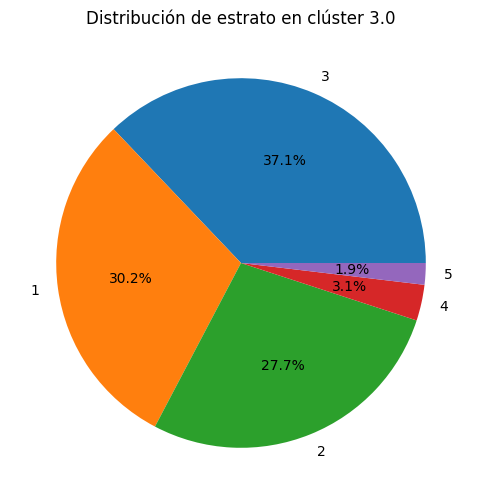

Cluster 8.0, Columna estrato, Número de datos: 5


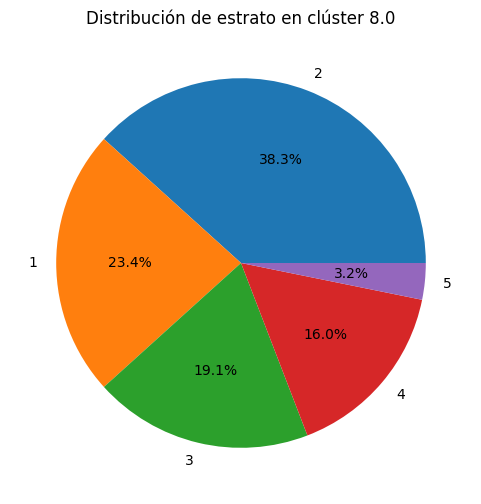

Cluster 6.0, Columna estrato, Número de datos: 5


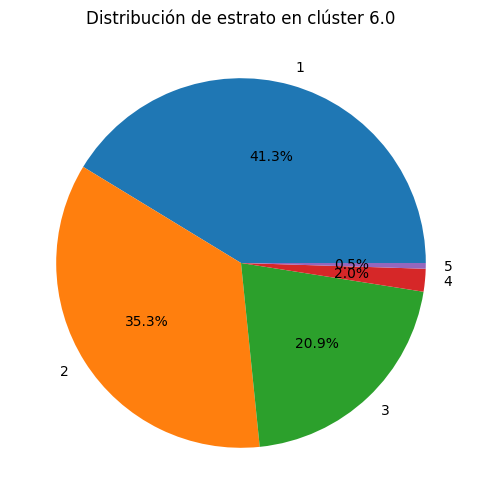

Cluster 2.0, Columna estrato, Número de datos: 5


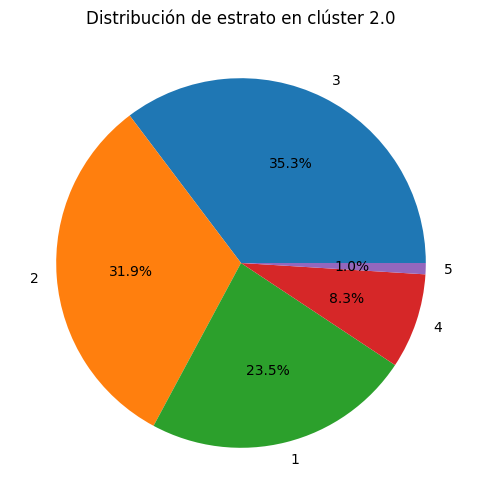

Cluster 5.0, Columna estrato, Número de datos: 6


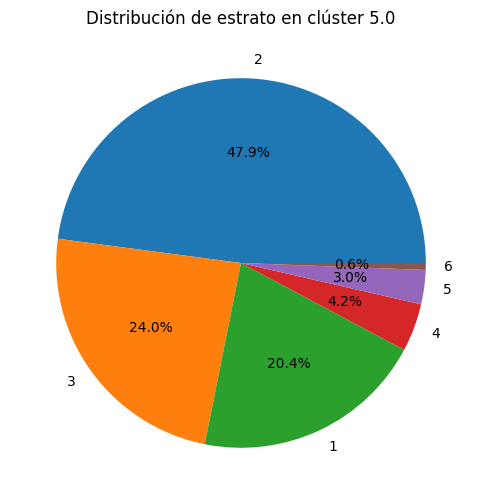

Cluster 1.0, Columna estrato, Número de datos: 5


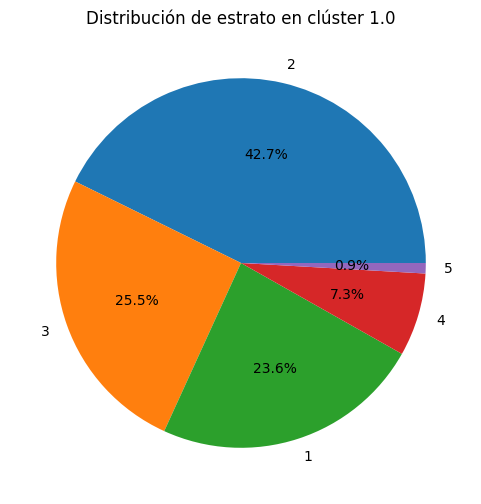

Cluster 0.0, Columna EstVac-19, Número de datos: 2


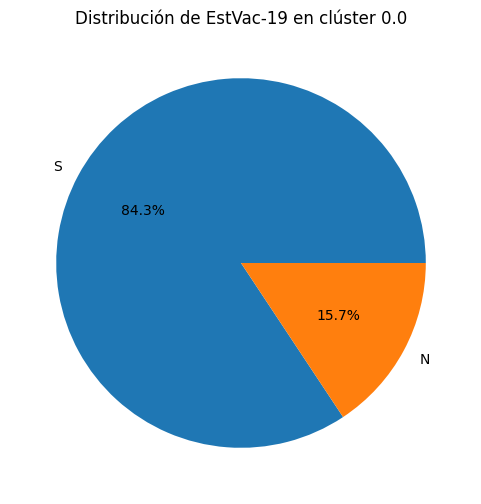

Cluster 4.0, Columna EstVac-19, Número de datos: 2


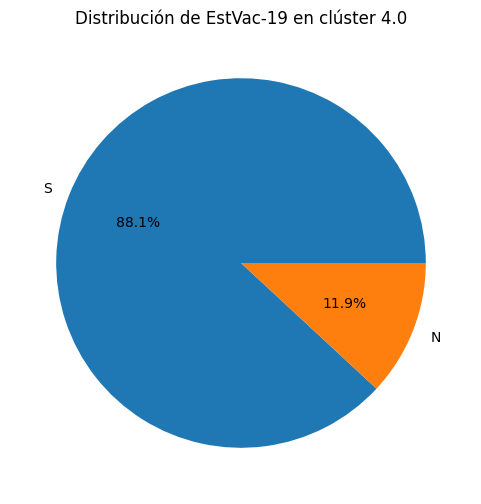

Cluster 7.0, Columna EstVac-19, Número de datos: 2


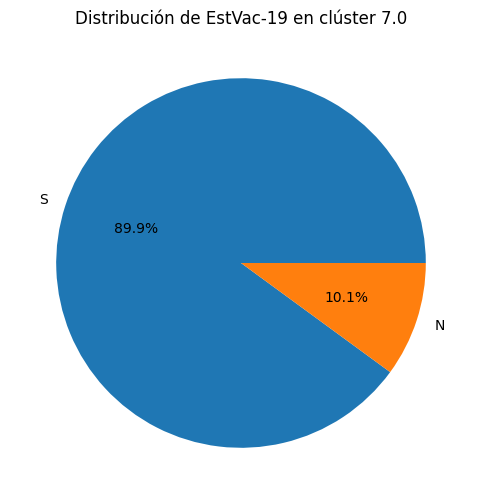

Cluster 3.0, Columna EstVac-19, Número de datos: 2


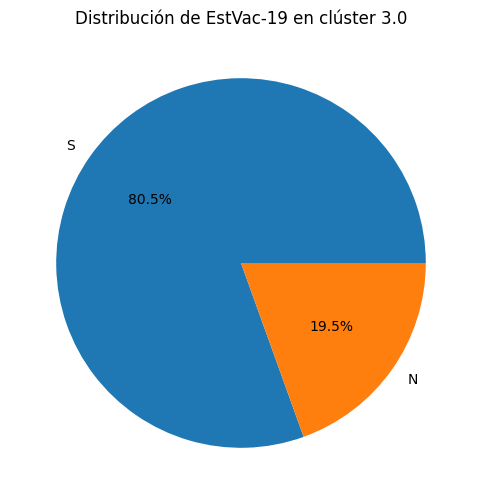

Cluster 8.0, Columna EstVac-19, Número de datos: 2


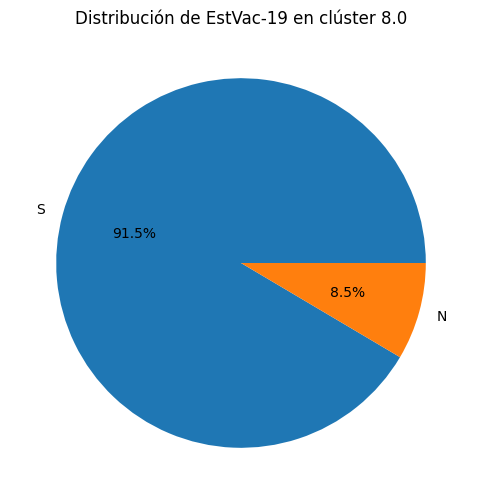

Cluster 6.0, Columna EstVac-19, Número de datos: 2


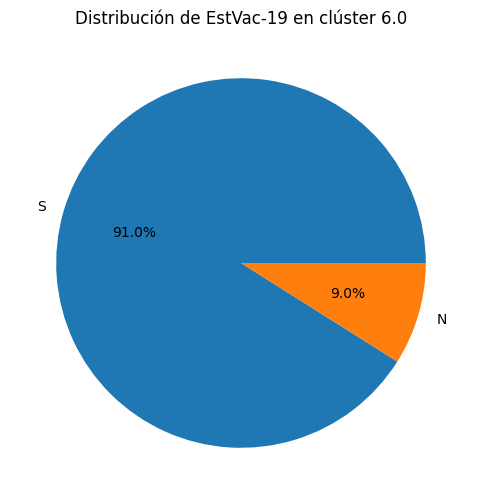

Cluster 2.0, Columna EstVac-19, Número de datos: 2


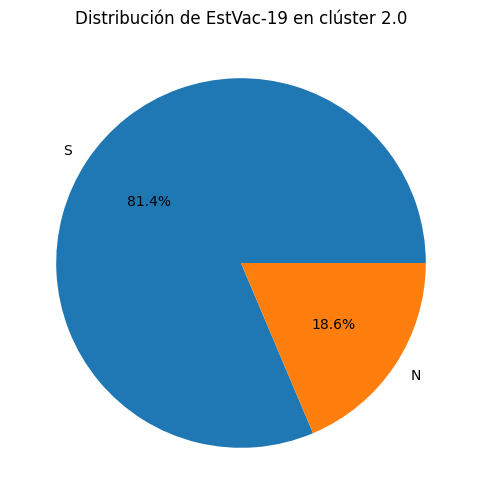

Cluster 5.0, Columna EstVac-19, Número de datos: 2


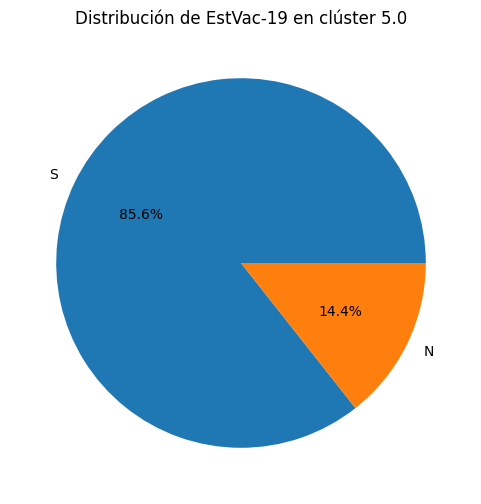

Cluster 1.0, Columna EstVac-19, Número de datos: 2


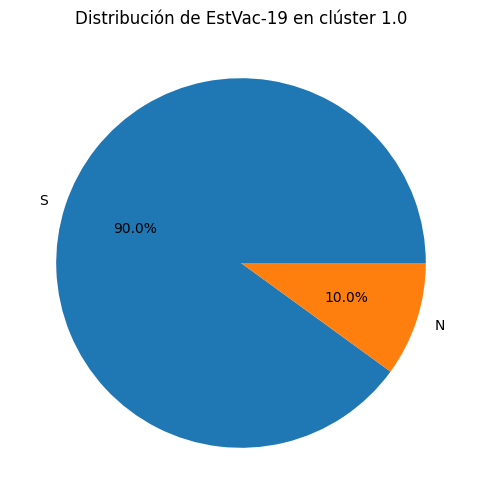

Cluster 0.0, Columna Sintcovid-19, Número de datos: 4


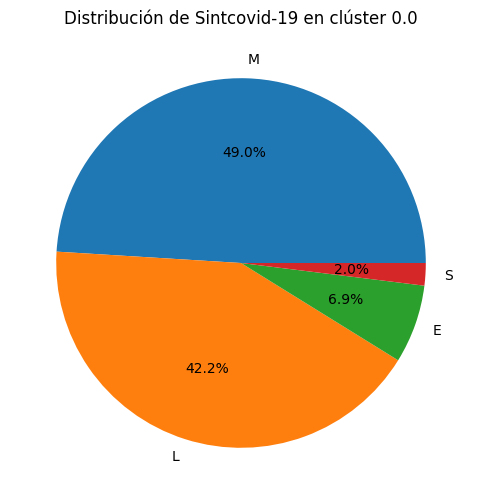

Cluster 4.0, Columna Sintcovid-19, Número de datos: 3


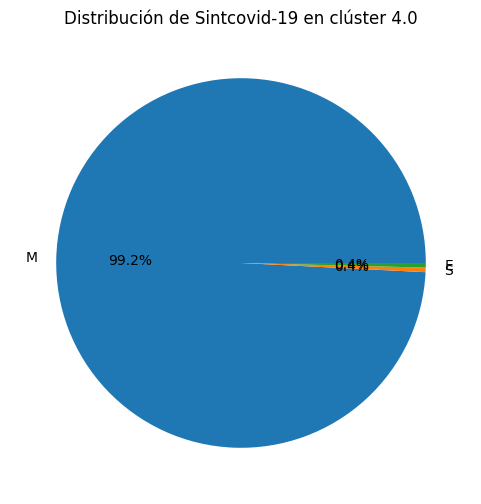

Cluster 7.0, Columna Sintcovid-19, Número de datos: 3


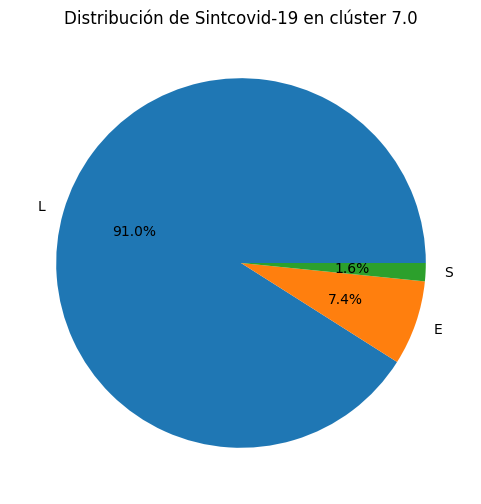

Cluster 3.0, Columna Sintcovid-19, Número de datos: 3


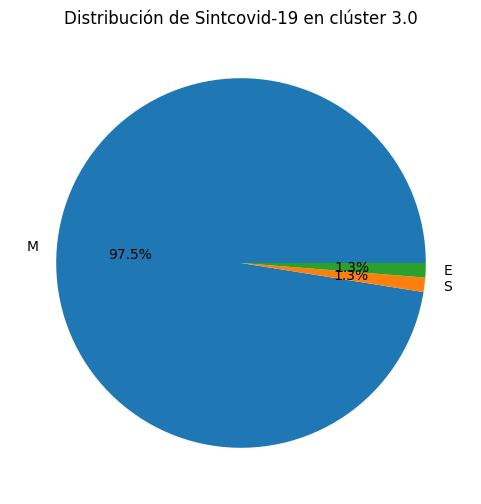

Cluster 8.0, Columna Sintcovid-19, Número de datos: 4


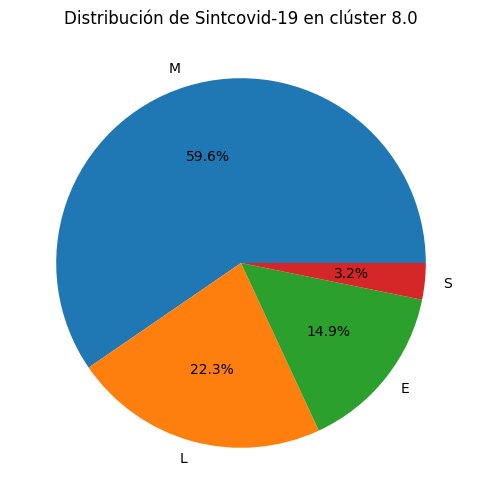

Cluster 6.0, Columna Sintcovid-19, Número de datos: 4


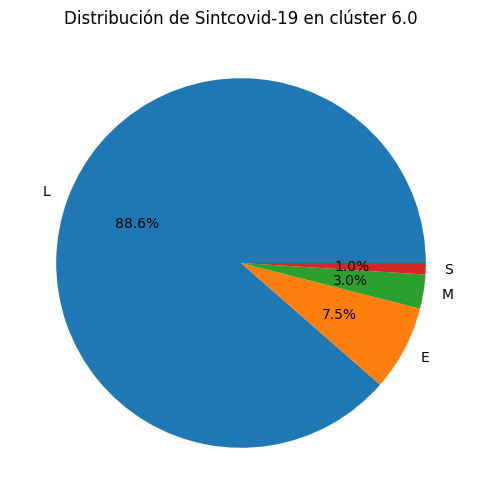

Cluster 2.0, Columna Sintcovid-19, Número de datos: 4


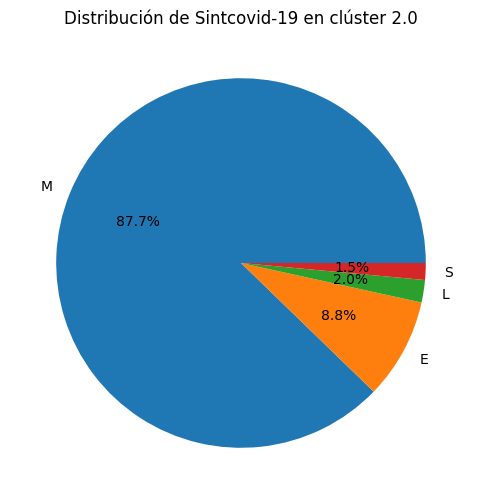

Cluster 5.0, Columna Sintcovid-19, Número de datos: 3


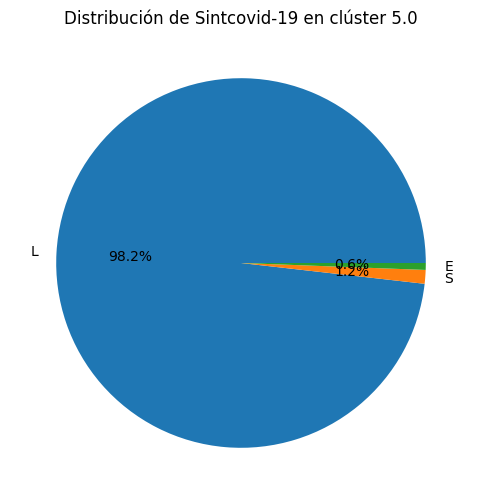

Cluster 1.0, Columna Sintcovid-19, Número de datos: 3


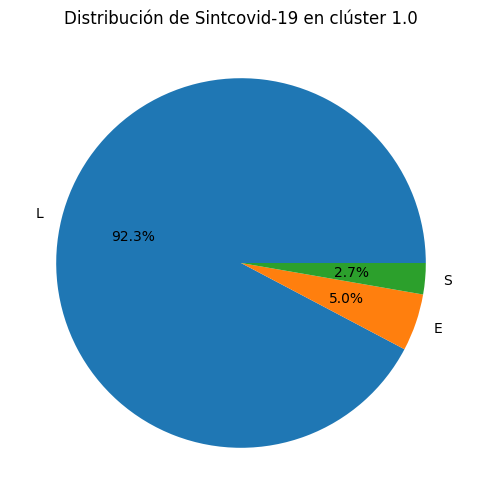

Cluster 0.0, Columna DOLOR C_2, Número de datos: 2


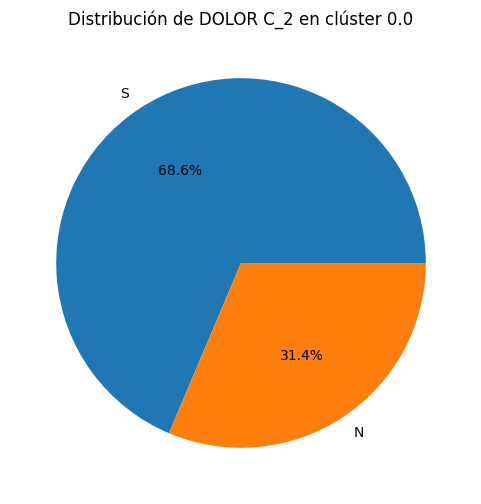

Cluster 4.0, Columna DOLOR C_2, Número de datos: 2


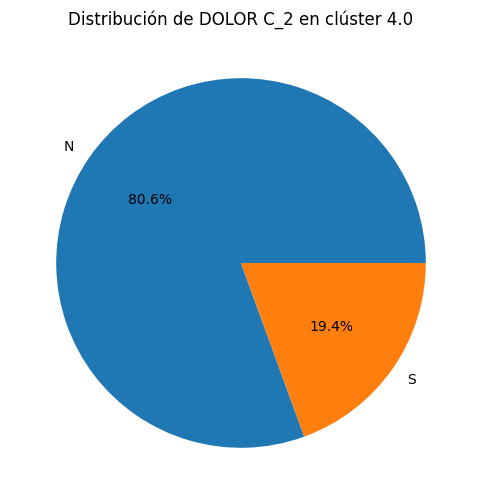

Cluster 7.0, Columna DOLOR C_2, Número de datos: 2


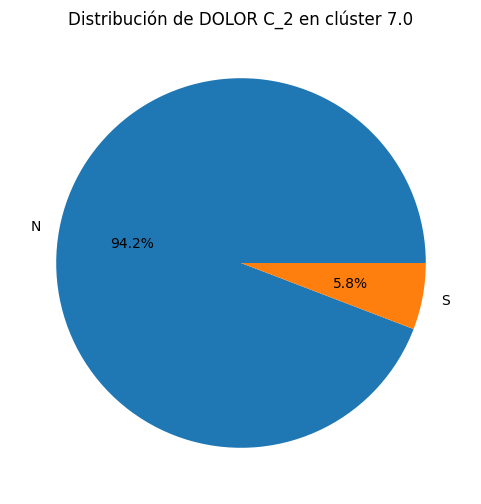

Cluster 3.0, Columna DOLOR C_2, Número de datos: 2


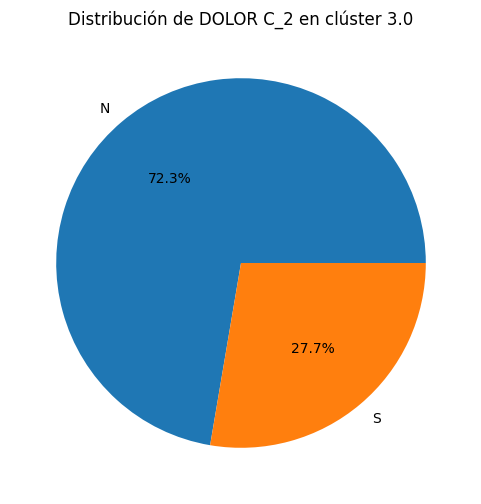

Cluster 8.0, Columna DOLOR C_2, Número de datos: 2


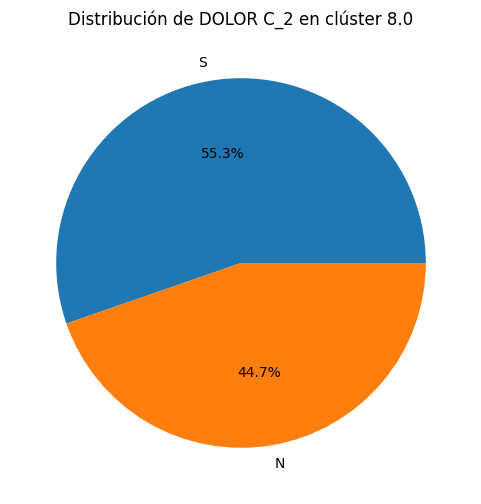

Cluster 6.0, Columna DOLOR C_2, Número de datos: 1


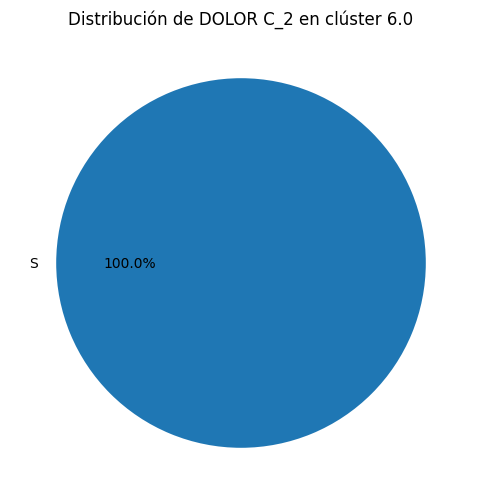

Cluster 2.0, Columna DOLOR C_2, Número de datos: 2


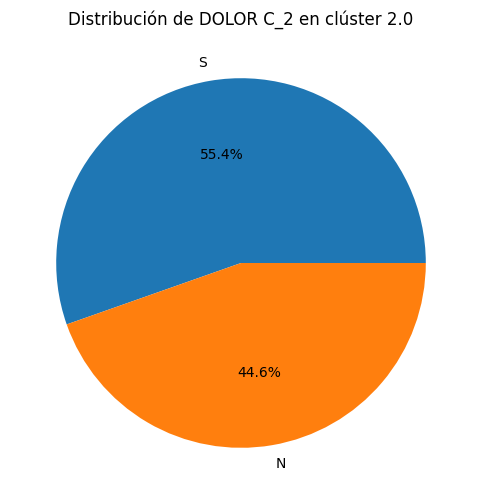

Cluster 5.0, Columna DOLOR C_2, Número de datos: 2


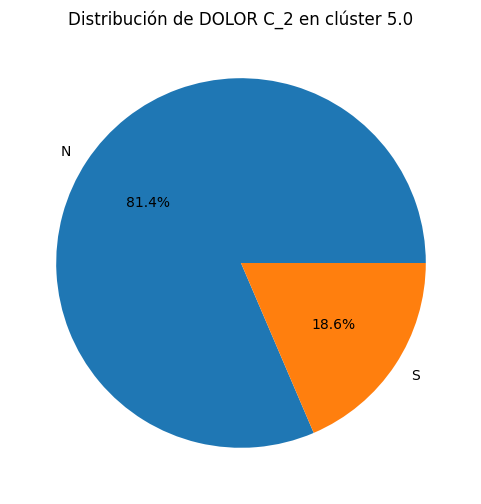

Cluster 1.0, Columna DOLOR C_2, Número de datos: 1


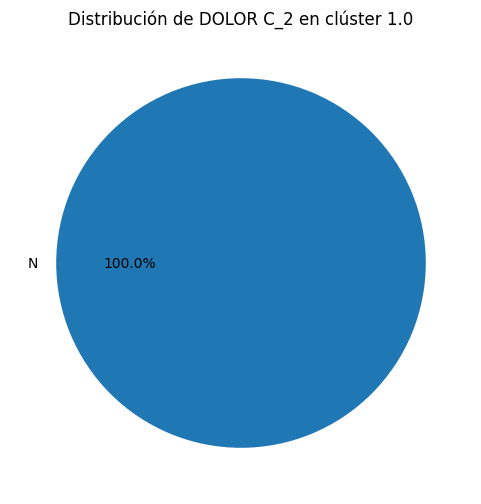

Cluster 0.0, Columna PT OLFATO_2, Número de datos: 2


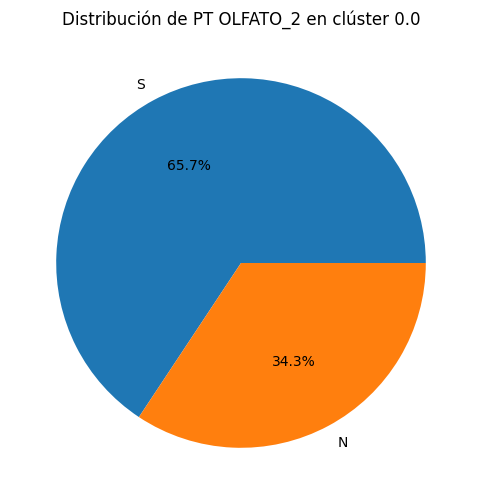

Cluster 4.0, Columna PT OLFATO_2, Número de datos: 2


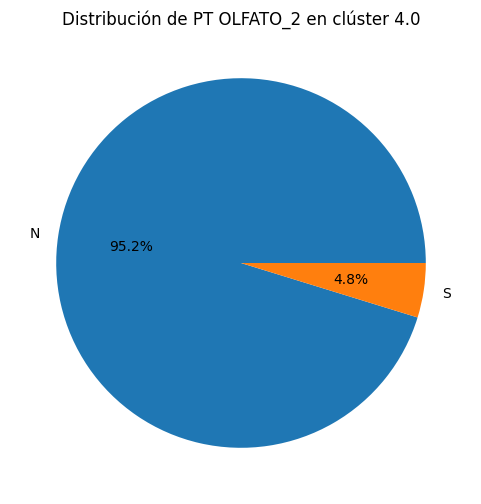

Cluster 7.0, Columna PT OLFATO_2, Número de datos: 2


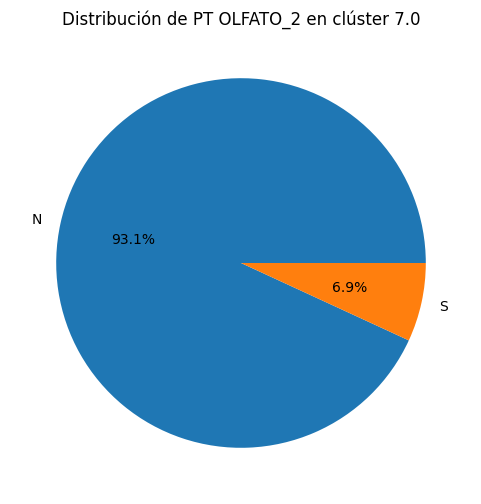

Cluster 3.0, Columna PT OLFATO_2, Número de datos: 2


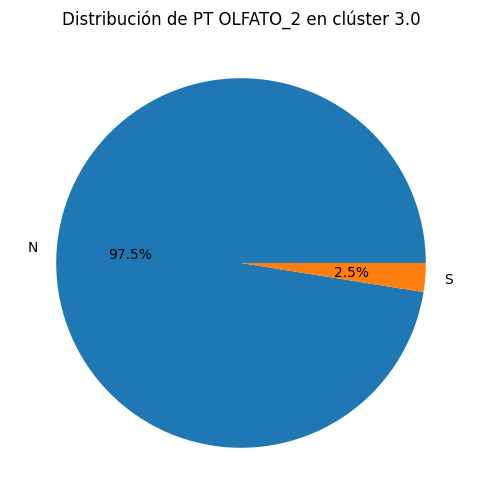

Cluster 8.0, Columna PT OLFATO_2, Número de datos: 2


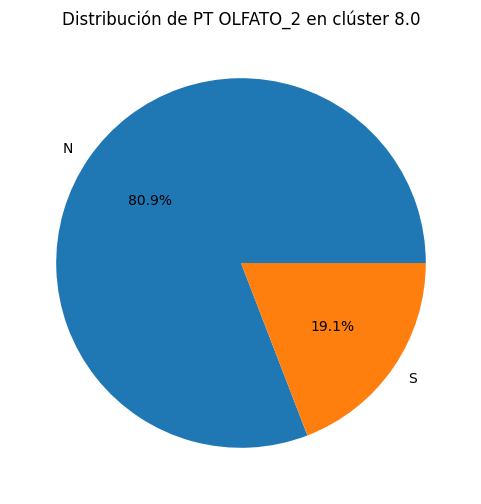

Cluster 6.0, Columna PT OLFATO_2, Número de datos: 2


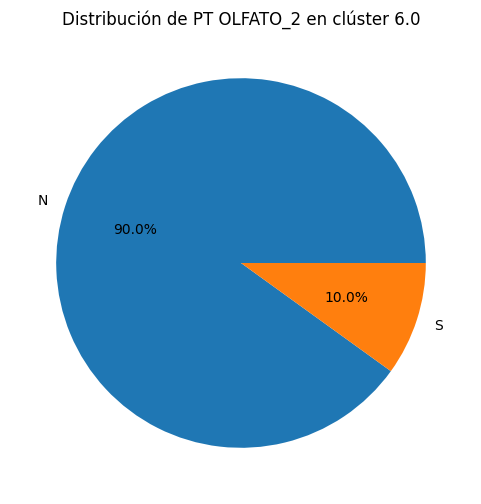

Cluster 2.0, Columna PT OLFATO_2, Número de datos: 2


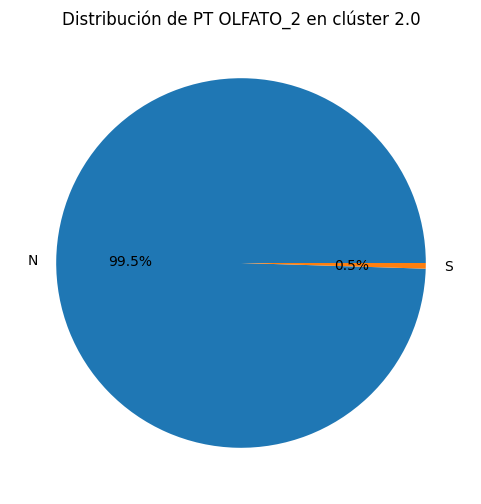

Cluster 5.0, Columna PT OLFATO_2, Número de datos: 2


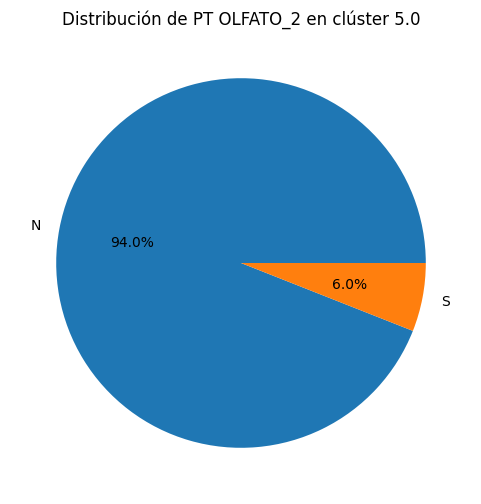

Cluster 1.0, Columna PT OLFATO_2, Número de datos: 2


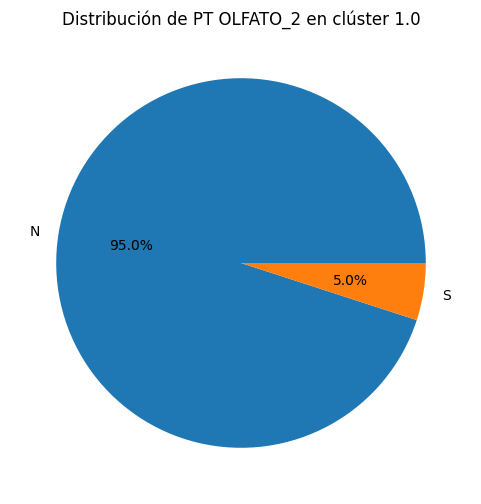

Cluster 0.0, Columna PP OLFATO_2, Número de datos: 2


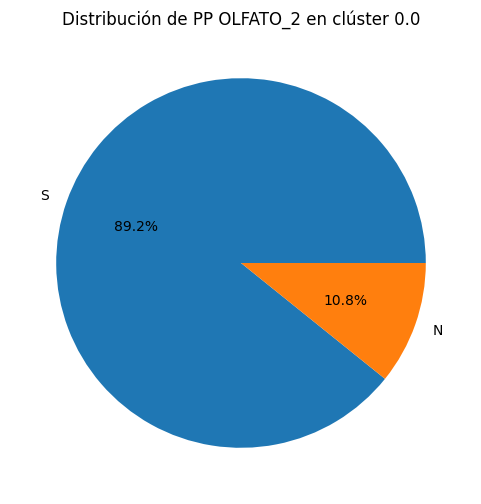

Cluster 4.0, Columna PP OLFATO_2, Número de datos: 2


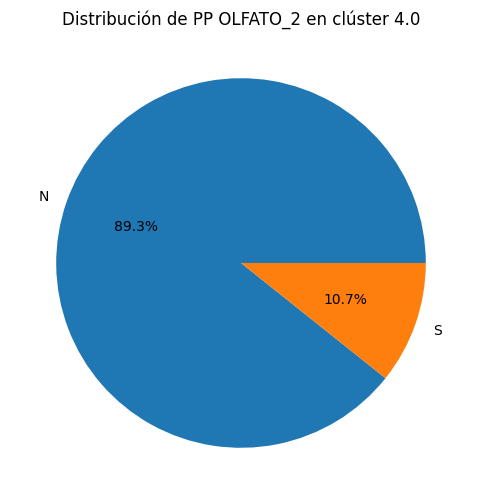

Cluster 7.0, Columna PP OLFATO_2, Número de datos: 2


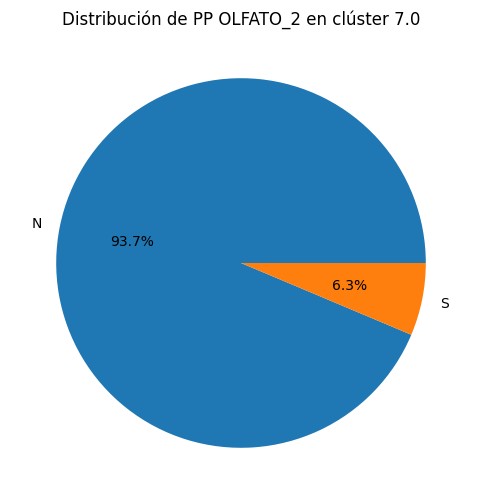

Cluster 3.0, Columna PP OLFATO_2, Número de datos: 2


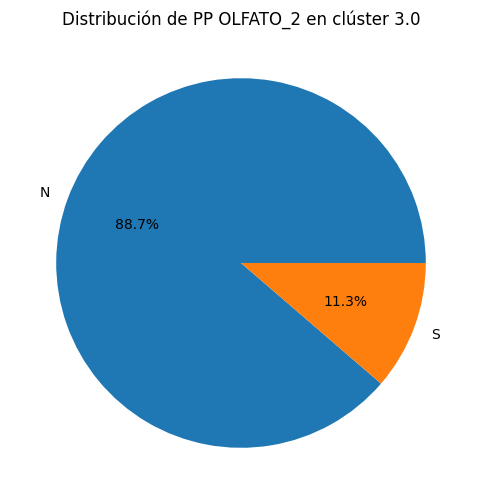

Cluster 8.0, Columna PP OLFATO_2, Número de datos: 2


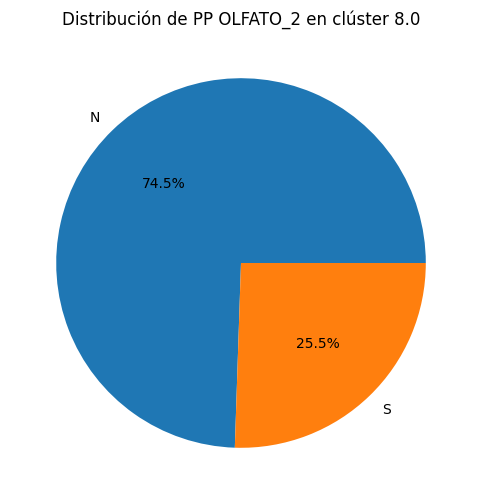

Cluster 6.0, Columna PP OLFATO_2, Número de datos: 2


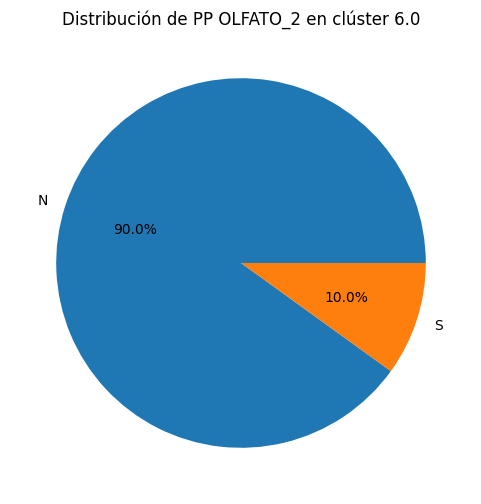

Cluster 2.0, Columna PP OLFATO_2, Número de datos: 2


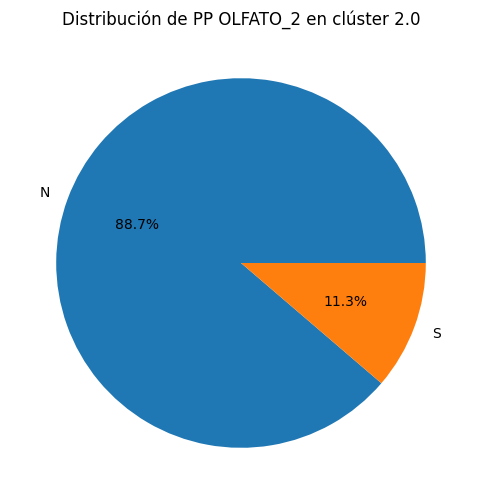

Cluster 5.0, Columna PP OLFATO_2, Número de datos: 2


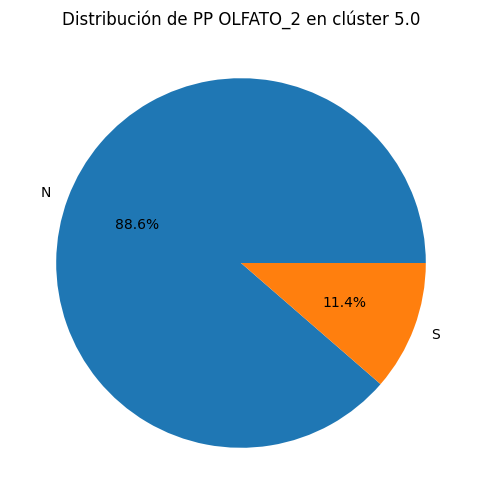

Cluster 1.0, Columna PP OLFATO_2, Número de datos: 2


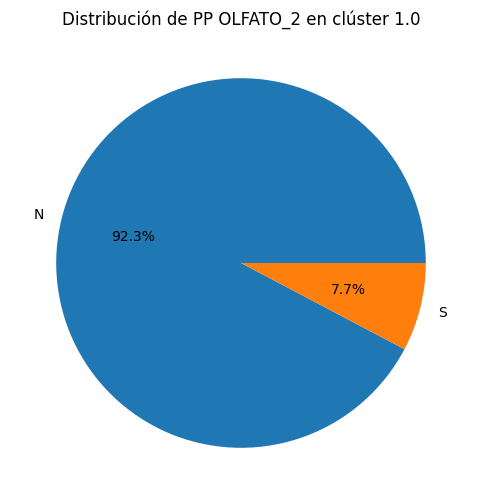

Cluster 0.0, Columna P GUSTO_2, Número de datos: 2


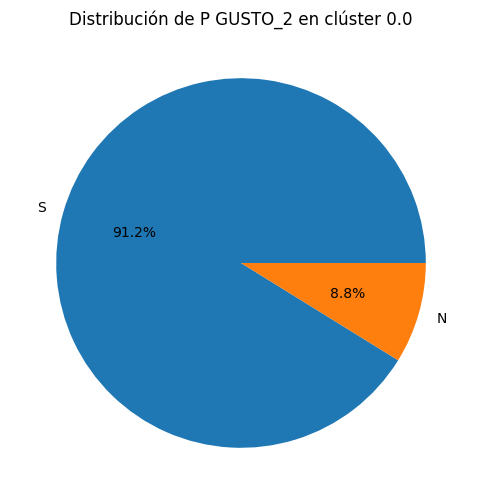

Cluster 4.0, Columna P GUSTO_2, Número de datos: 2


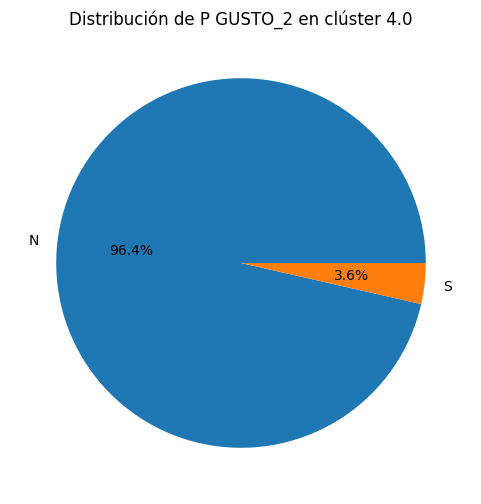

Cluster 7.0, Columna P GUSTO_2, Número de datos: 2


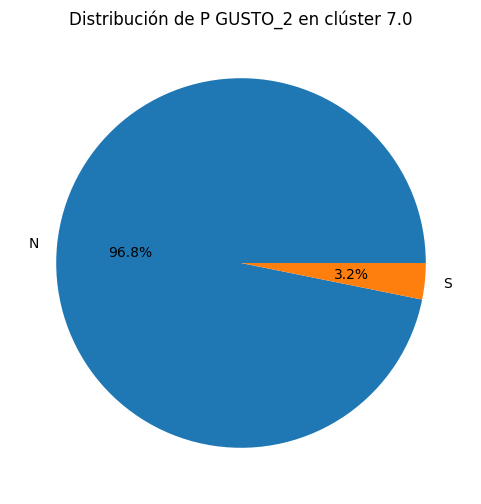

Cluster 3.0, Columna P GUSTO_2, Número de datos: 2


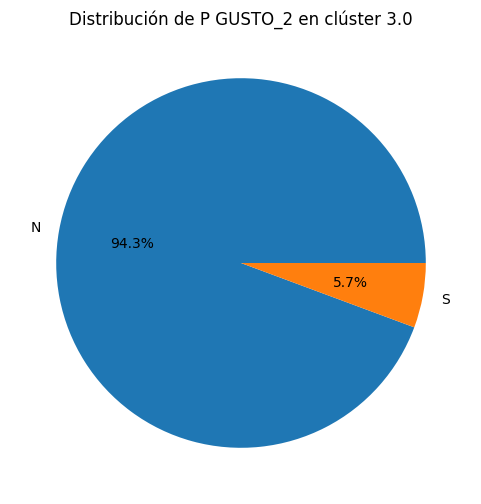

Cluster 8.0, Columna P GUSTO_2, Número de datos: 2


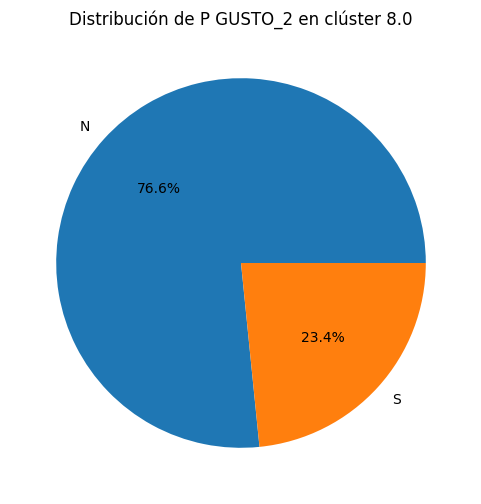

Cluster 6.0, Columna P GUSTO_2, Número de datos: 2


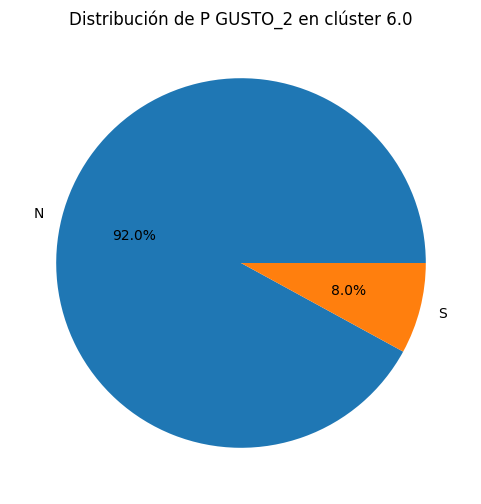

Cluster 2.0, Columna P GUSTO_2, Número de datos: 2


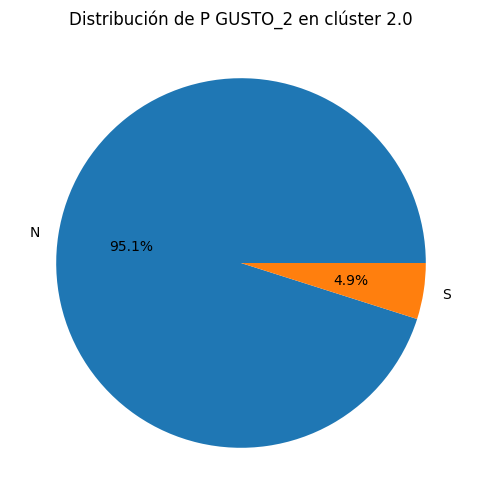

Cluster 5.0, Columna P GUSTO_2, Número de datos: 2


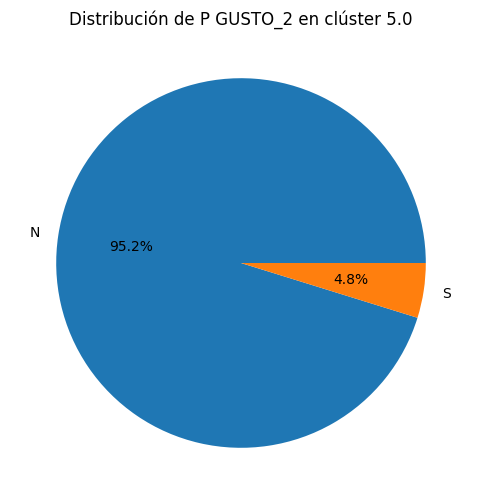

Cluster 1.0, Columna P GUSTO_2, Número de datos: 2


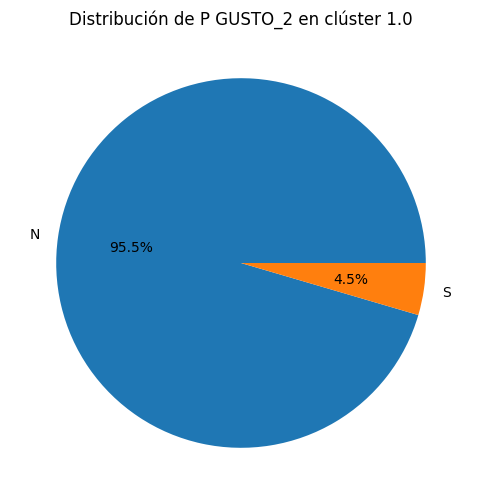

Cluster 0.0, Columna CONFUS_2, Número de datos: 2


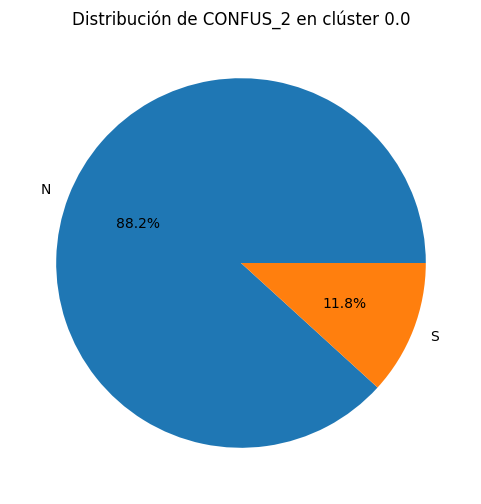

Cluster 4.0, Columna CONFUS_2, Número de datos: 2


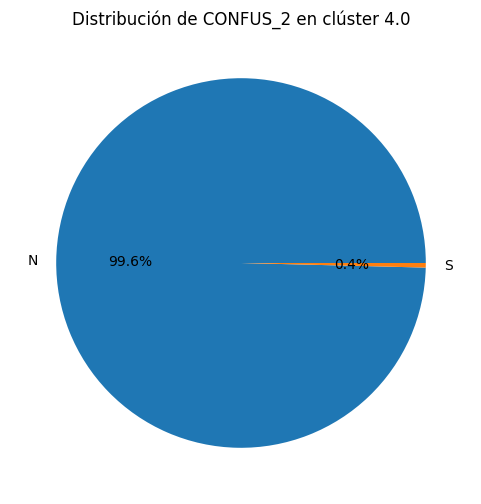

Cluster 7.0, Columna CONFUS_2, Número de datos: 2


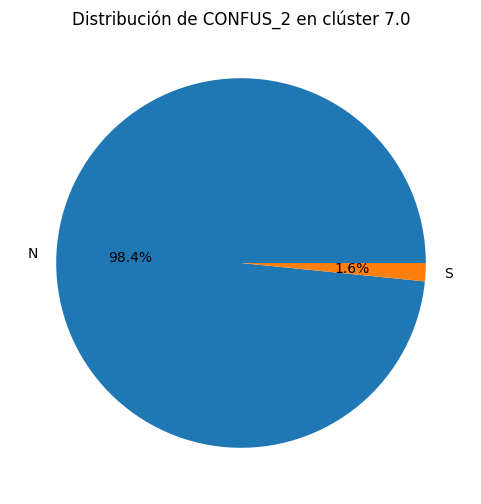

Cluster 3.0, Columna CONFUS_2, Número de datos: 2


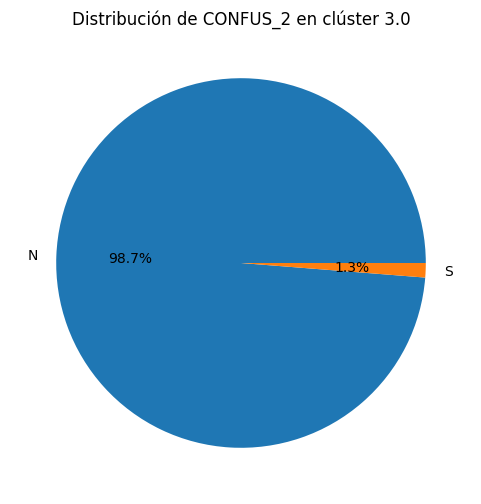

Cluster 8.0, Columna CONFUS_2, Número de datos: 2


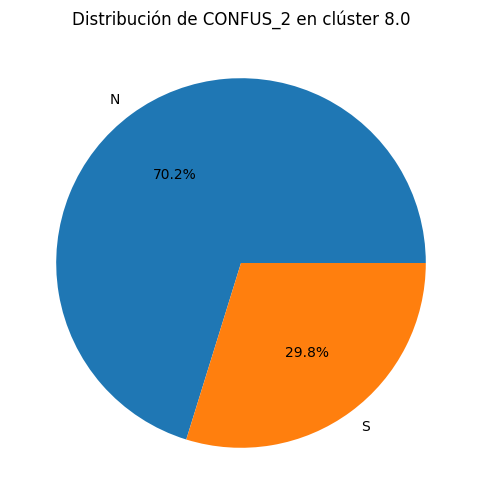

Cluster 6.0, Columna CONFUS_2, Número de datos: 2


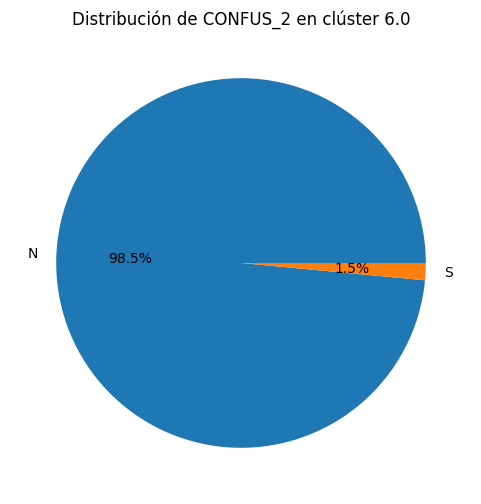

Cluster 2.0, Columna CONFUS_2, Número de datos: 2


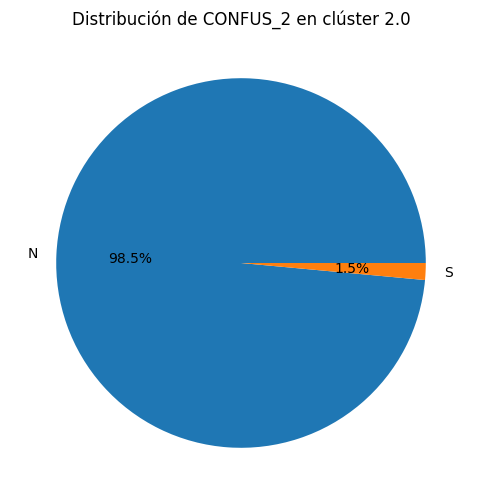

Cluster 5.0, Columna CONFUS_2, Número de datos: 2


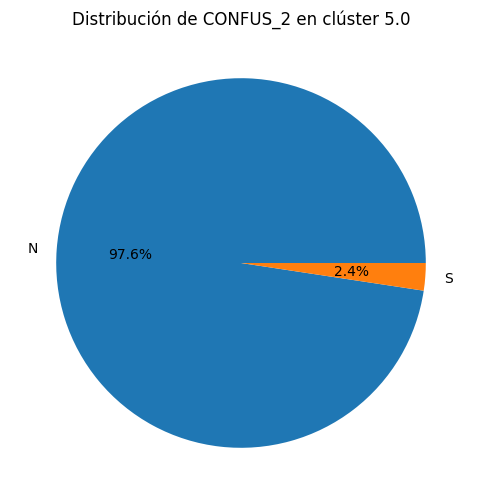

Cluster 1.0, Columna CONFUS_2, Número de datos: 2


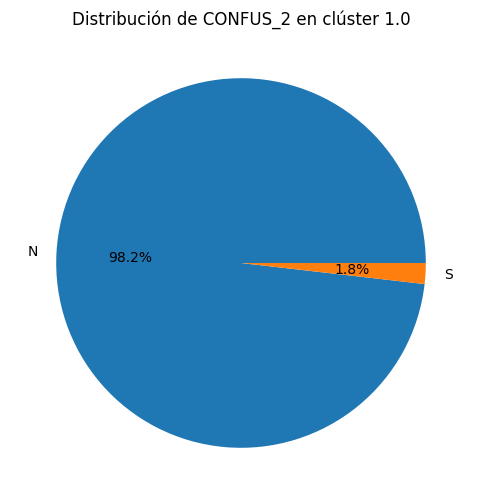

Cluster 0.0, Columna DESORIENTA_2, Número de datos: 2


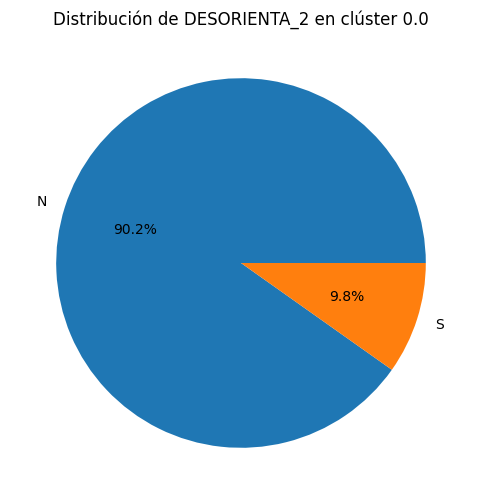

Cluster 4.0, Columna DESORIENTA_2, Número de datos: 2


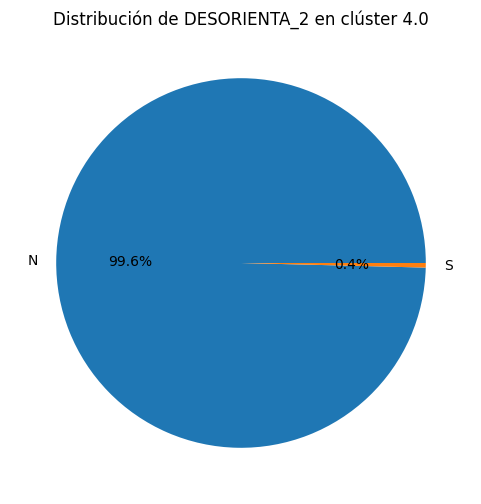

Cluster 7.0, Columna DESORIENTA_2, Número de datos: 2


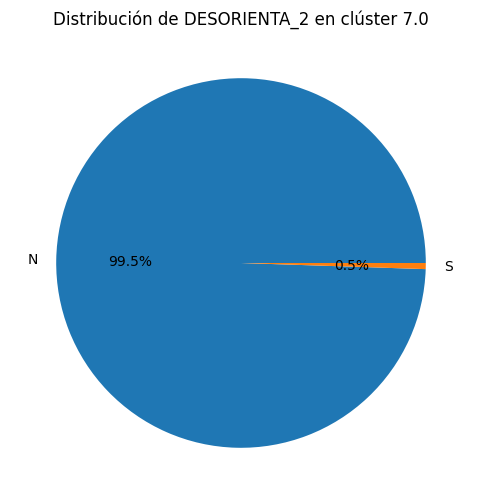

Cluster 3.0, Columna DESORIENTA_2, Número de datos: 2


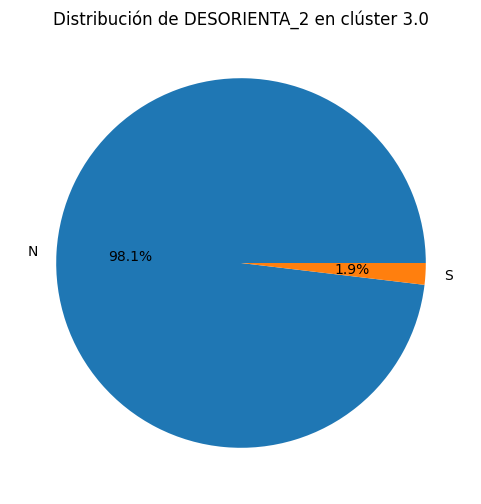

Cluster 8.0, Columna DESORIENTA_2, Número de datos: 2


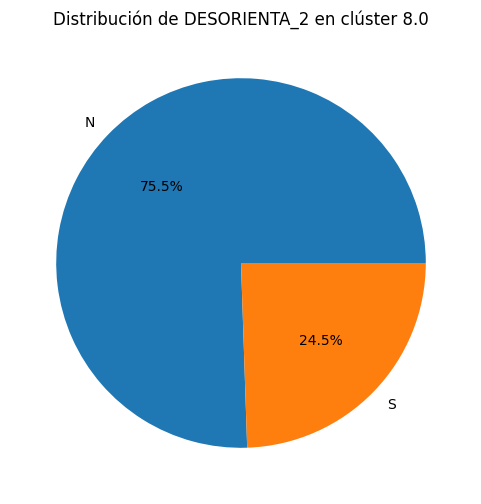

Cluster 6.0, Columna DESORIENTA_2, Número de datos: 2


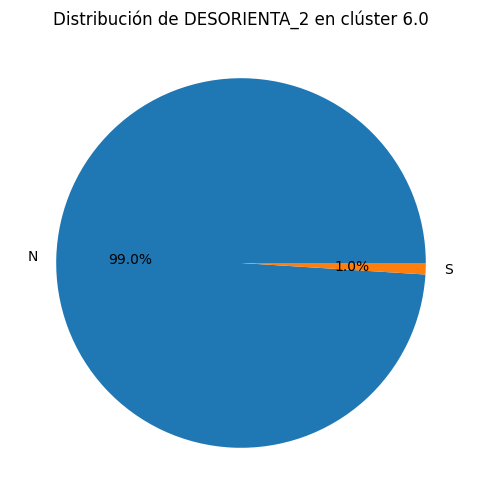

Cluster 2.0, Columna DESORIENTA_2, Número de datos: 2


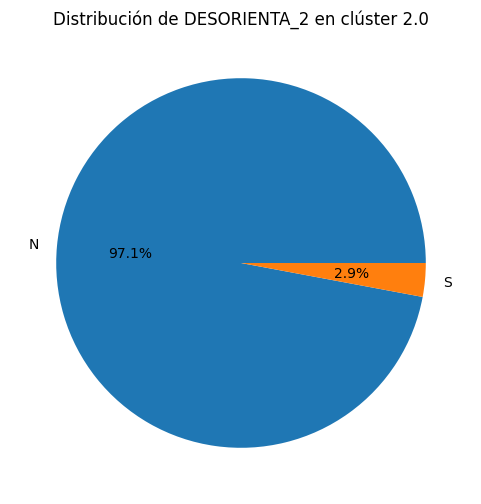

Cluster 5.0, Columna DESORIENTA_2, Número de datos: 2


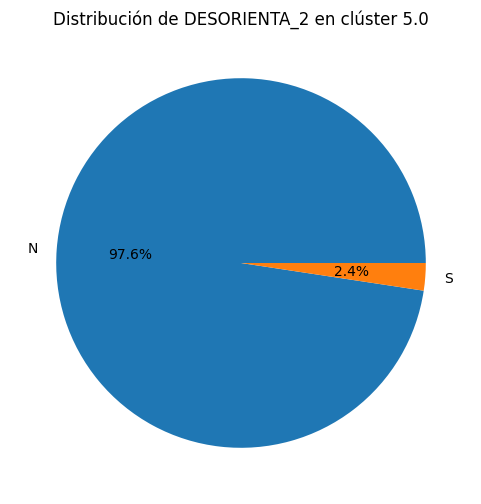

Cluster 1.0, Columna DESORIENTA_2, Número de datos: 2


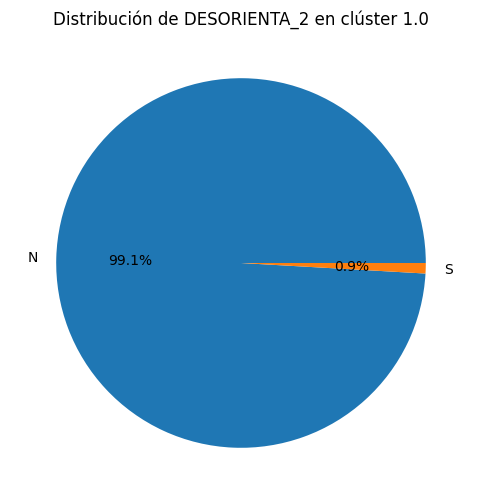

Cluster 0.0, Columna F ENERGIA_2, Número de datos: 2


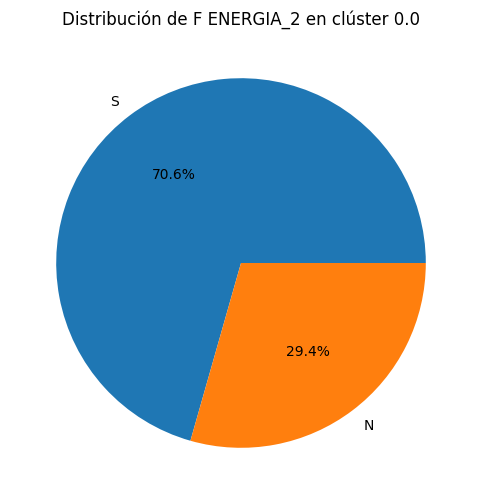

Cluster 4.0, Columna F ENERGIA_2, Número de datos: 2


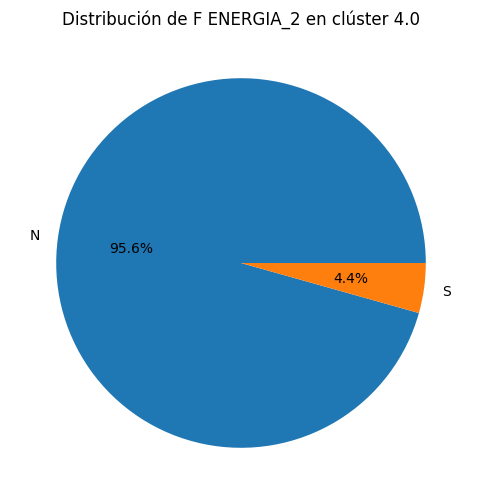

Cluster 7.0, Columna F ENERGIA_2, Número de datos: 2


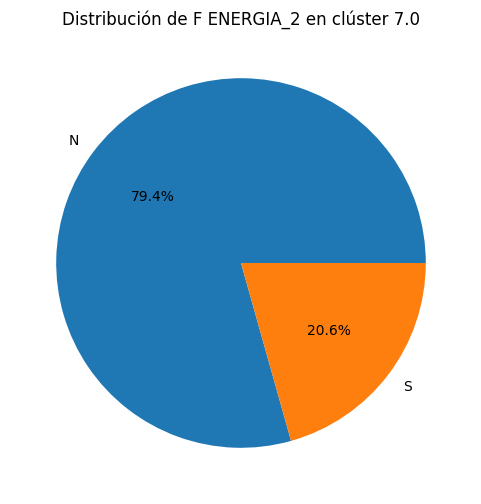

Cluster 3.0, Columna F ENERGIA_2, Número de datos: 2


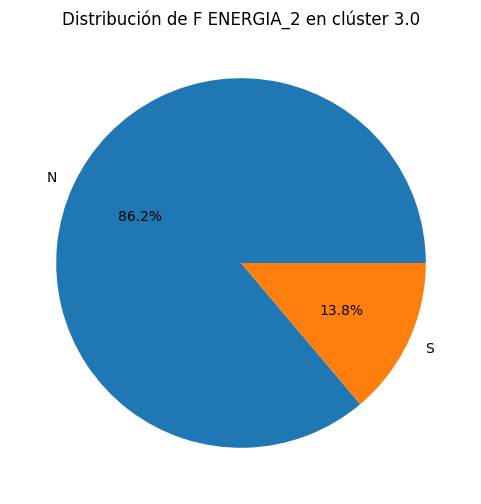

Cluster 8.0, Columna F ENERGIA_2, Número de datos: 2


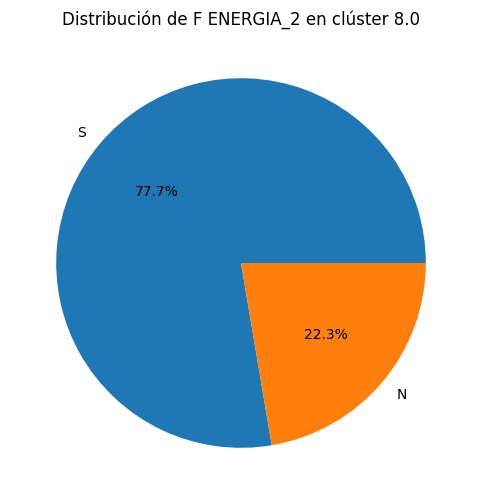

Cluster 6.0, Columna F ENERGIA_2, Número de datos: 2


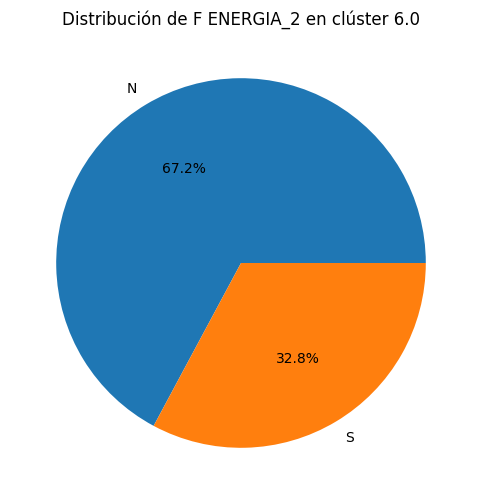

Cluster 2.0, Columna F ENERGIA_2, Número de datos: 2


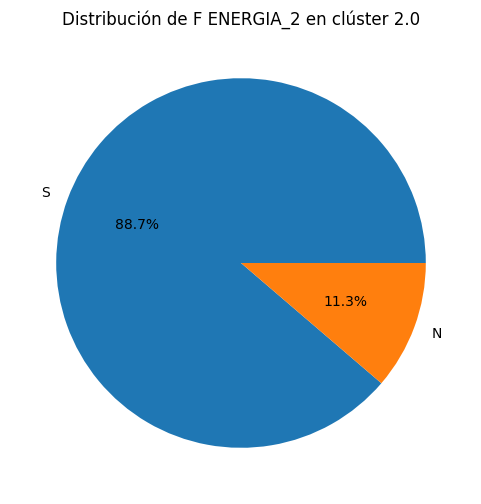

Cluster 5.0, Columna F ENERGIA_2, Número de datos: 2


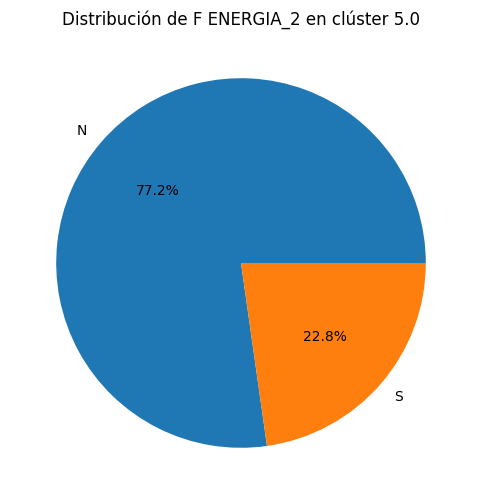

Cluster 1.0, Columna F ENERGIA_2, Número de datos: 2


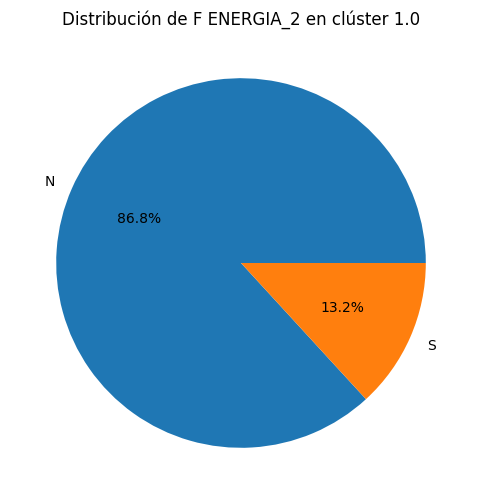

Cluster 0.0, Columna TEMBLOR_2, Número de datos: 2


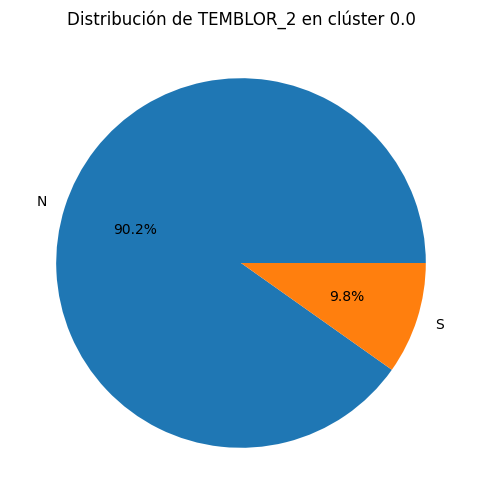

Cluster 4.0, Columna TEMBLOR_2, Número de datos: 2


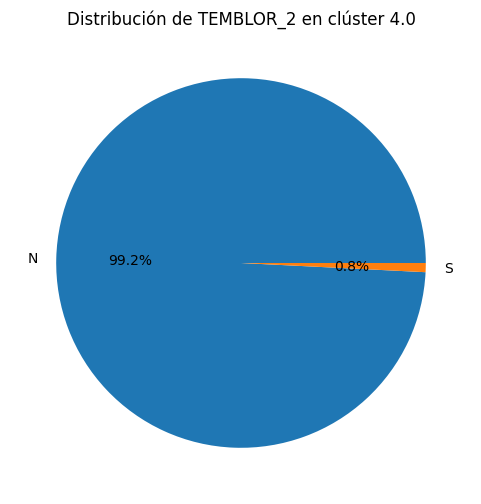

Cluster 7.0, Columna TEMBLOR_2, Número de datos: 2


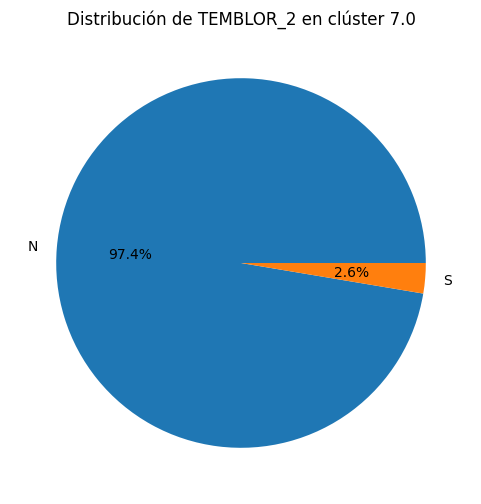

Cluster 3.0, Columna TEMBLOR_2, Número de datos: 2


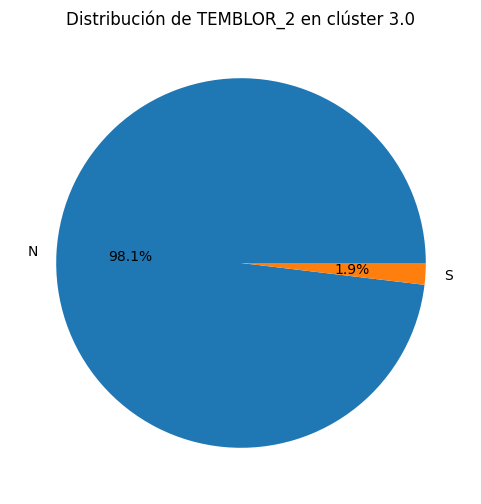

Cluster 8.0, Columna TEMBLOR_2, Número de datos: 2


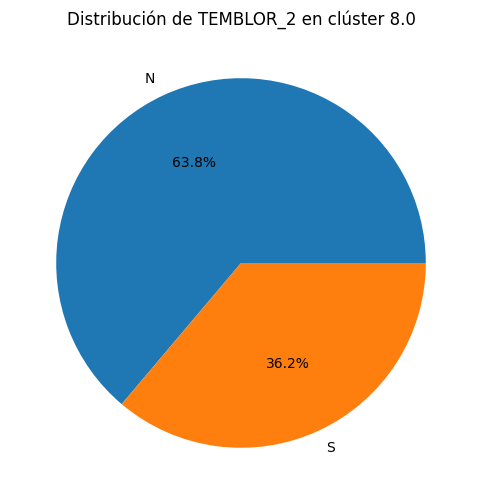

Cluster 6.0, Columna TEMBLOR_2, Número de datos: 2


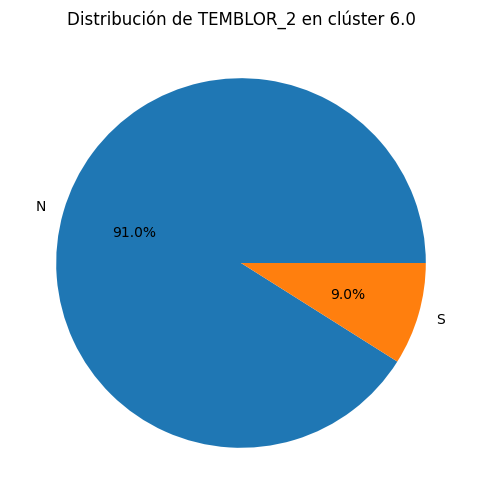

Cluster 2.0, Columna TEMBLOR_2, Número de datos: 2


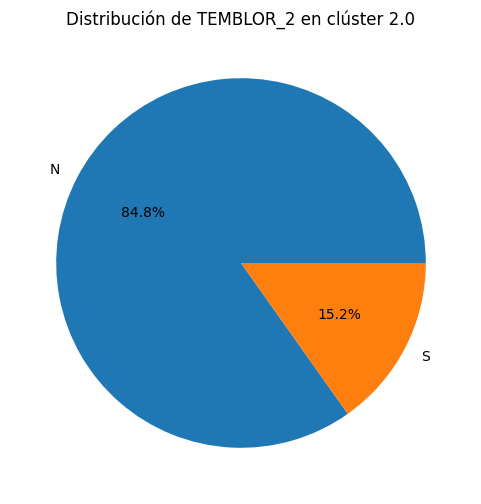

Cluster 5.0, Columna TEMBLOR_2, Número de datos: 2


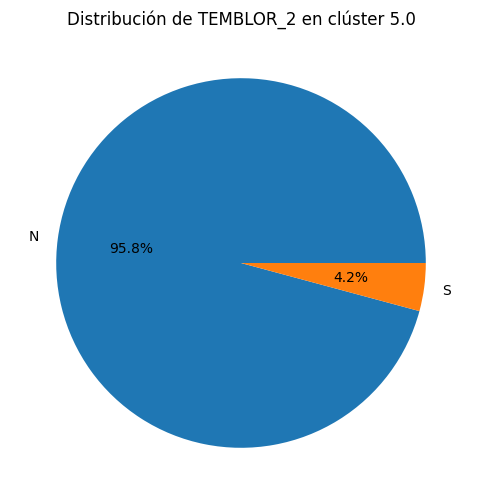

Cluster 1.0, Columna TEMBLOR_2, Número de datos: 2


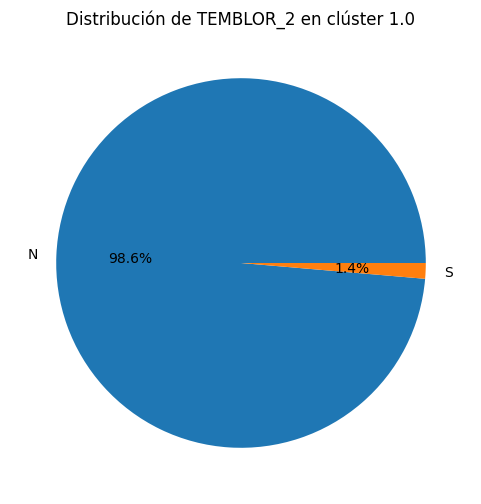

Cluster 0.0, Columna DIF NOMP_2, Número de datos: 2


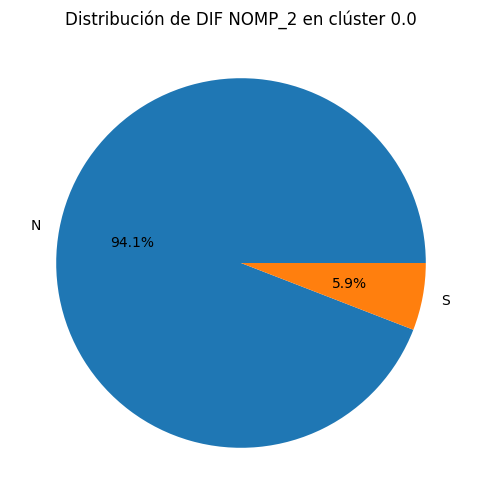

Cluster 4.0, Columna DIF NOMP_2, Número de datos: 1


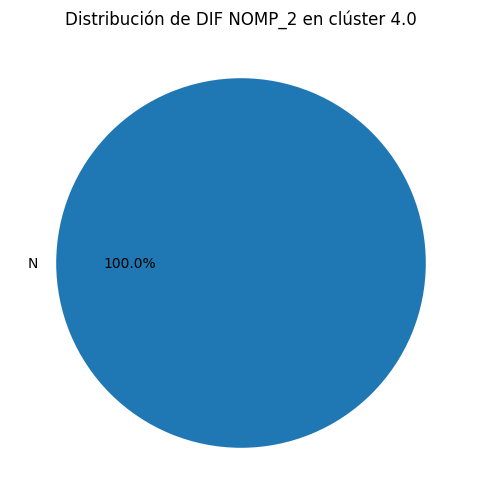

Cluster 7.0, Columna DIF NOMP_2, Número de datos: 2


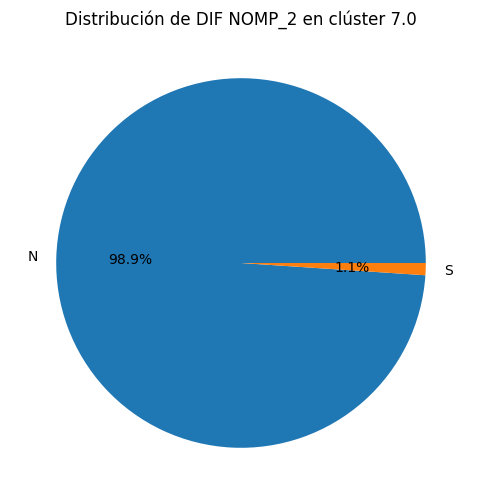

Cluster 3.0, Columna DIF NOMP_2, Número de datos: 2


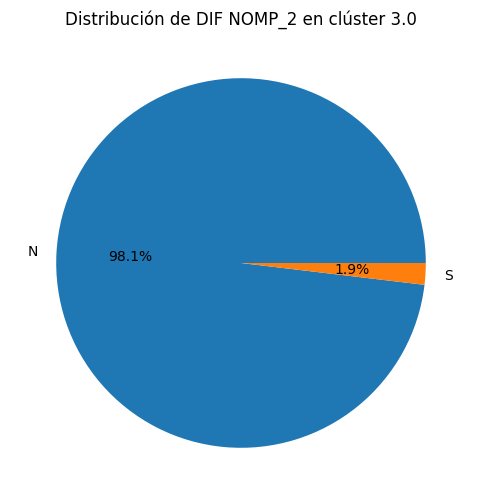

Cluster 8.0, Columna DIF NOMP_2, Número de datos: 2


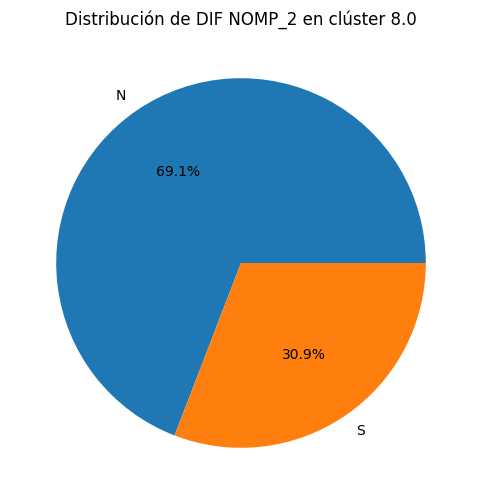

Cluster 6.0, Columna DIF NOMP_2, Número de datos: 2


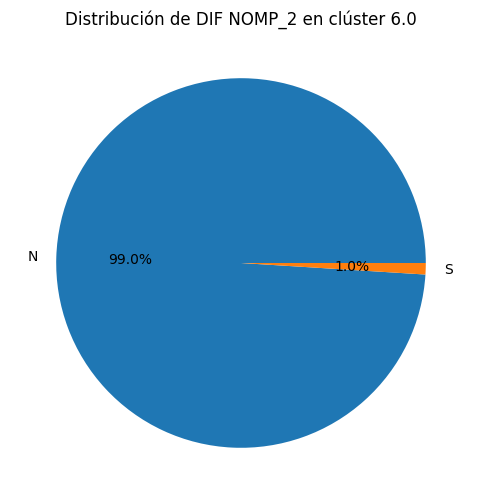

Cluster 2.0, Columna DIF NOMP_2, Número de datos: 2


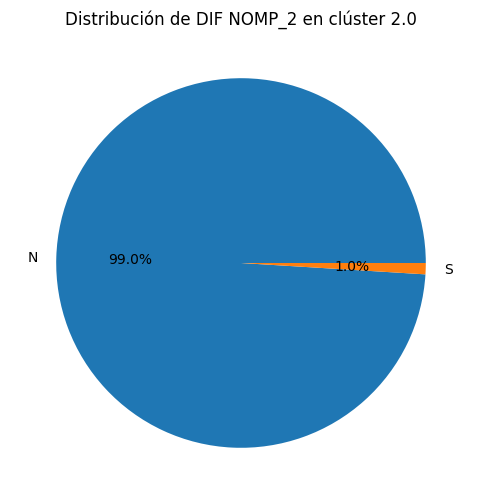

Cluster 5.0, Columna DIF NOMP_2, Número de datos: 2


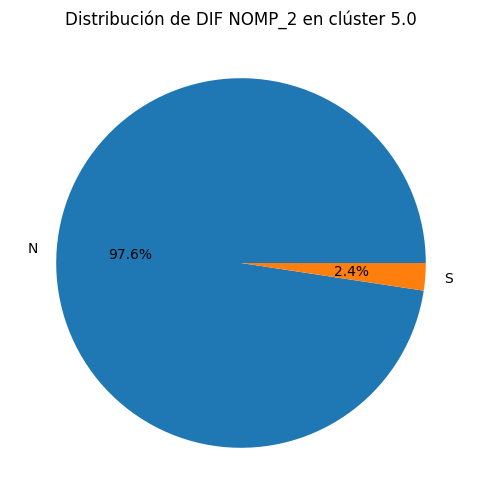

Cluster 1.0, Columna DIF NOMP_2, Número de datos: 2


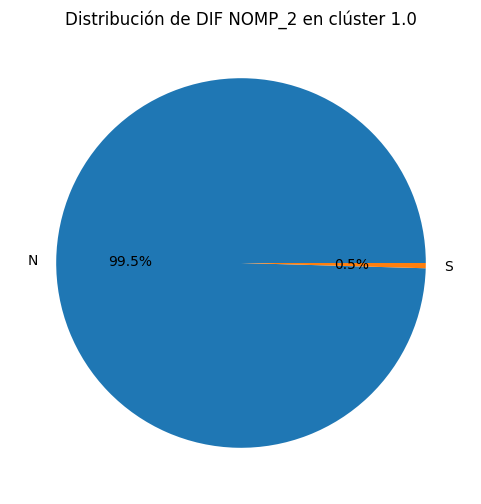

Cluster 0.0, Columna DEPRES_2, Número de datos: 2


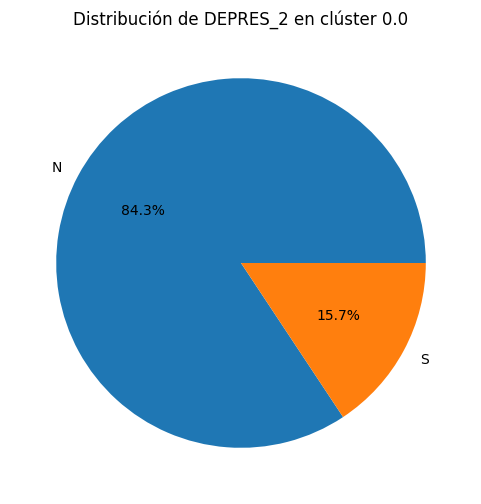

Cluster 4.0, Columna DEPRES_2, Número de datos: 2


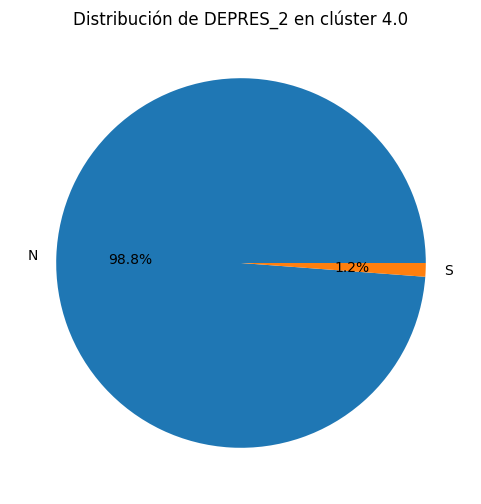

Cluster 7.0, Columna DEPRES_2, Número de datos: 2


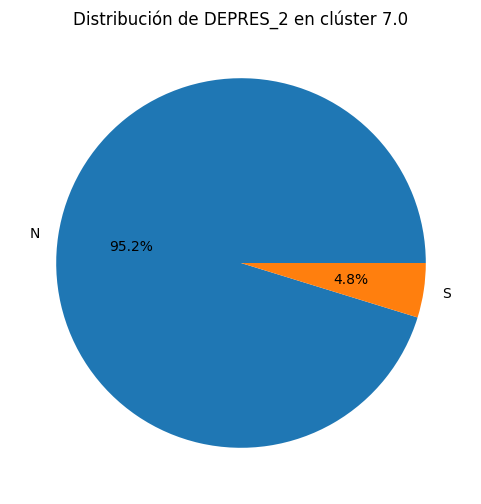

Cluster 3.0, Columna DEPRES_2, Número de datos: 2


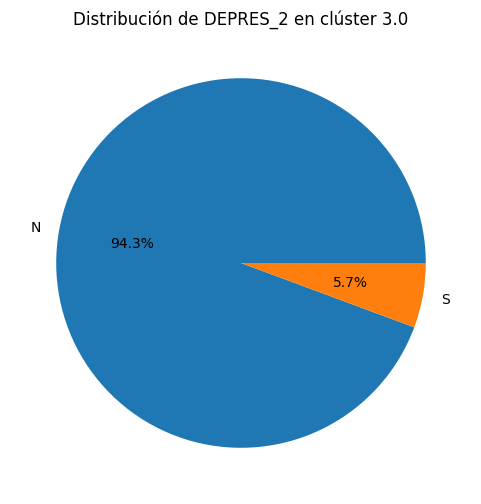

Cluster 8.0, Columna DEPRES_2, Número de datos: 2


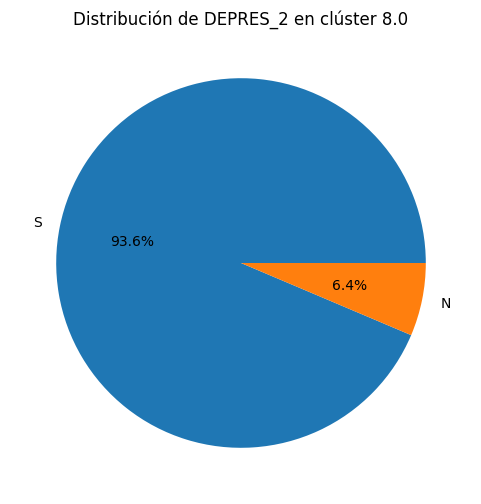

Cluster 6.0, Columna DEPRES_2, Número de datos: 2


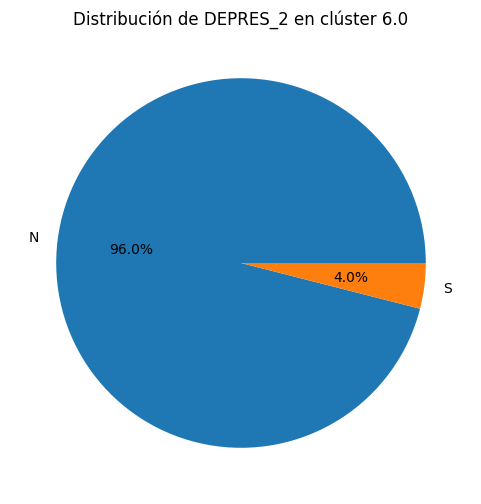

Cluster 2.0, Columna DEPRES_2, Número de datos: 2


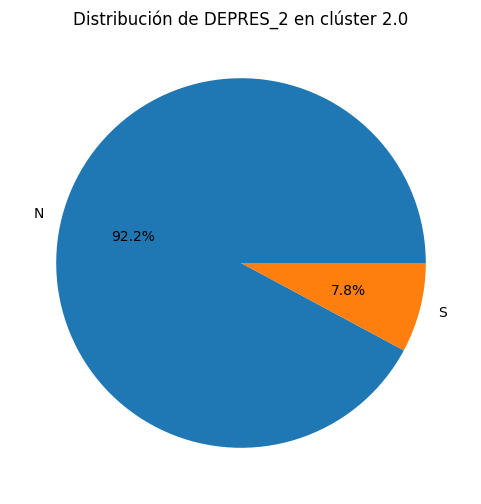

Cluster 5.0, Columna DEPRES_2, Número de datos: 2


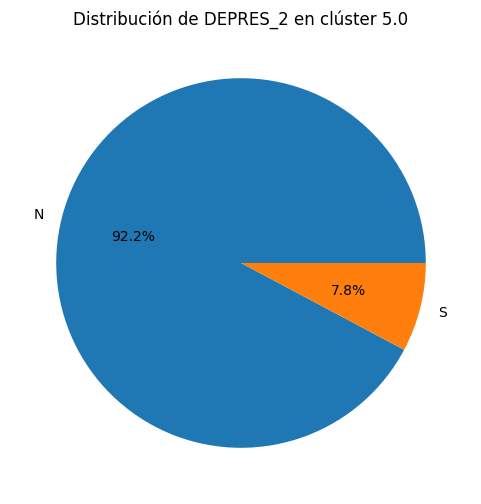

Cluster 1.0, Columna DEPRES_2, Número de datos: 2


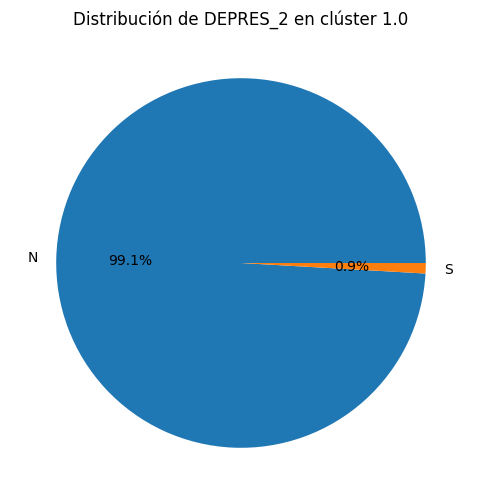

Cluster 0.0, Columna ANSIED_2, Número de datos: 2


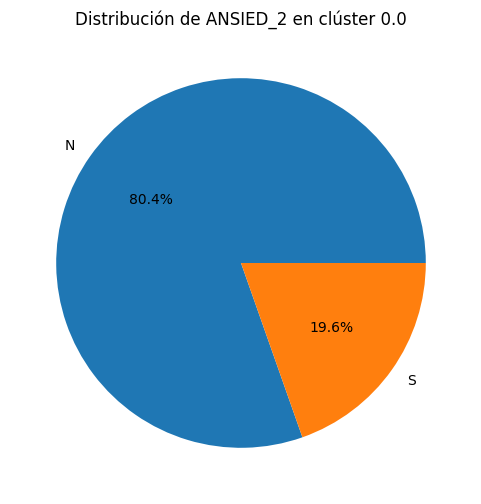

Cluster 4.0, Columna ANSIED_2, Número de datos: 2


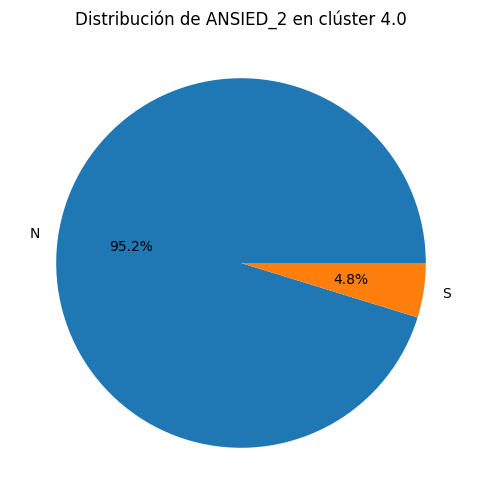

Cluster 7.0, Columna ANSIED_2, Número de datos: 2


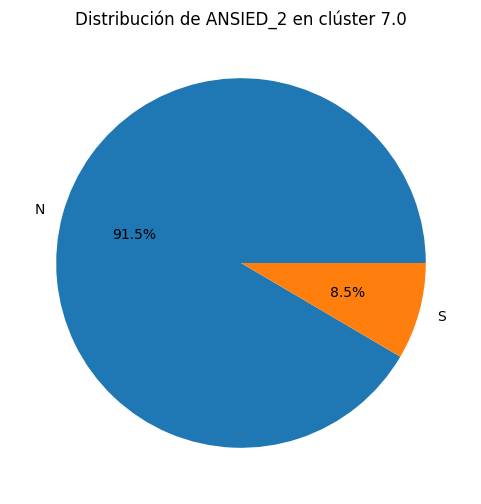

Cluster 3.0, Columna ANSIED_2, Número de datos: 2


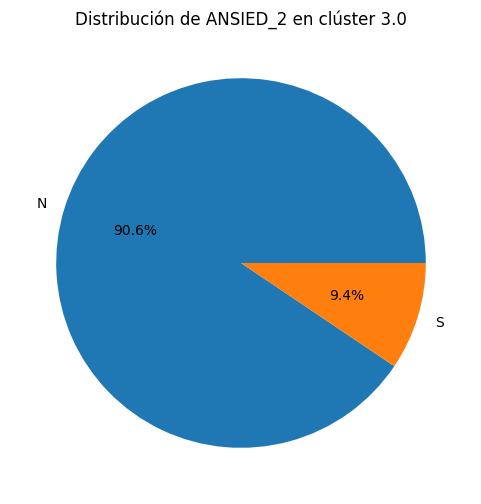

Cluster 8.0, Columna ANSIED_2, Número de datos: 1


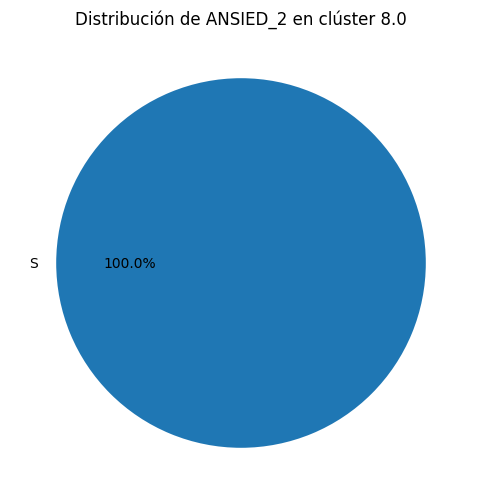

Cluster 6.0, Columna ANSIED_2, Número de datos: 2


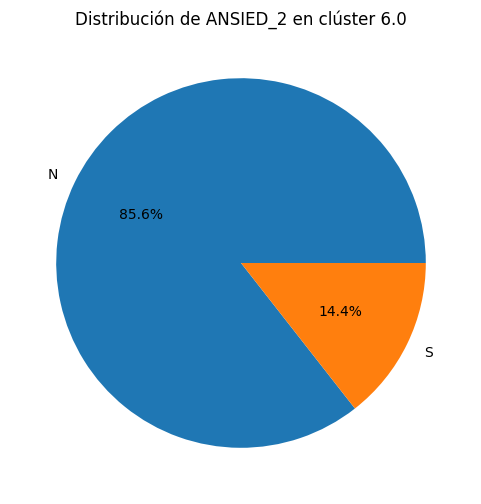

Cluster 2.0, Columna ANSIED_2, Número de datos: 2


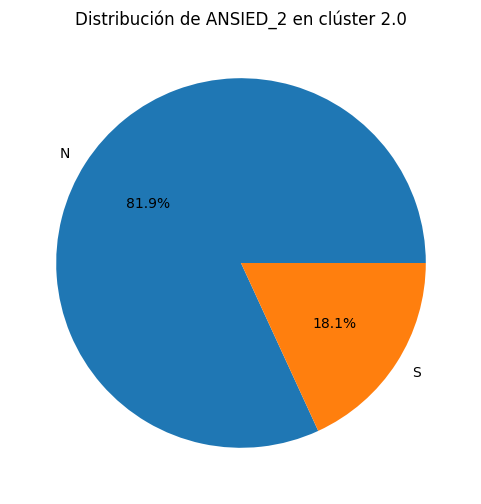

Cluster 5.0, Columna ANSIED_2, Número de datos: 2


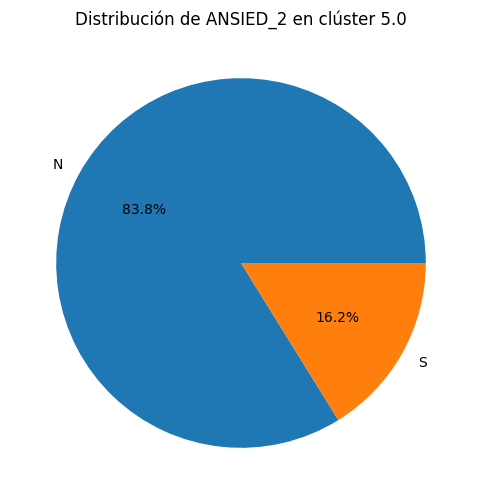

Cluster 1.0, Columna ANSIED_2, Número de datos: 2


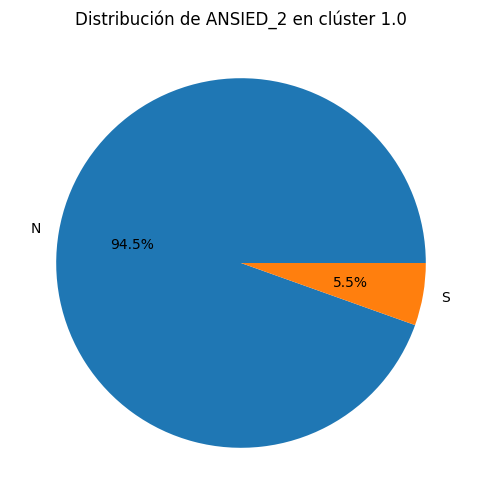

Cluster 0.0, Columna C FATIGA_2, Número de datos: 2


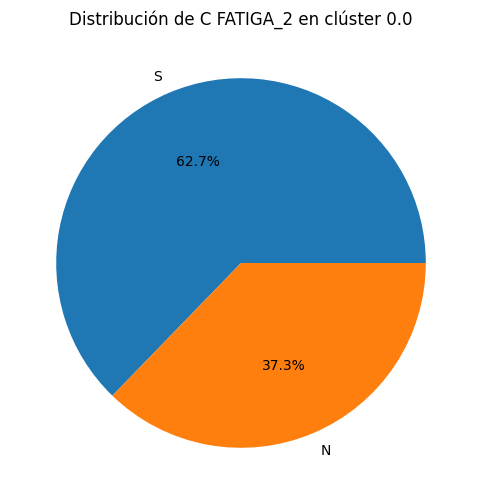

Cluster 4.0, Columna C FATIGA_2, Número de datos: 2


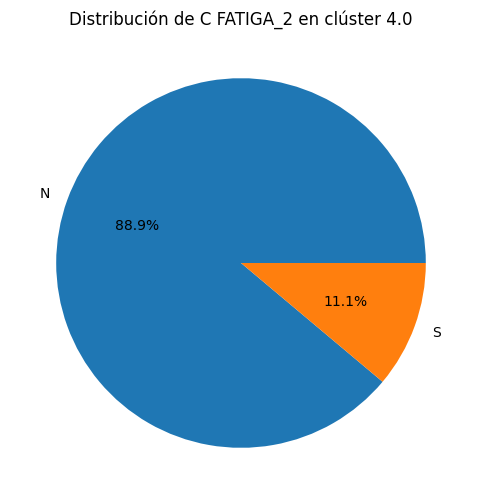

Cluster 7.0, Columna C FATIGA_2, Número de datos: 2


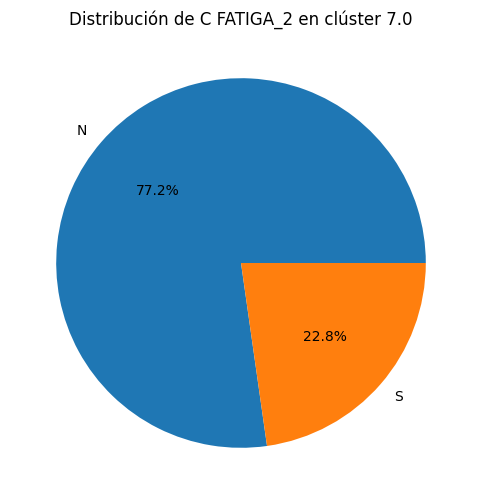

Cluster 3.0, Columna C FATIGA_2, Número de datos: 2


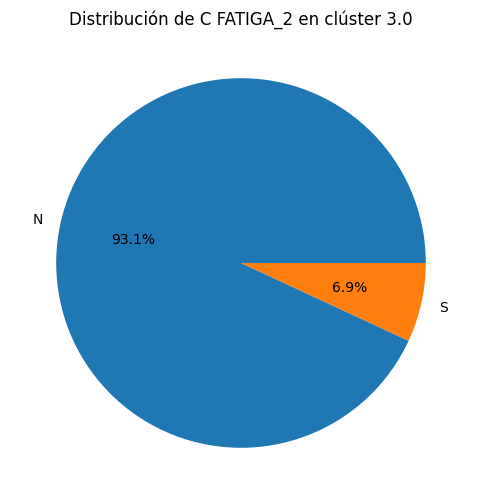

Cluster 8.0, Columna C FATIGA_2, Número de datos: 2


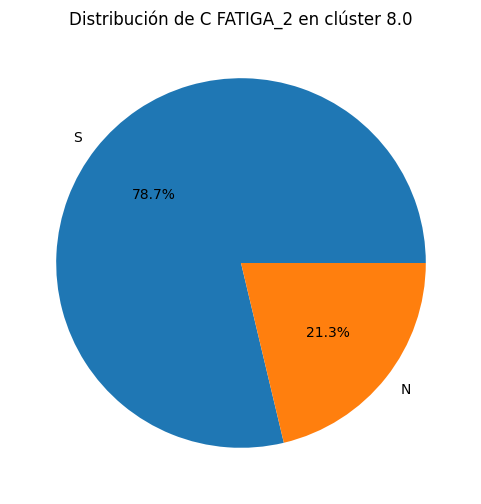

Cluster 6.0, Columna C FATIGA_2, Número de datos: 2


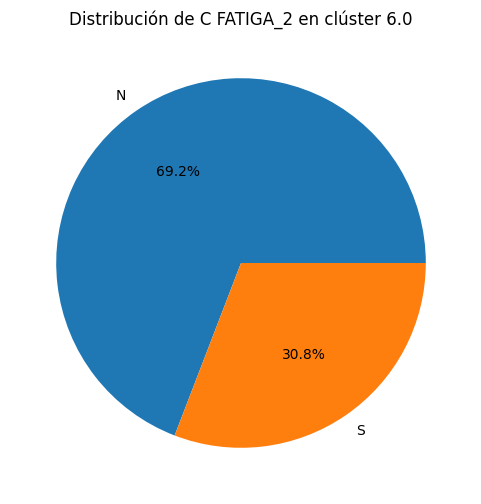

Cluster 2.0, Columna C FATIGA_2, Número de datos: 2


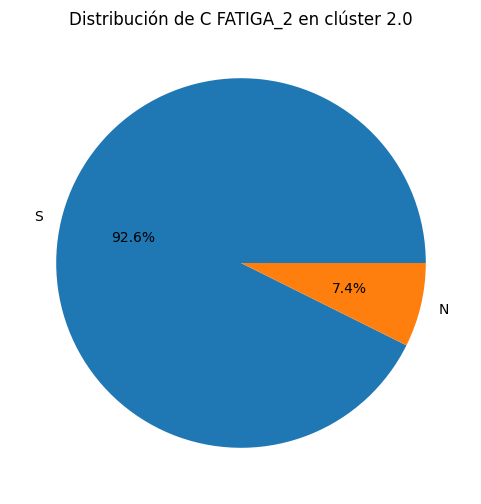

Cluster 5.0, Columna C FATIGA_2, Número de datos: 2


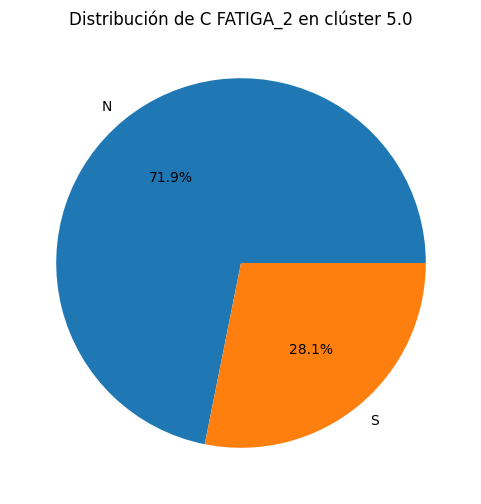

Cluster 1.0, Columna C FATIGA_2, Número de datos: 2


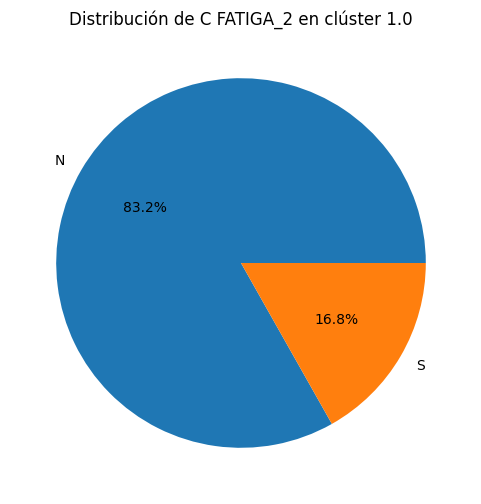

Cluster 0.0, Columna OLOR FAN_2, Número de datos: 2


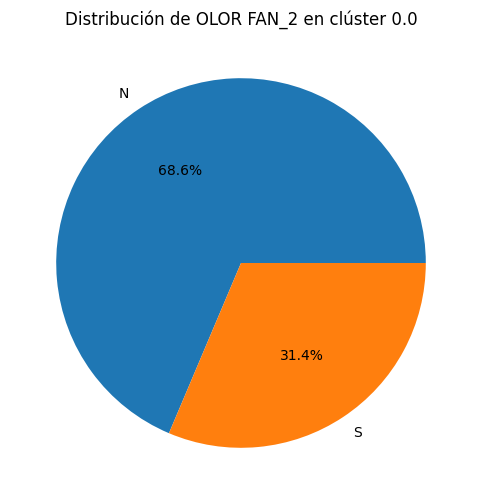

Cluster 4.0, Columna OLOR FAN_2, Número de datos: 2


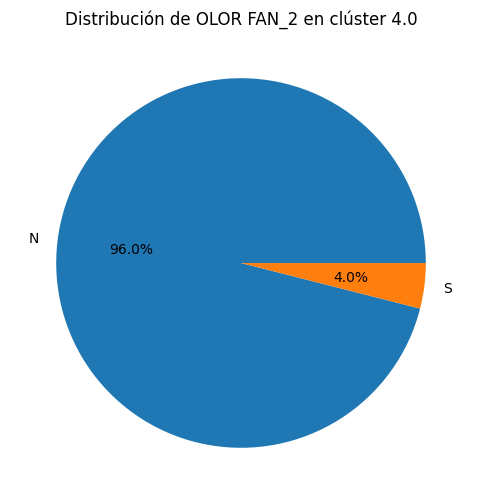

Cluster 7.0, Columna OLOR FAN_2, Número de datos: 2


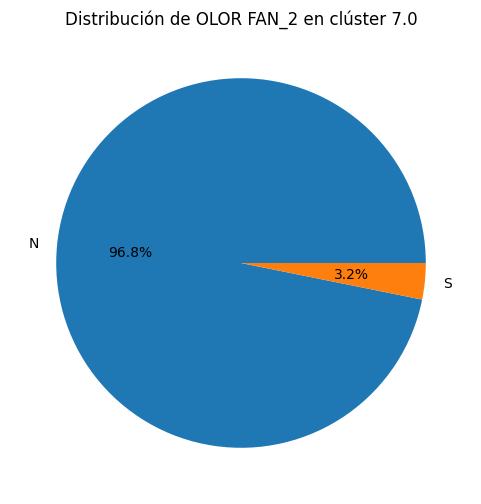

Cluster 3.0, Columna OLOR FAN_2, Número de datos: 2


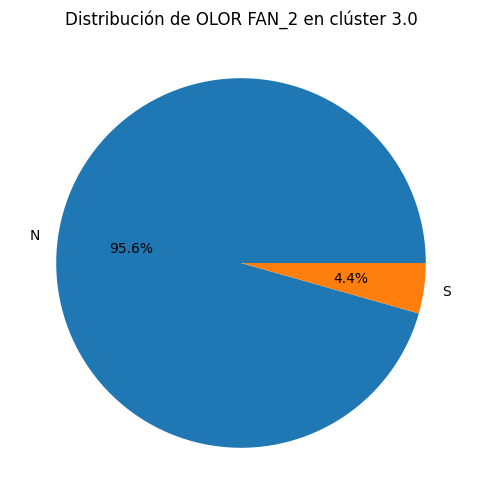

Cluster 8.0, Columna OLOR FAN_2, Número de datos: 2


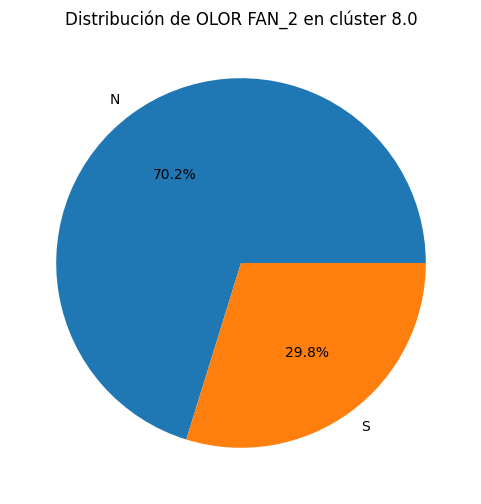

Cluster 6.0, Columna OLOR FAN_2, Número de datos: 2


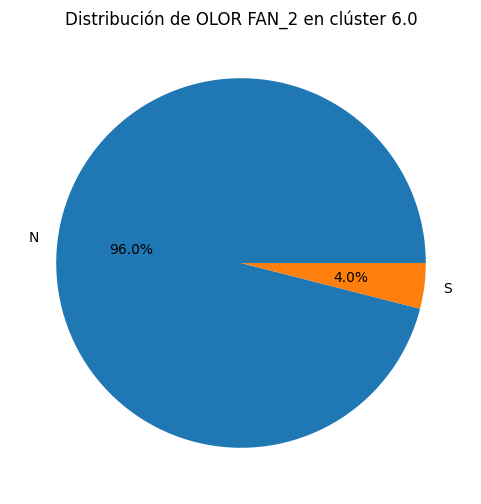

Cluster 2.0, Columna OLOR FAN_2, Número de datos: 2


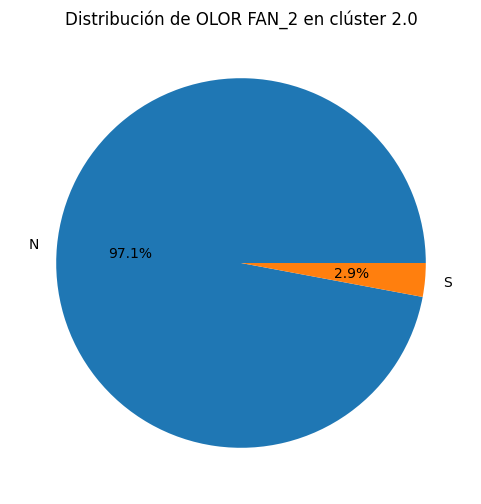

Cluster 5.0, Columna OLOR FAN_2, Número de datos: 2


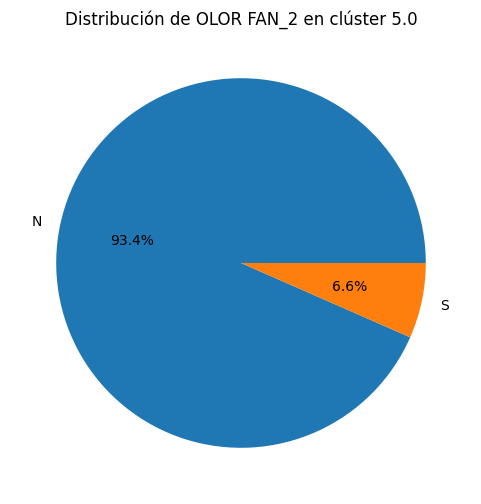

Cluster 1.0, Columna OLOR FAN_2, Número de datos: 2


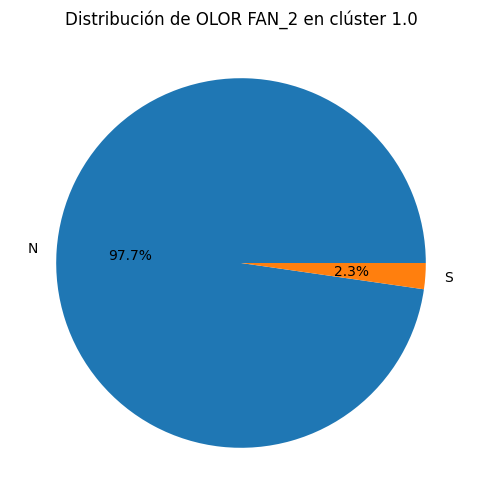

Cluster 0.0, Columna VERTIGO_2, Número de datos: 2


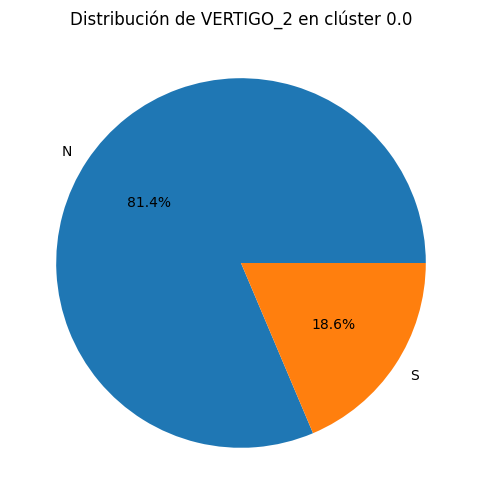

Cluster 4.0, Columna VERTIGO_2, Número de datos: 2


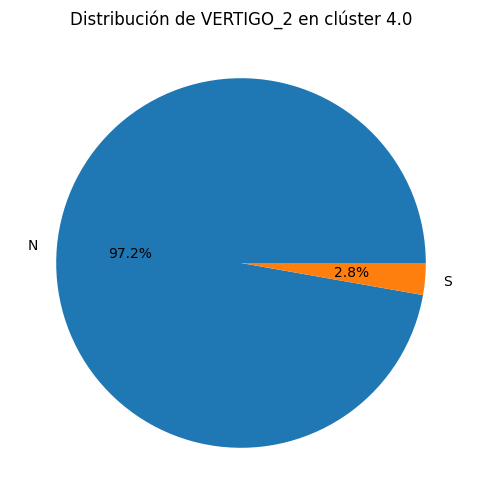

Cluster 7.0, Columna VERTIGO_2, Número de datos: 2


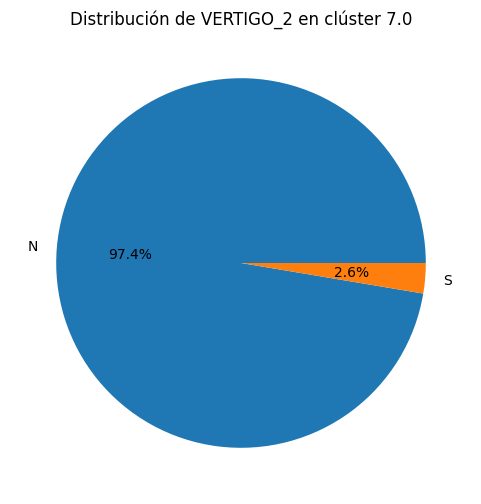

Cluster 3.0, Columna VERTIGO_2, Número de datos: 2


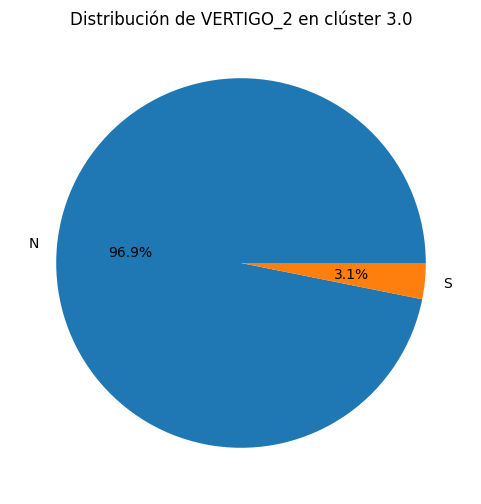

Cluster 8.0, Columna VERTIGO_2, Número de datos: 2


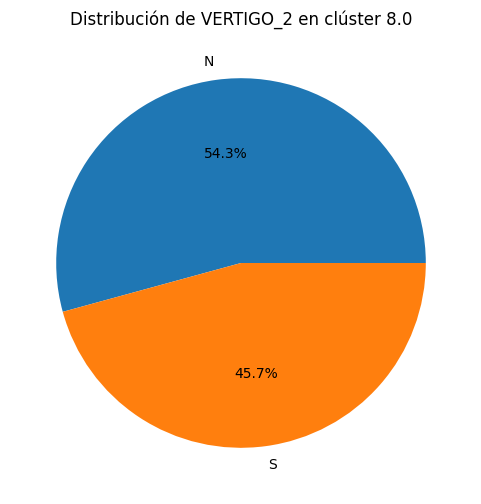

Cluster 6.0, Columna VERTIGO_2, Número de datos: 2


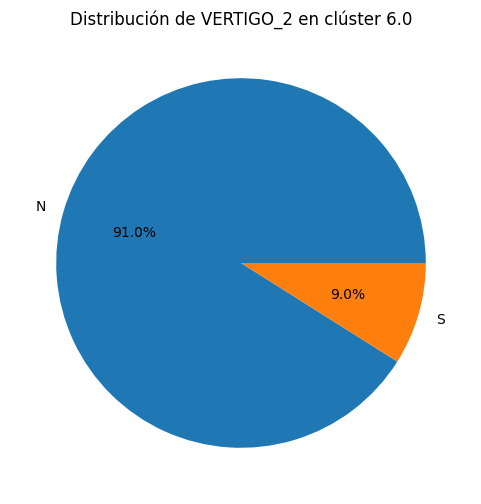

Cluster 2.0, Columna VERTIGO_2, Número de datos: 2


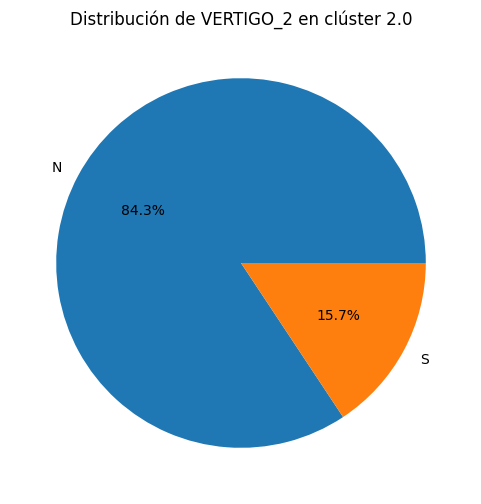

Cluster 5.0, Columna VERTIGO_2, Número de datos: 2


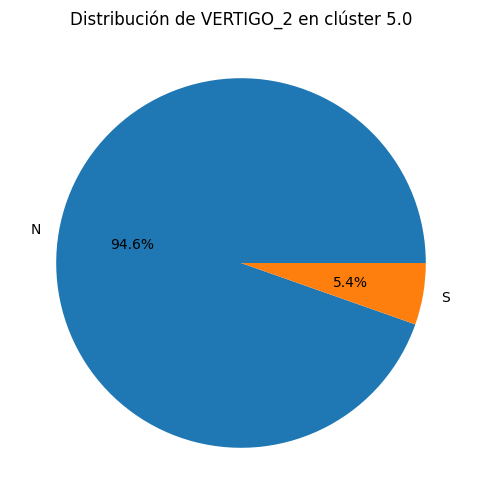

Cluster 1.0, Columna VERTIGO_2, Número de datos: 2


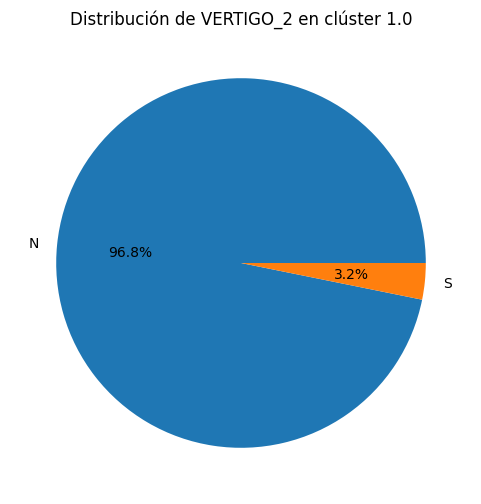

In [294]:
#=========================ANALISIS DESCRIPTIVO POR CADA CLIUSTER============
for columna in covid_after.columns:
    if columna != 'cluster':
        # Filtrar solo las primeras num_filas del DataFrame
        datos_filtrados = covid_after.iloc[:len(spectral_clustering_after.labels_)]

        for cluster in datos_filtrados['cluster'].unique():
            # Filtrar solo las filas donde 'cluster' no sea NA
            datos_cluster = datos_filtrados[datos_filtrados['cluster'] == cluster][columna].value_counts()

            # Mostrar cuántos datos hay en este clúster y columna
            print(f"Cluster {cluster}, Columna {columna}, Número de datos: {len(datos_cluster)}")

            if not datos_cluster.empty:
                plt.figure(figsize=(6, 6))
                plt.pie(datos_cluster, labels=datos_cluster.index, autopct='%1.1f%%')
                plt.title(f"Distribución de {columna} en clúster {cluster}")
                plt.show()
            else:
                print(f"No hay datos suficientes para la columna {columna} en el clúster {cluster}")